In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
from astropy.time import Time
import astropy.units as u
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions

from importlib import reload

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_seconds = 86400

## Looking for ETVs in TIC 193822785


In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid = 193822785

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../


sr = lk.search_lightcurve('TIC {}'.format(ticid))  # get long cadence data too
sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC', 'QLP'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[sr.exptime != 1800 *u.s]  # exclude 30min cadence data for now (TESS-SPOC, sectors 18, 19, 23 )
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
with astropy.conf.set_temp("max_lines", -1):
    display(sr)
lcc_tess = sr.download_all()

def use_sap_flux(lc):
    """Helper over select_flux("sap_flux") to ensure flux_err is populated for QLP case"""
    if lc.meta.get("AUTHOR") == "QLP":
        # select_flux("sap_flux") on QLP data will lead to nan flux_err
        # because QLP lc only has err on kspsap_flux / det_flux
        return lc
    else:
        return lc.select_flux("sap_flux")
lc_tess = lcc_tess.stitch(
    # corrector_func=lambda lc: use_sap_flux(lc).normalize()
)
# lc_tess = lc_tess.truncate(None, 1450)  # use data from sectors 2 - 3 for now


search_result = lc_tess

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 25,2020,SPOC,120,193822785,0.0,G022119
1,TESS Sector 26,2020,SPOC,120,193822785,0.0,G022119
2,TESS Sector 40,2021,SPOC,120,193822785,0.0,G04171
3,TESS Sector 52,2022,SPOC,120,193822785,0.0,G04171
4,TESS Sector 53,2022,SPOC,120,193822785,0.0,G04171
5,TESS Sector 54,2022,SPOC,120,193822785,0.0,G04171
6,TESS Sector 74,2024,SPOC,120,193822785,0.0,G06057
7,TESS Sector 79,2024,SPOC,120,193822785,0.0,G06057
8,TESS Sector 80,2024,SPOC,120,193822785,0.0,G06057


180568

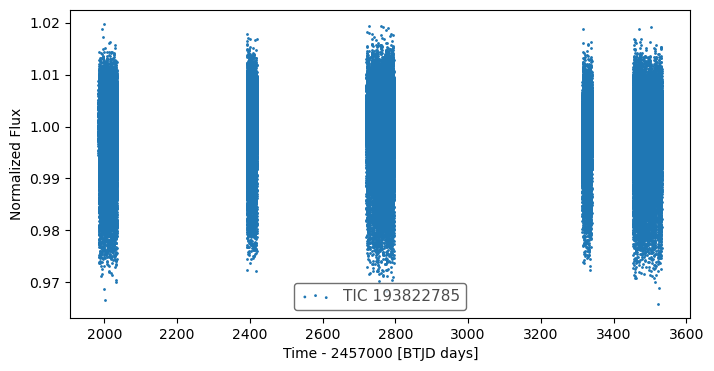

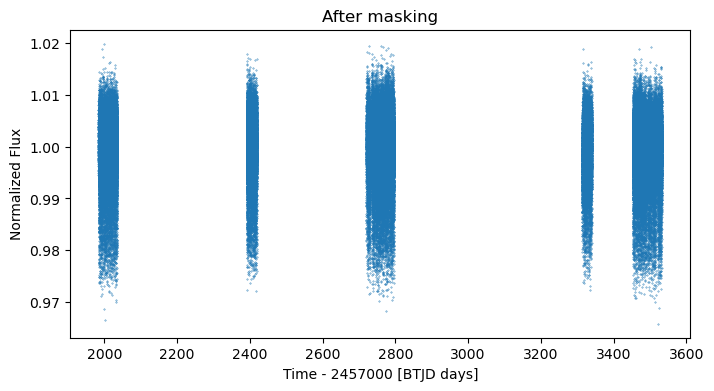

In [5]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

mask = time < 0  #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data
# mask = flux < 0.85    # remove occasional outliers
# mask = (
#     ( flux < 0.95 ) | # remove occasional lone outliers
#     # cadences where scattered light effect is prevalent
#     ( (time > 2718)   & (time < 2744) )
# )

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
do_ls = False

if do_ls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg as lke_pg  # at ../../

    lc = lk.LightCurve(time=Time(time, format="btjd"), flux=flux, flux_err=fluxerr)
    lc.meta["LABEL"] = f"TIC {ticid}"
    pg = lc.to_periodogram(method="lombscargle",
                           # maximum_period=10,
                           # minimum_period=0.4,
                           # ls_method="fastchi2", nterms=2,
                           # oversample_factor=50,  # default: 5
                          )

    pg.show_properties();
    print(pg.period_at_max_power);

    ax = lke_pg.plot_pg_n_mark_max(pg, max_period_factor=10);

    ax = pg.plot(view="frequency");  # frequency view
    ax.set_xlim(pg.frequency_at_max_power.value / 100 , pg.frequency_at_max_power.value * 10);

    ax = pg.plot(view="frequency", unit=u.microhertz, scale="log");

    axs, lcs = lke_pg.plot_lc_with_model(
        lc,
        pg,
        plot_lc=False, plot_model=False, plot_folded_model=True,
        also_return_lcs=True);


In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

### Define epoch, period, duration

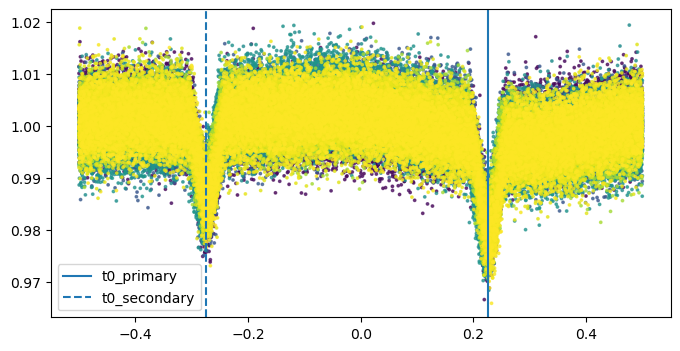

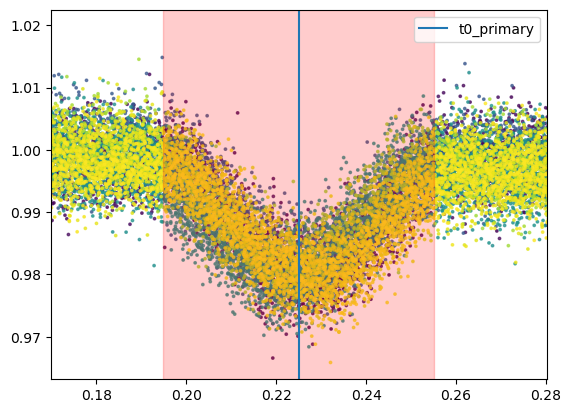

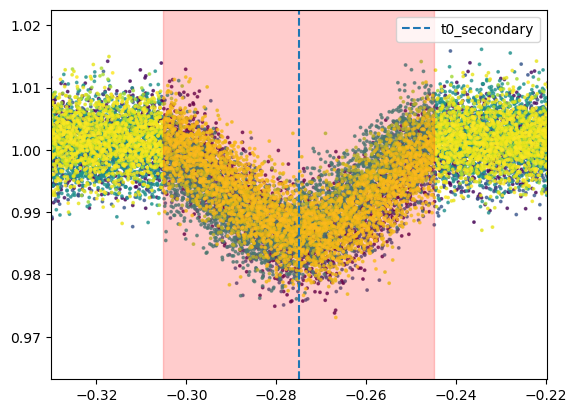

In [14]:
%matplotlib inline
# %matplotlib widget

# define the orbital period and the t0
# epoch=3454.965, duration_hr=1.4, period=0.966796, label="EB-deep",
# MCMC on df_primary: p: 0.9667998141055667, std_p: 1.3862204851627484e-07 ; t0: 1984.4655031175657, std_t0: 0.00015454233080487302

# FILL-IN THE eclipse epoch / period,
# period = 0.966796  # visual
period = 0.966799  # MCMC

t0_primary = 3454.965  # visual
t0_primary = 1984.466 # or 1984.465, MCMC
t0_secondary = t0_primary + period / 2

duration_hr_primary = 1.4
duration_hr_secondary = 1.4

# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

t0_for_plotting = 0  # keep 0 for plotting purposes
if t0_secondary is not None:
    t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

### Compare folded plots across sectors

In [ ]:
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_primary)
        lc_f = lc_f.truncate(-duration_hr_primary * 2 / 24, duration_hr_primary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around primary eclipses");
plt.tight_layout();

# ---
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_secondary)
        lc_f = lc_f.truncate(-duration_hr_secondary * 2 / 24, duration_hr_secondary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around secondary eclipses");
plt.tight_layout();

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
data["flux_original"] = data.flux  # save the original flux 

In [ ]:
# show data to visualize what's changed in each step below
data

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period 
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period 
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

In [ ]:
# # Uncomment to use the detrended flux
# #
# print("Use deterended flux")
# data.flux = data.flux_detrended

### Now that the data is ready we can start 

- generally the clipped LC window is ***smaller*** than the eclipse duration, to avoid the complication of fitting ingress/egress.

In [16]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.8 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
    window_width_s = 0.8 * duration_hr_secondary / 24 / period
    # window_width_s = 0.22
    print("window_width_s (phase):", window_width_s)

    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V)
# t0 in normalixed phase
start_vals = [0.999, -0.0183, midpoint_p, 0.01584, 0.96]
start_vals_s = [1.0, -0.0132, midpoint_s, 0.015, 1.0]

# -- -- -- -- -- -- -- -- --
# etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess_interactive(data_primary, ph_binned, flux_binned, err_binned, "midpoint_p", *start_vals)
if t0_secondary is not None:
    # etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)
    etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_primary:")
print(f"[{start_vals[0]}, {start_vals[1]}, {t0_primary}, {start_vals[3]}, {start_vals[4]}, {period}],");

Primary:   1984.466 0.22500000000000275
window_width_p (phase): 0.04826925417451473
Secondary: 1983.9826004999998 -0.2750000000001341
window_width_s (phase): 0.04826925417451473


Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Output(layout=Layout(padding='1em 0px'))

Output(layout=Layout(padding='1em'))

Start params for  fitting period with MCMC on df_primary:
[0.999, -0.0183, 1984.466, 0.01584, 0.96, 0.966799],


In [ ]:
if False:
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 4000/4000 [16:37<00:00,  4.01it/s]


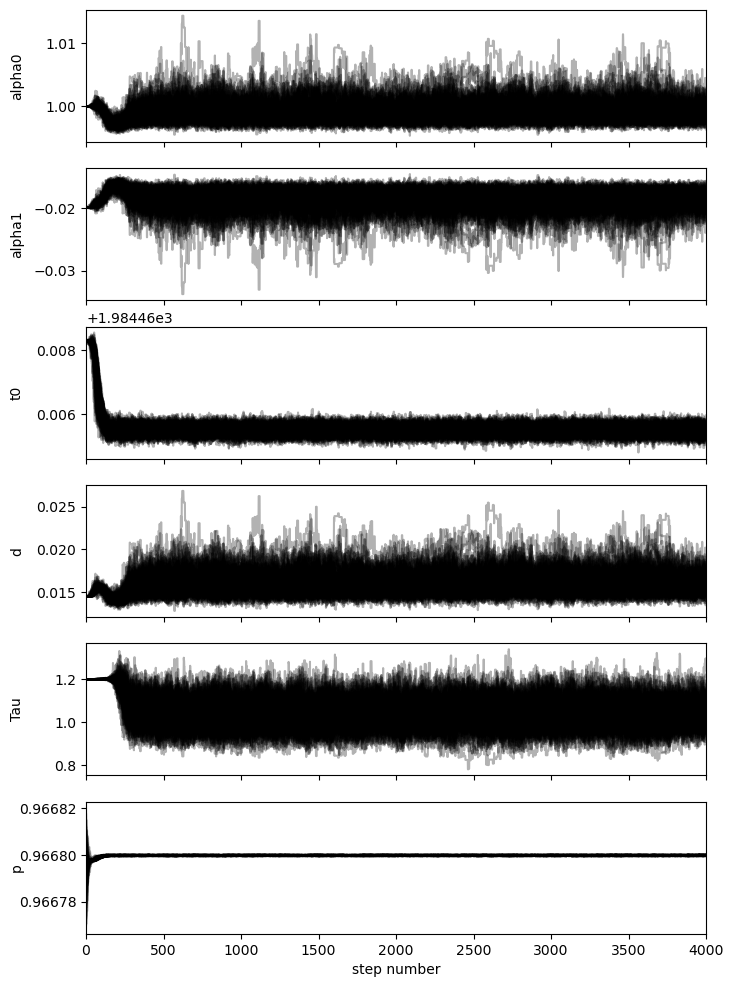

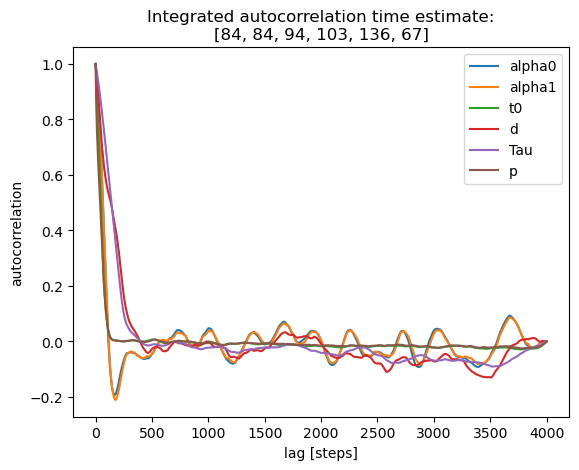

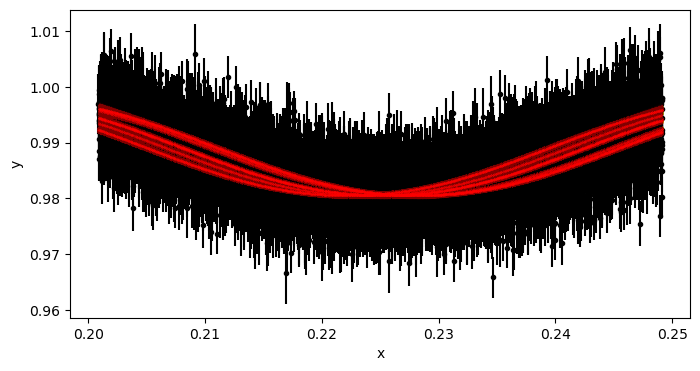

mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = 0.998903739654674, -0.018328490861933208, 1984.4655031175657, 0.015836572399943558, 1.0432720995848732, 0.9667998141055667
std_p: 1.3862204851627484e-07 ; std_t0: 0.00015454233080487302


In [13]:
# use MCMC to refine the period

use_mcmc_to_fit_period = True


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()

    # MCMC result
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        [1.0, -0.02, 1984.4682840000003, 0.0145, 1.2, 0.966796],
        # nruns=20, discard=1, # for a sanity test,  to ensure the initial guess is not way off.
        nruns=4000, discard=100,
        autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient
        pool=-2,
        plot_chains=True,
        plot_autocorrelation=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"], "; std_t0:", fit_params_p_stats['std_t0'])
    !$NOTIFY_CMD "Fitting period done."

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 3000/3000 [04:22<00:00, 11.42it/s]


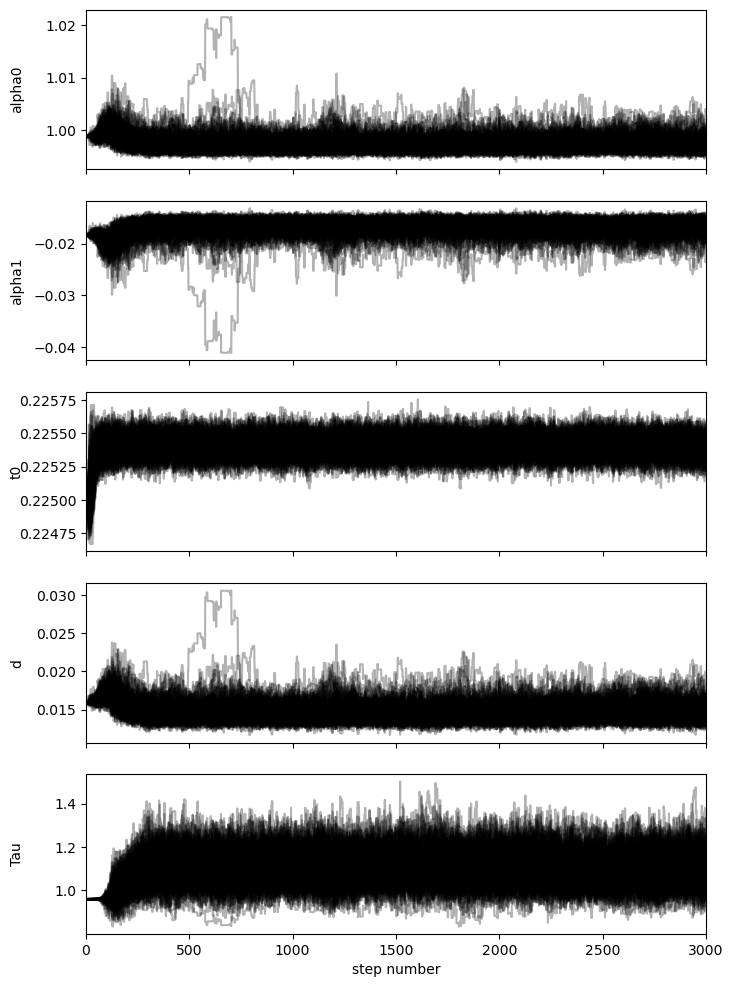

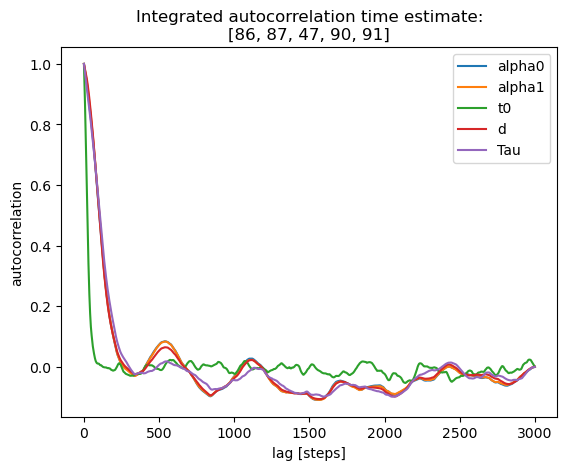

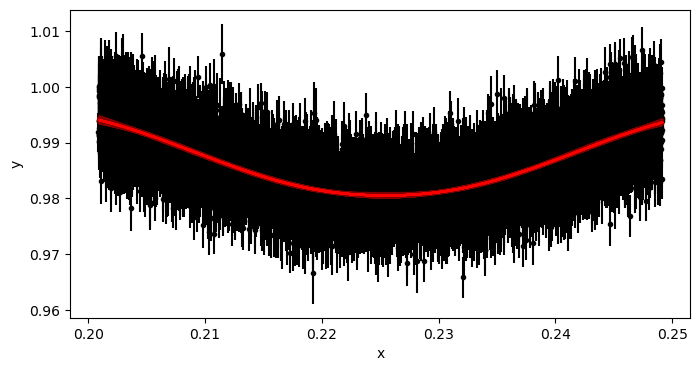

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 3000/3000 [04:19<00:00, 11.58it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 4 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [256.53885027 256.58370821  93.62911243 267.04963643 254.89296243]


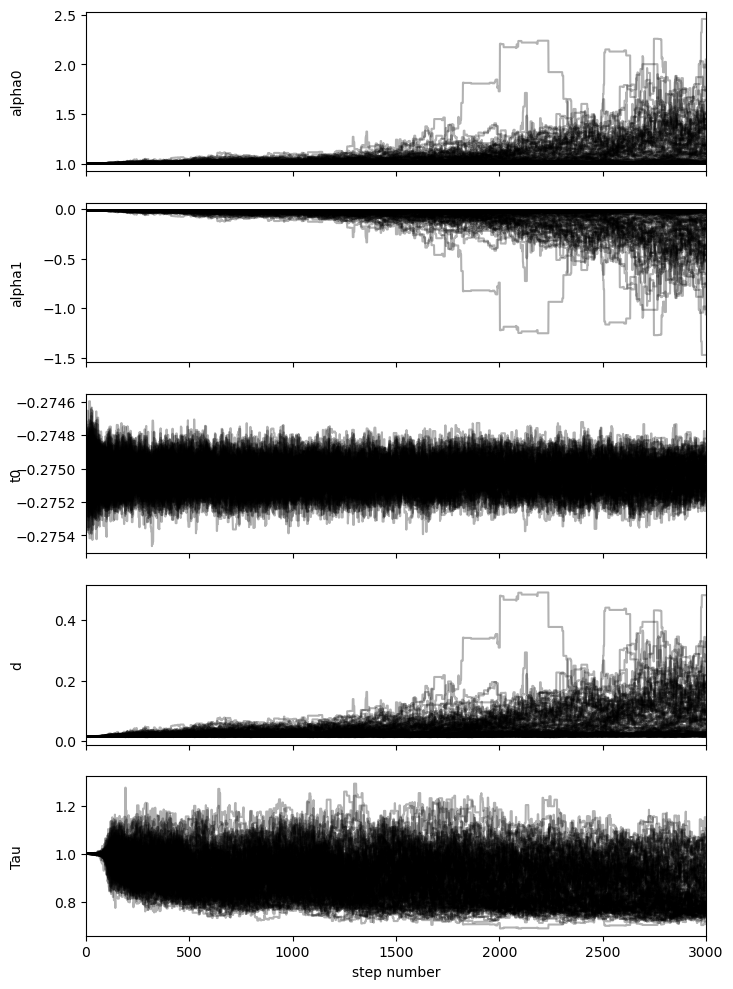

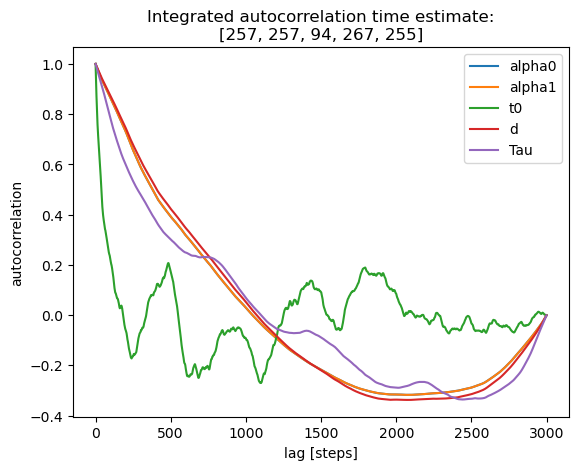

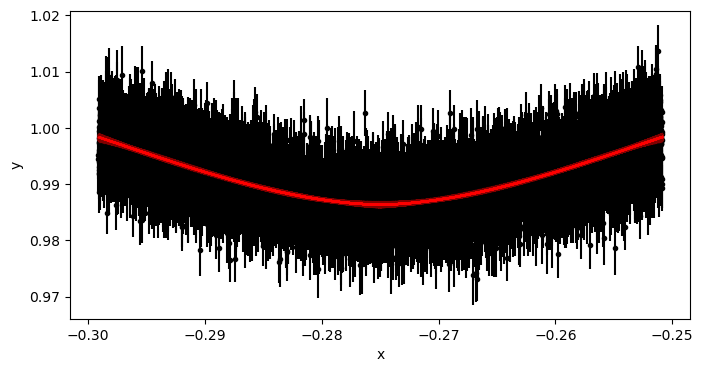

In [17]:
# run the initial model fit using MCMC for the primary and secondary eclipses
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, fit_params_stats = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=3000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, fit_params_s_stats = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=3000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    !$NOTIFY_CMD "Initial fit done"

In [ ]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params from TESS data
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 0.9970848499193721, -0.016442307920396693, 0.22540495676725142, 0.014474062902073695, 1.1060692653551194
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0107342526928313, -0.02429237220533457, -0.27504235055632187, 0.023126962784699955, 0.8808373614161793

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])

In [19]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 0.9970848499193721, -0.016442307920396693, 0.22540495676725142, 0.014474062902073695, 1.1060692653551194
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0107342526928313, -0.02429237220533457, -0.27504235055632187, 0.023126962784699955, 0.8808373614161793


1600

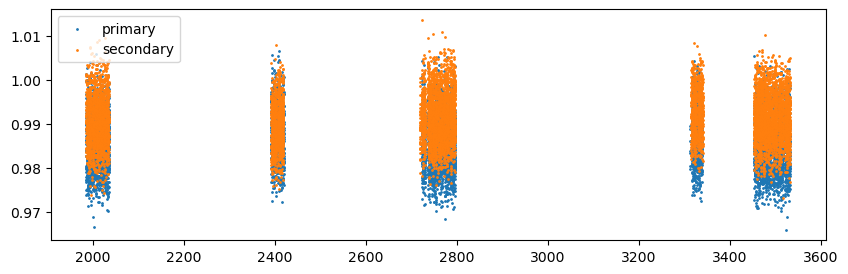

In [20]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1984.466 0.966799 1984.466


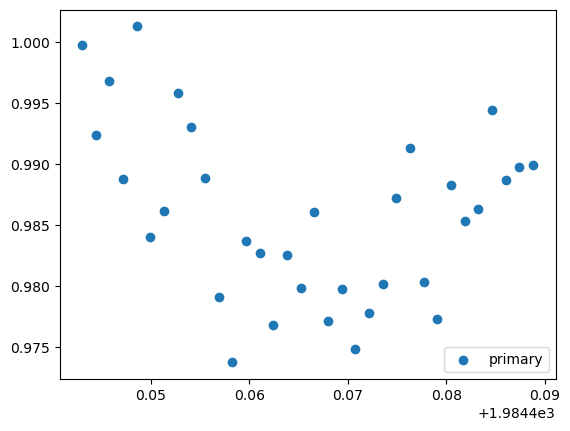

1984.466 0.966799 1985.432799


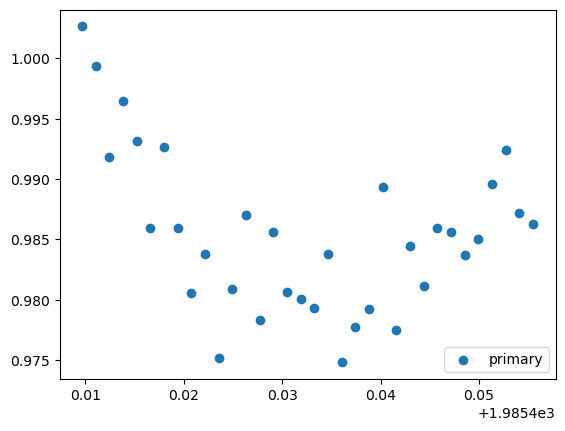

1984.466 0.966799 1986.399598


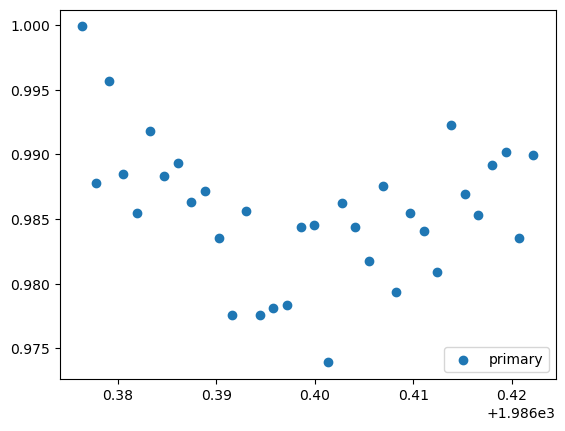

1984.466 0.966799 3528.4440029999996


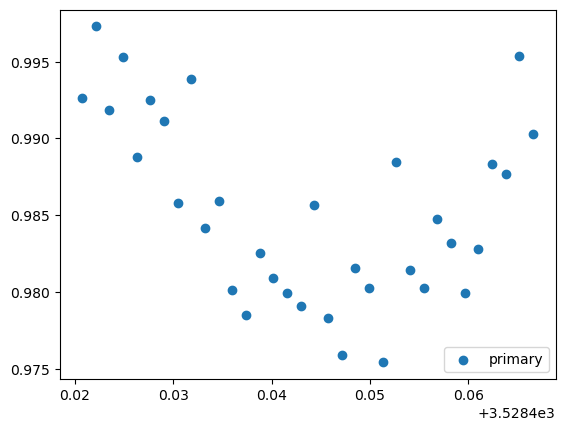

1984.466 0.966799 3529.410802


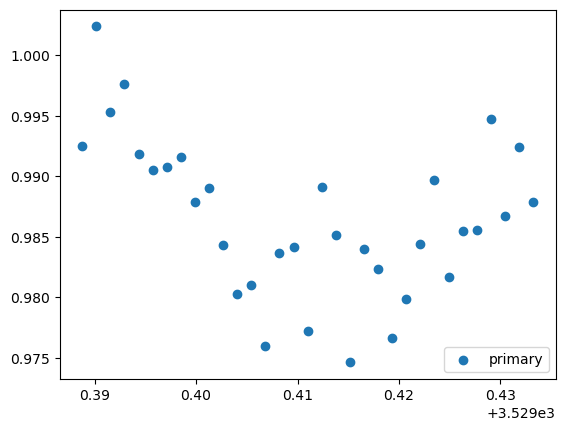

1984.466 0.966799 3530.377601


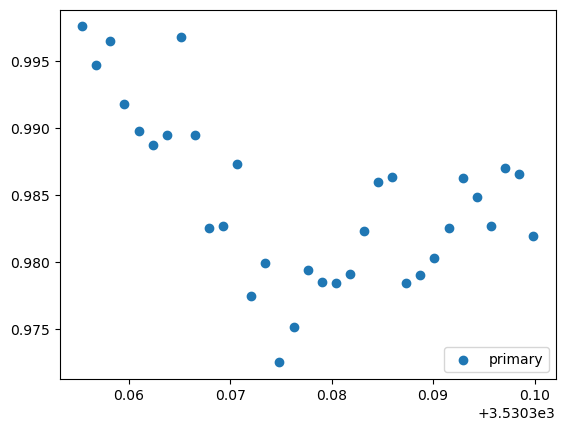

1983.9826004999998 0.966799 1983.9826004999998


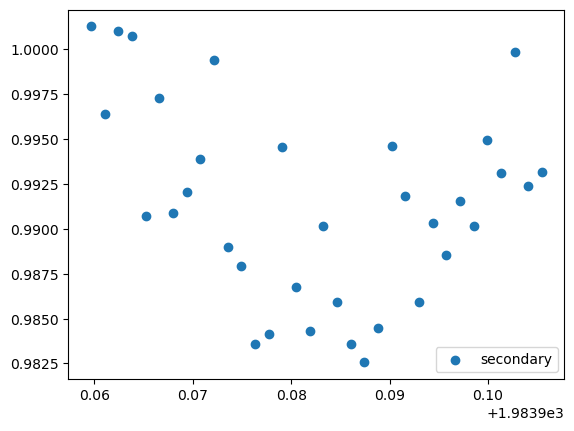

1983.9826004999998 0.966799 1984.9493994999998


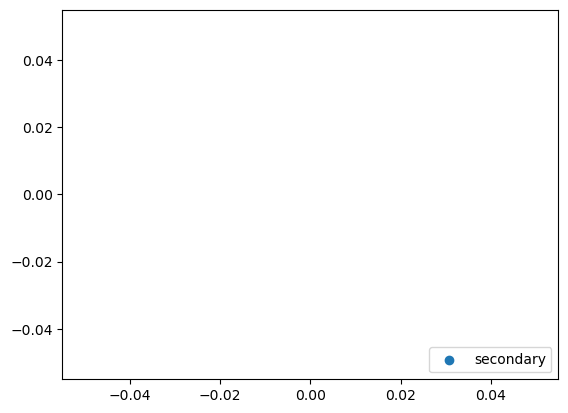

1983.9826004999998 0.966799 1985.9161984999998


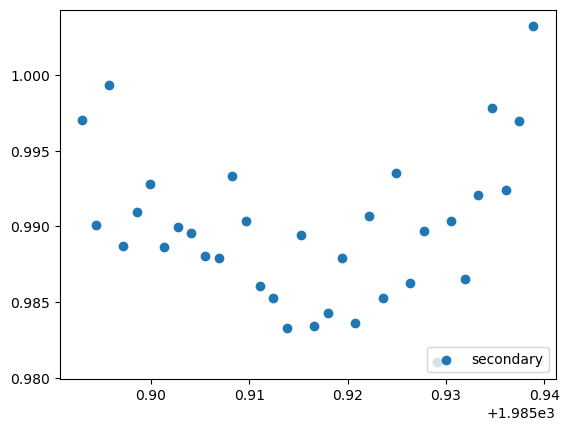

1983.9826004999998 0.966799 3527.9606034999997


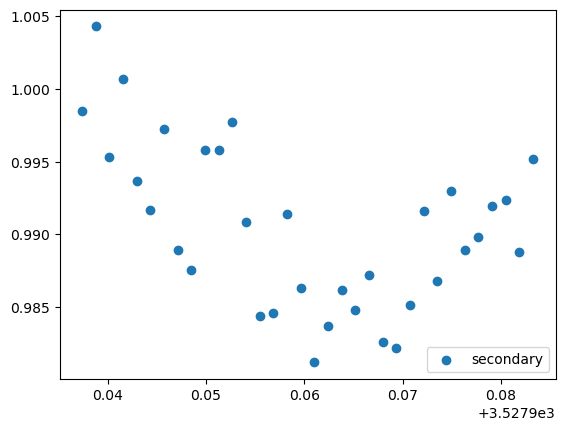

1983.9826004999998 0.966799 3528.9274024999995


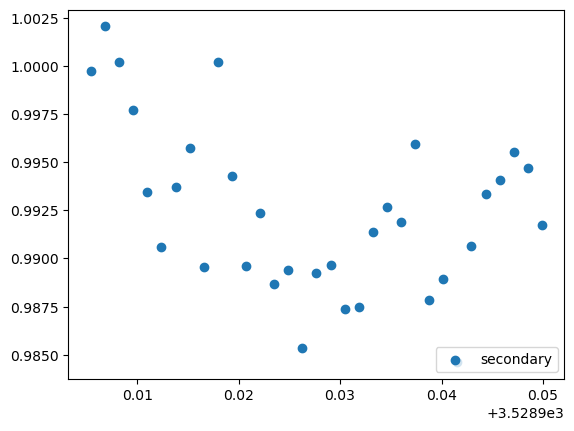

1983.9826004999998 0.966799 3529.8942015


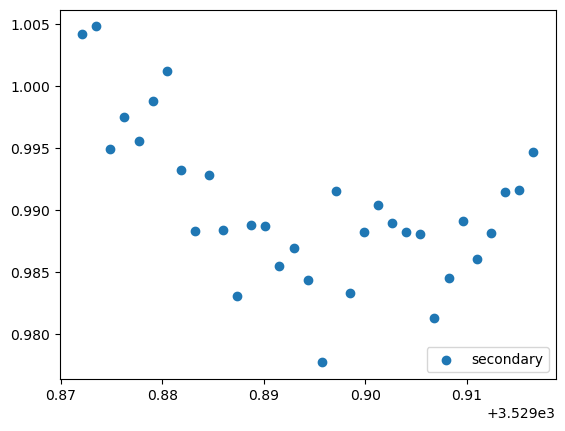

In [21]:
tr_index = range(0,n_transits)

for i in np.concatenate( (tr_index[0:3], tr_index[-3:]) ): 
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux)
    yerr = np.array(data_primary.err)

    print (t0_primary, period, transit_time)

    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period)))

    x = np.array(x[mask])
    y = np.array(y[mask])
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()


if t0_secondary is not None:
    for i in np.concatenate( (tr_index[0:3], tr_index[-3:]) ): 
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux)
        yerr = np.array(data_secondary.err)

        print (t0_secondary, period, transit_time)

        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period)))

        x = np.array(x[mask])
        y = np.array(y[mask])
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

### Fit individual eclipses

In [22]:
# Provide a warning if the expected number of data points per clipped LC is smaller than the default minimum `min_number_data` (20)
longest_cadence = np.max(sr.exptime)
est_number_data_primary   = int(window_width_p  * period * 24 / longest_cadence.to(u.hr).value)
print(f"Expected num of data points of a clipped LC in longest cadence ({longest_cadence}) for primary: {est_number_data_primary}")
if est_number_data_primary < 20:
    display(HTML("<span style='background-color: rgba(255, 0, 0, 0.7); padding-left: 1ch; padding-right: 1ch;'>WARN:</span> num of data points for a clipped LC (primary) < 20"))

if t0_secondary is not None:
    est_number_data_secondary = int(window_width_s  * period * 24 / longest_cadence.to(u.hr).value)
    print(f"Expected num of data points of a clipped LC in longest cadence ({longest_cadence}) for secondary:  {est_number_data_secondary}")
    if est_number_data_secondary < 20:
        display(HTML("<span style='background-color: rgba(255, 0, 0, 0.7); padding-left: 1ch; padding-right: 1ch;'>WARN:</span> num of data points for a clipped LC (secondary) < 20"))

Expected num of data points of a clipped LC in longest cadence (120.0 s) for primary: 33
Expected num of data points of a clipped LC in longest cadence (120.0 s) for secondary:  33


Fitting individual primary eclipses...
Creating new manifest file
1984.466 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.18it/s]


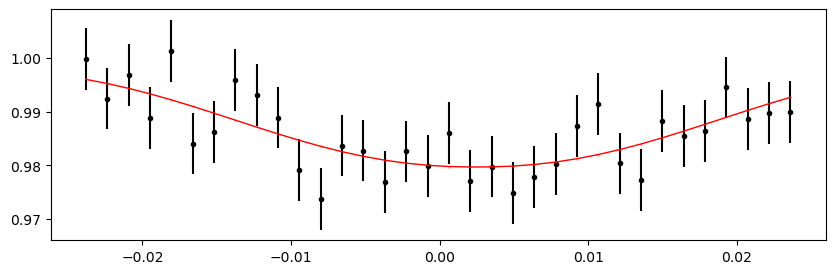

1985.432799 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.67it/s]


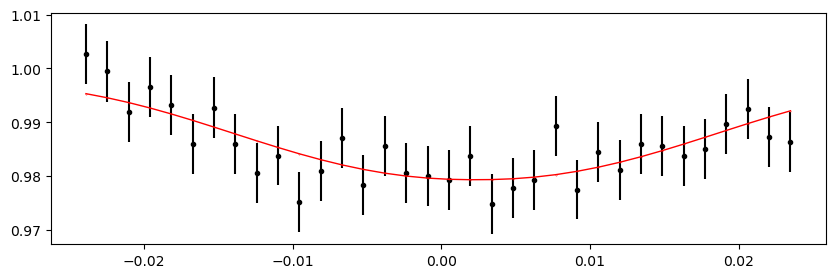

1986.399598 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.80it/s]


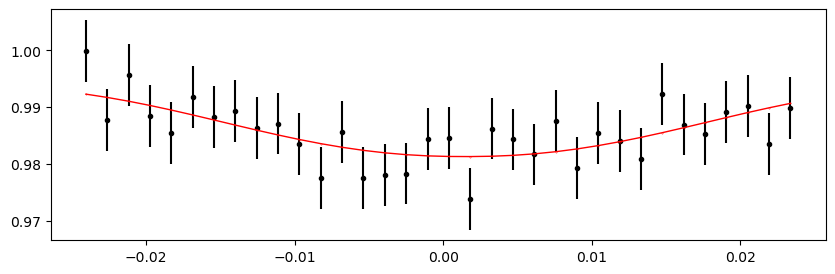

1987.366397 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.67it/s]


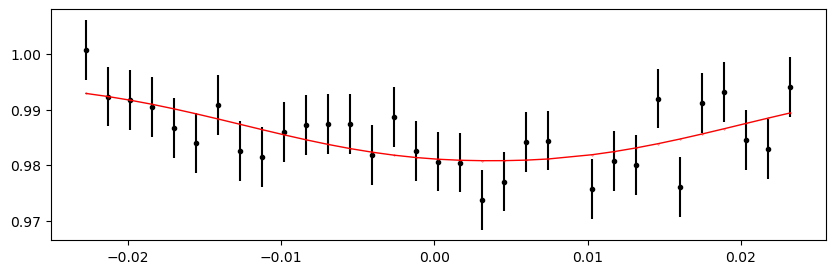

1988.3331959999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.40it/s]


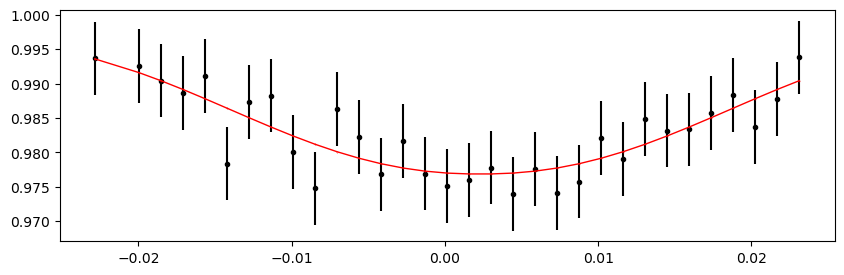

1989.2999949999999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.13it/s]


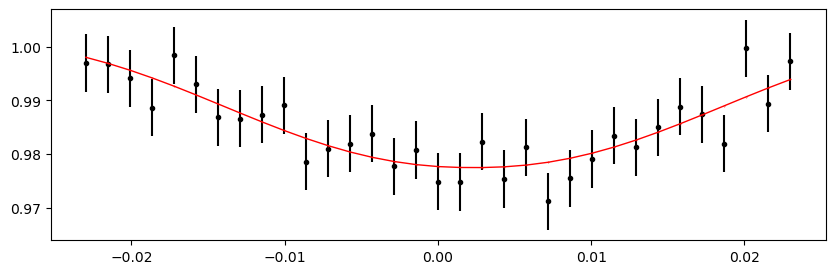

1990.266794 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.34it/s]


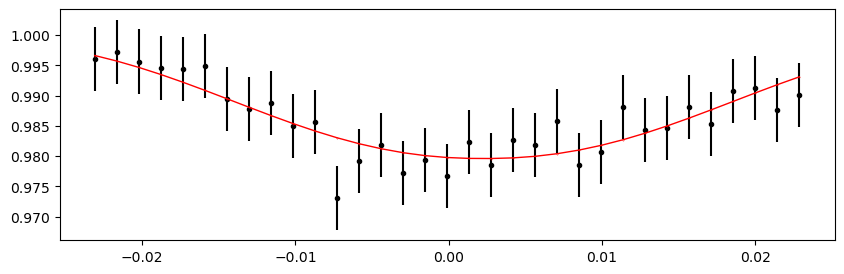

1991.233593 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.35it/s]


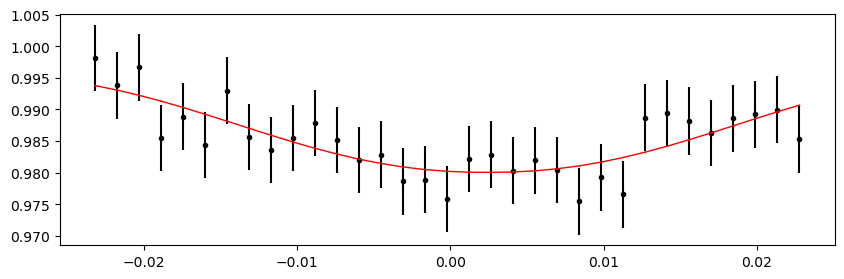

1992.200392 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.91it/s]


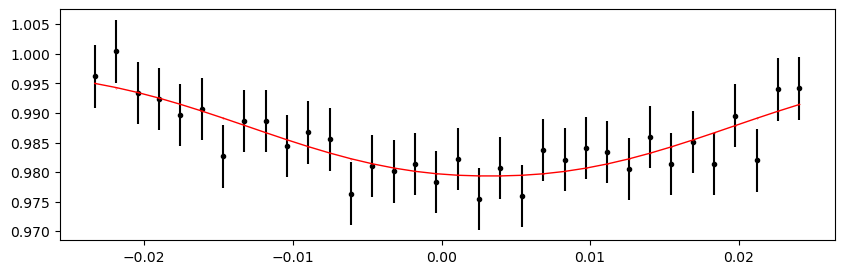

1993.167191 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.11it/s]


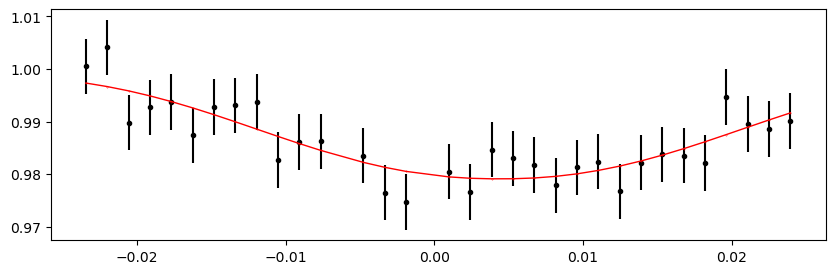

1994.1339899999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.60it/s]


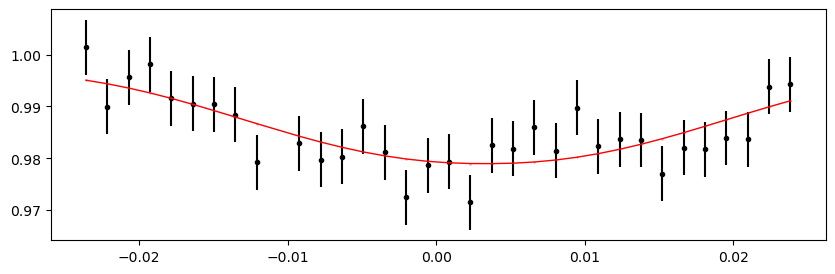

1995.1007889999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.59it/s]


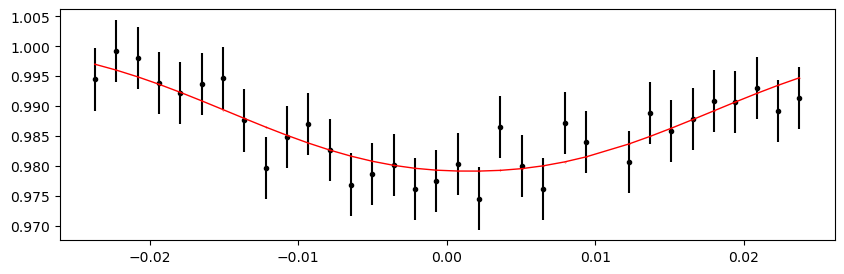

1997.034387 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.76it/s]


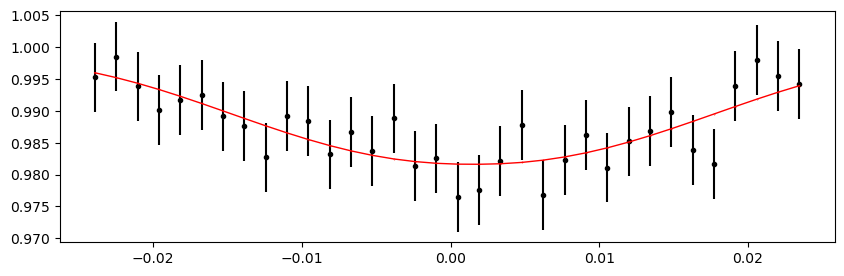

1998.001186 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.64it/s]


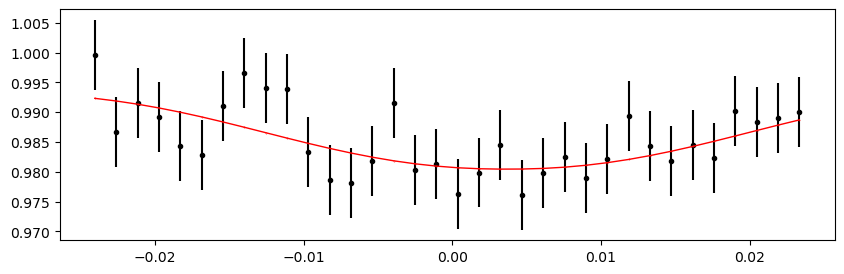

1998.967985 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.42it/s]


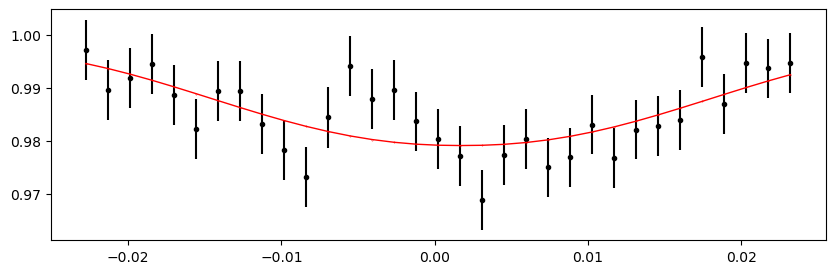

1999.9347839999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.93it/s]


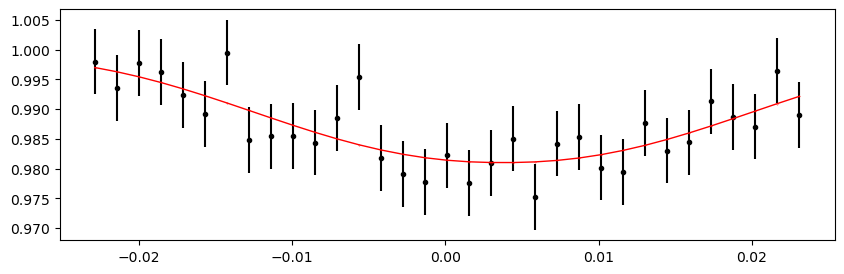

2000.9015829999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.24it/s]


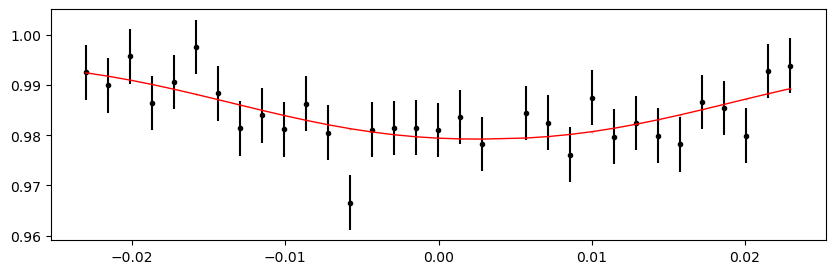

2001.8683819999999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.05it/s]


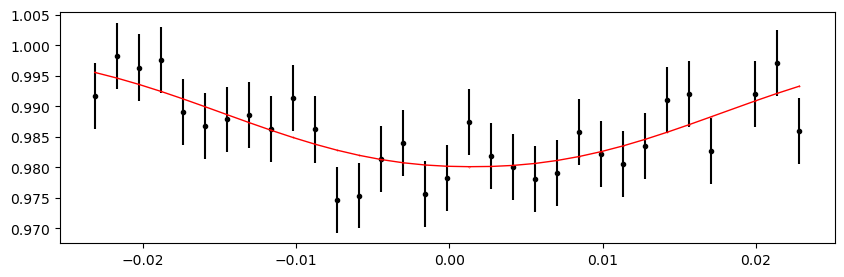

2002.835181 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.58it/s]


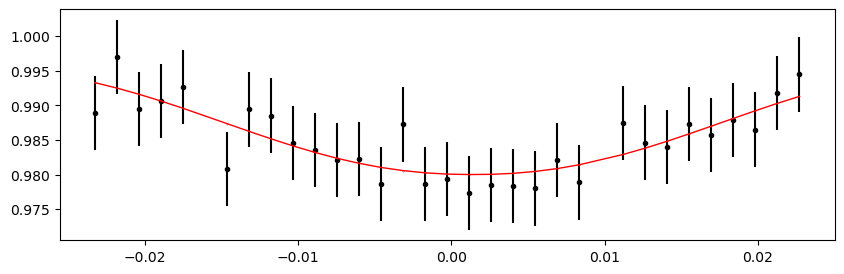

2003.80198 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.54it/s]


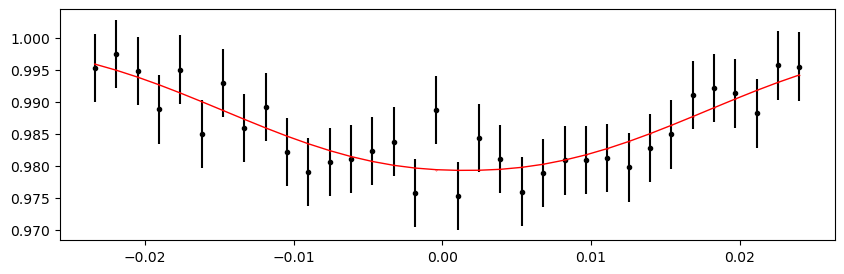

2004.768779 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.62it/s]


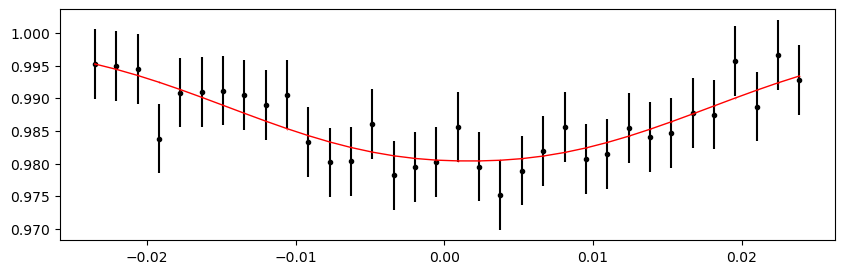

2005.7355779999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.69it/s]


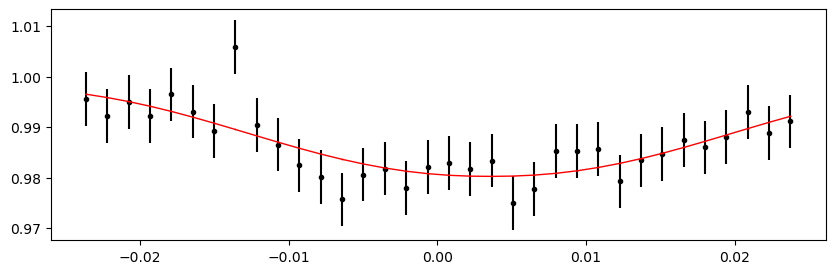

2006.7023769999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.01it/s]


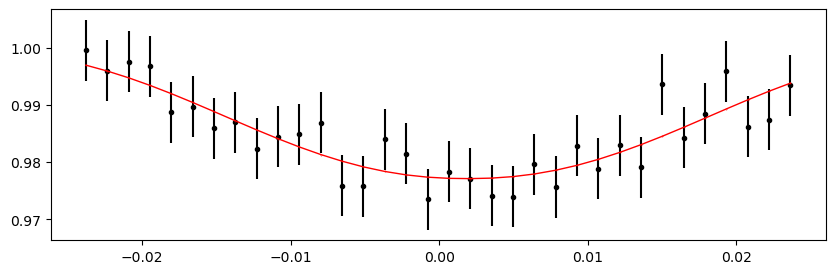

2007.6691759999999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.59it/s]


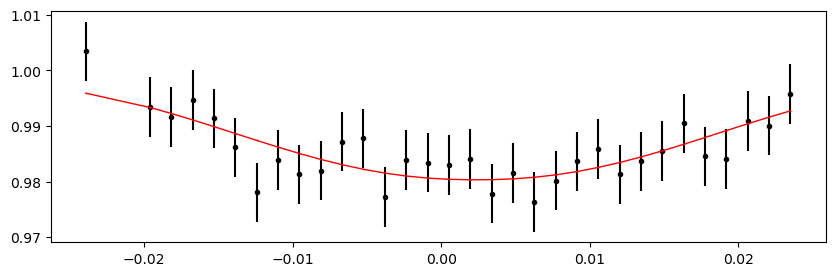

2008.635975 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.88it/s]


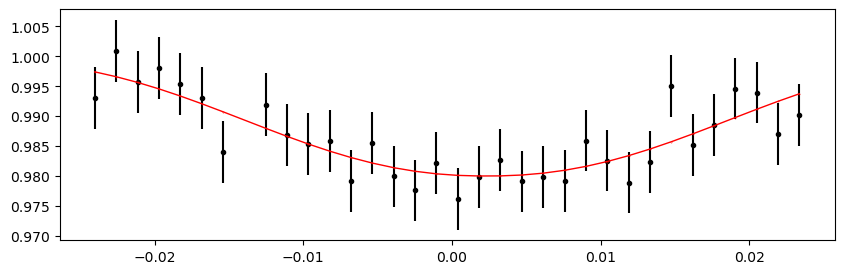

2010.569573 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.64it/s]


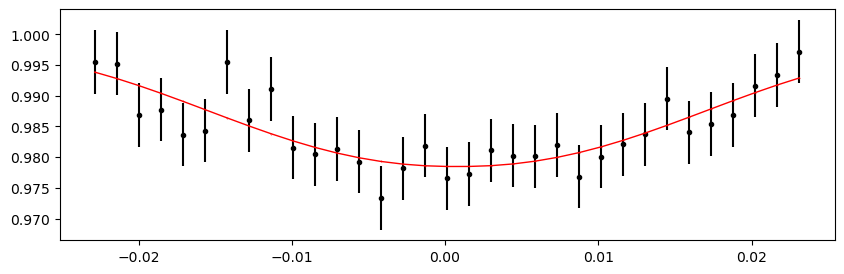

2011.5363719999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.57it/s]


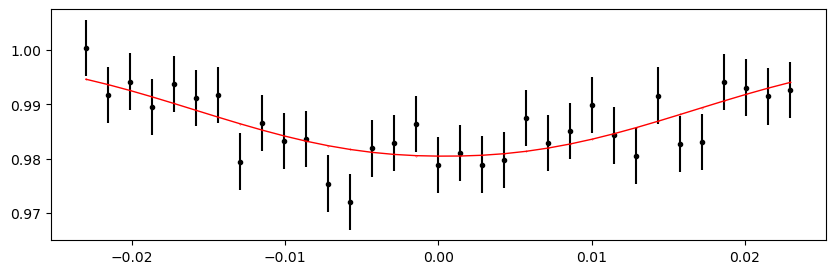

2012.5031709999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.42it/s]


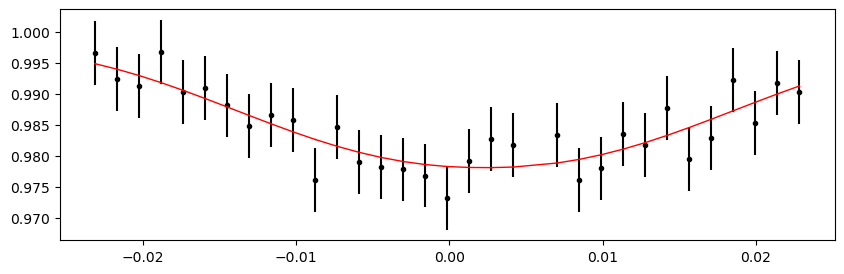

2013.4699699999999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.33it/s]


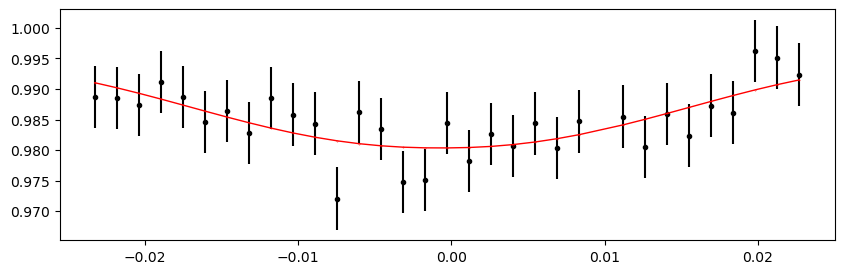

2014.436769 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.93it/s]


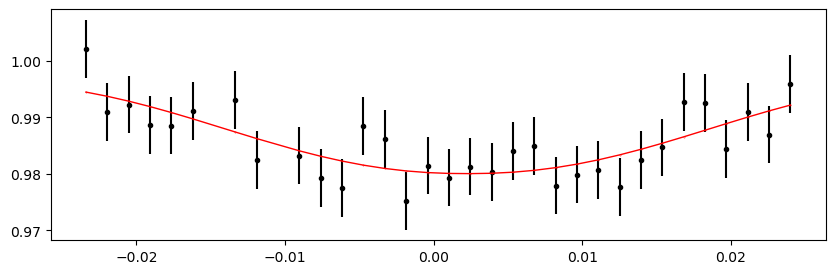

2015.403568 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.09it/s]


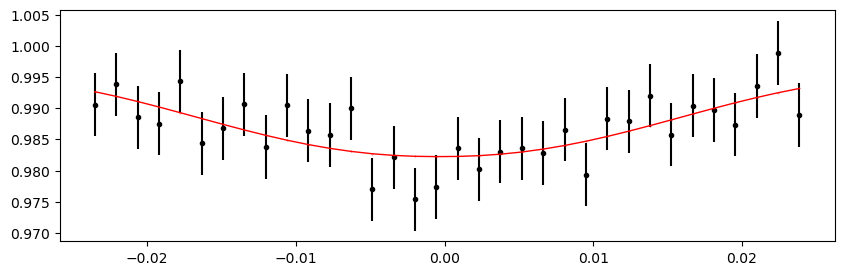

2016.370367 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.41it/s]


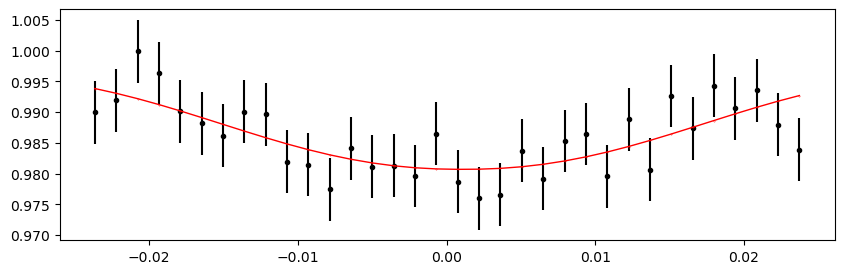

2017.3371659999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.92it/s]


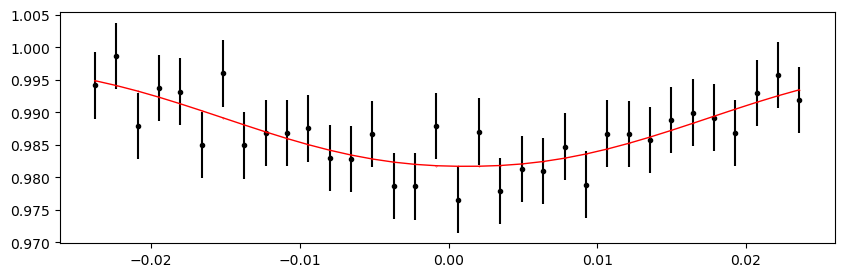

2018.3039649999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.58it/s]


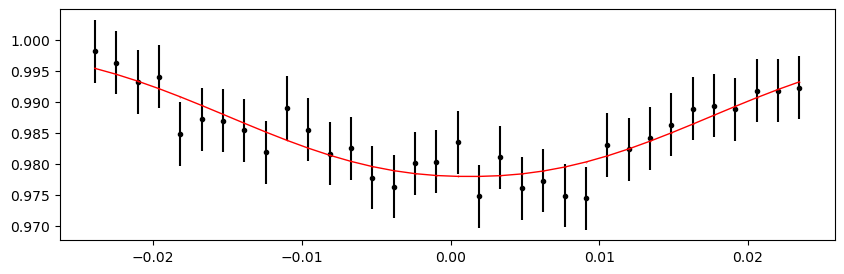

2019.2707639999999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.43it/s]


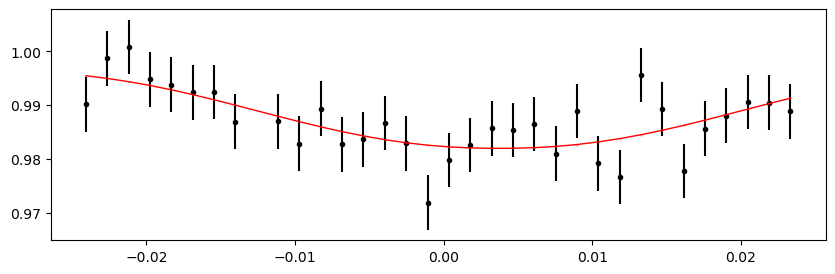

2020.237563 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.94it/s]


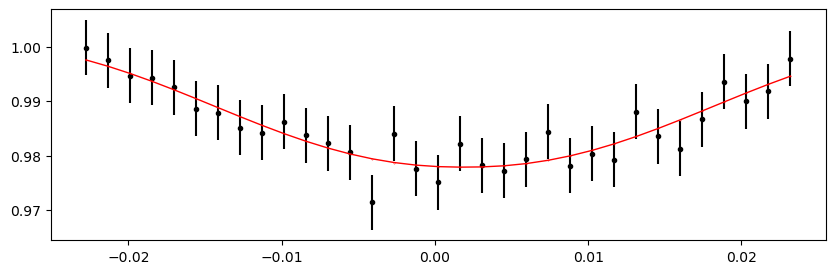

2021.204362 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.64it/s]


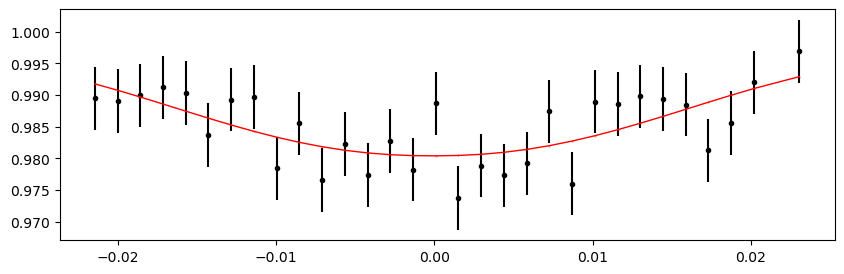

2022.171161 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.65it/s]


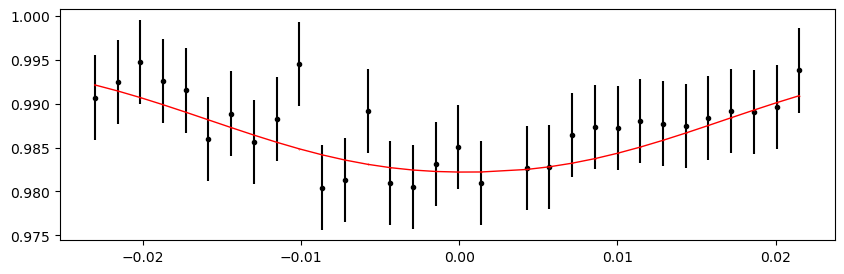

2023.1379599999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.10it/s]


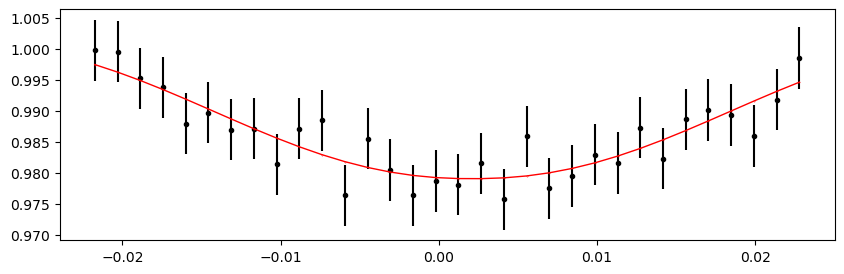

2024.1047589999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.06it/s]


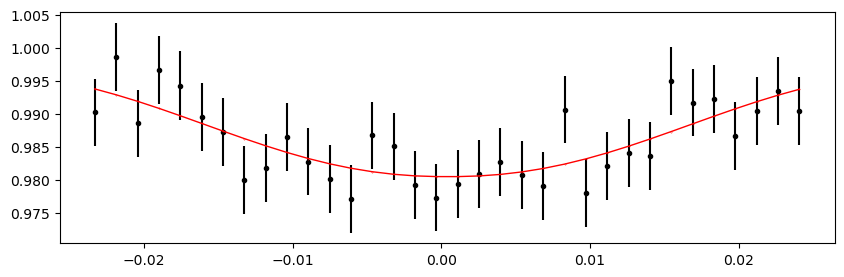

2025.0715579999999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.00it/s]


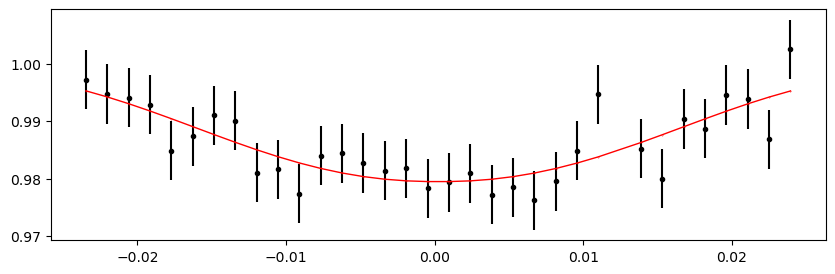

2026.038357 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.78it/s]


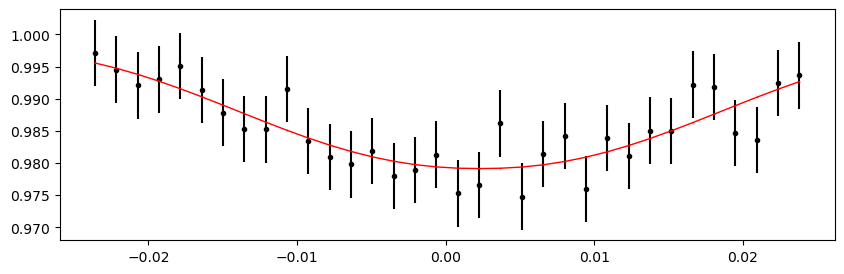

2027.005156 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.55it/s]


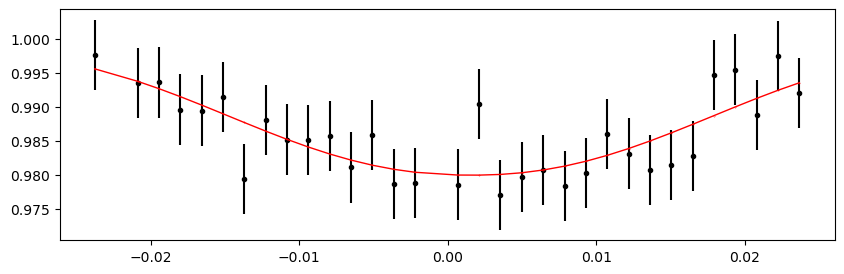

2027.971955 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.46it/s]


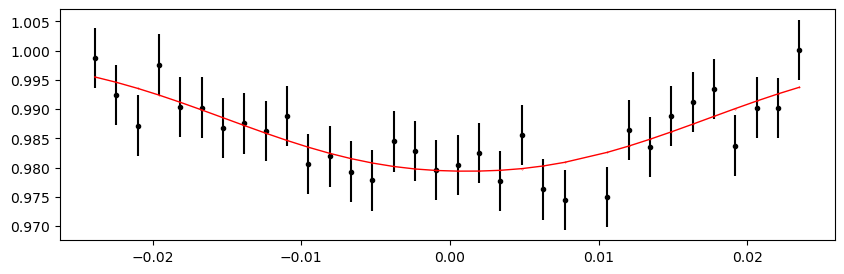

2028.9387539999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.49it/s]


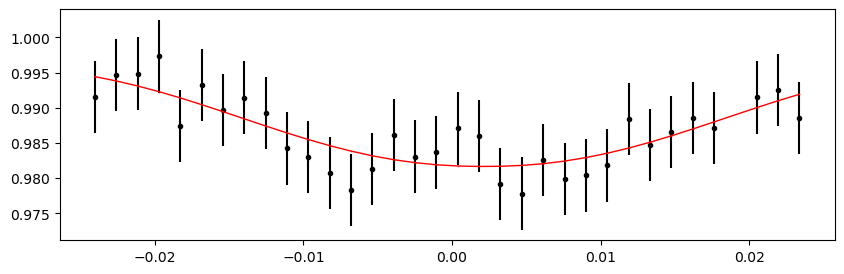

2029.9055529999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.62it/s]


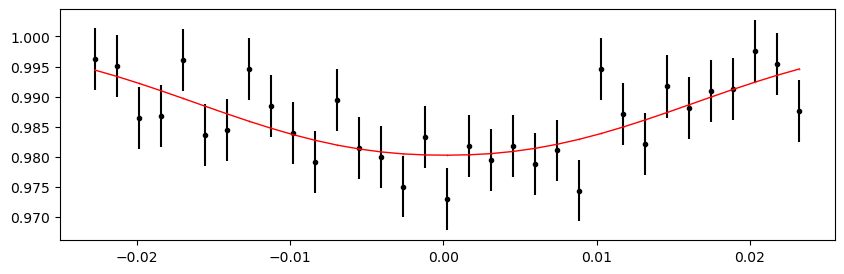

2030.8723519999999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.97it/s]


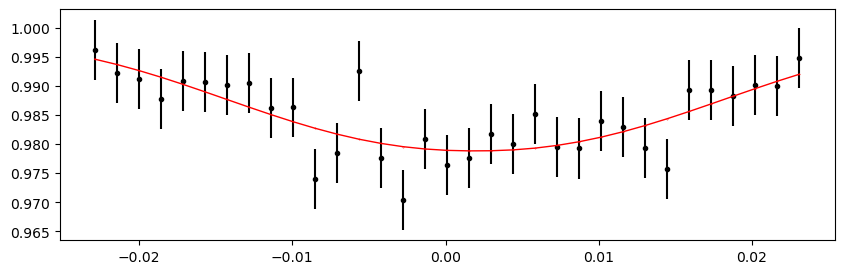

2031.839151 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.03it/s]


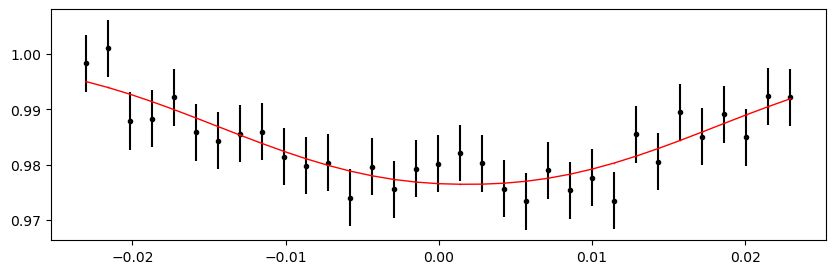

2032.80595 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.37it/s]


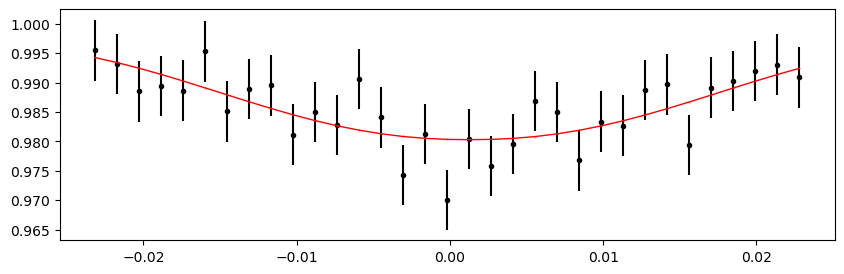

2033.772749 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.65it/s]


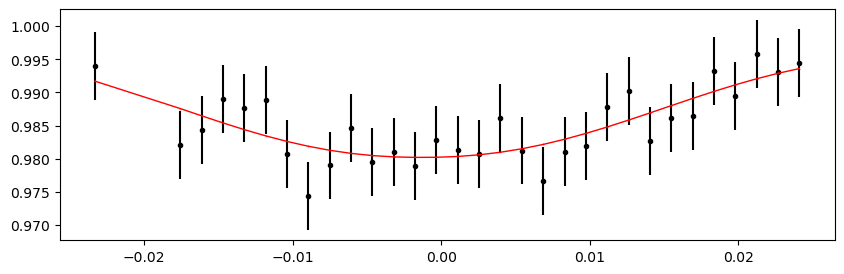

2034.7395479999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.63it/s]


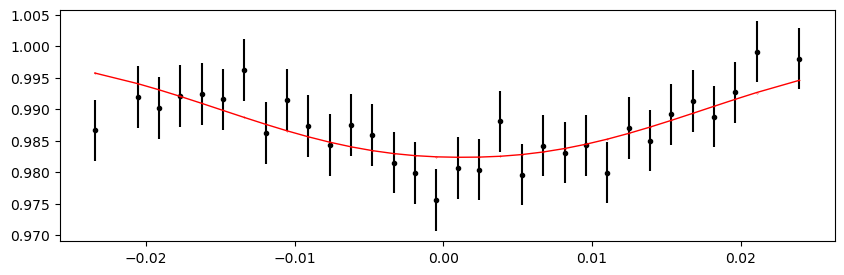

2391.488379 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.03it/s]


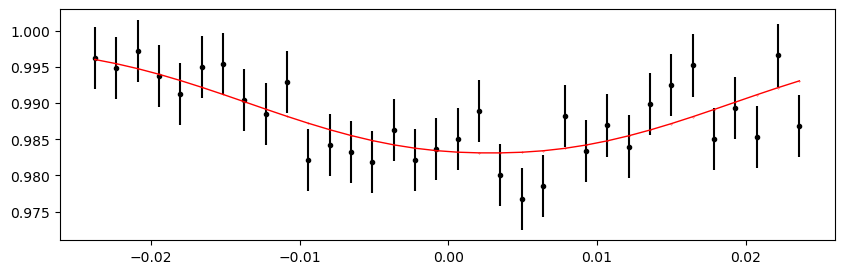

2392.4551779999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.59it/s]


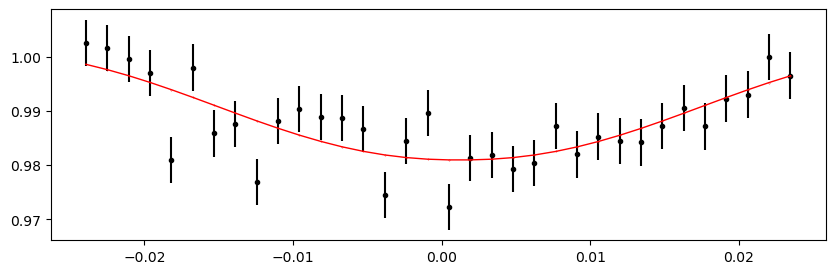

2393.421977 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.20it/s]


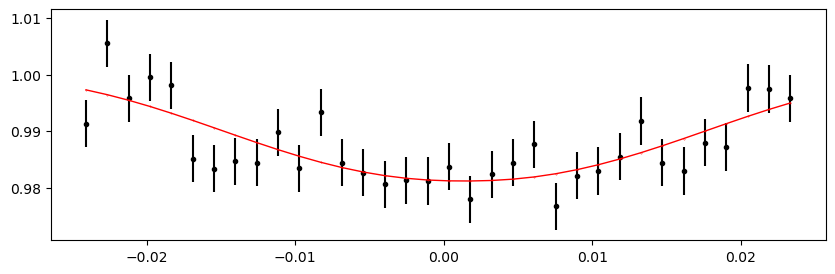

2394.388776 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.81it/s]


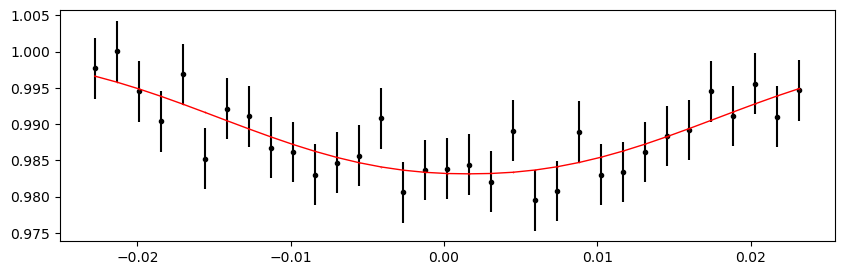

2395.355575 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.33it/s]


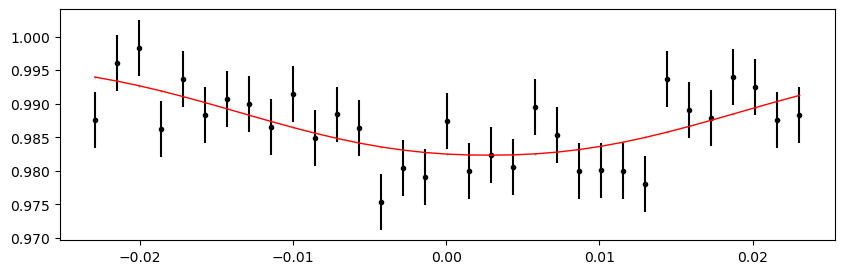

2396.322374 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.76it/s]


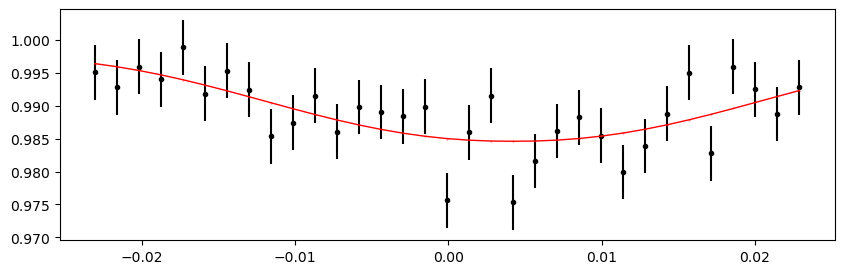

2397.289173 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.85it/s]


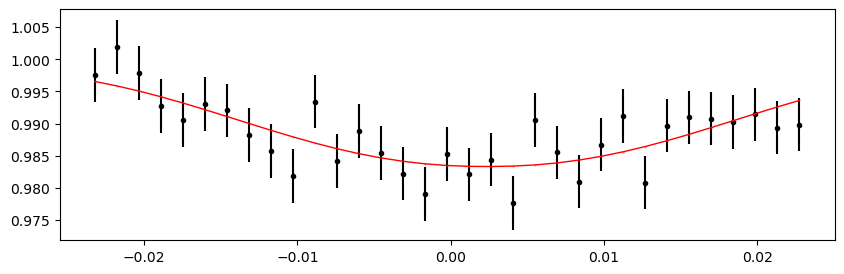

2398.255972 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.54it/s]


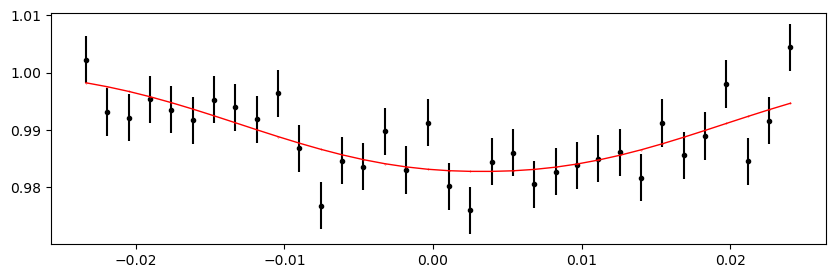

2399.2227709999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.35it/s]


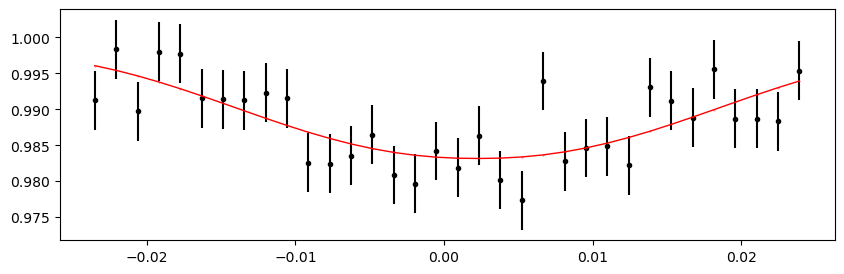

2400.18957 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.15it/s]


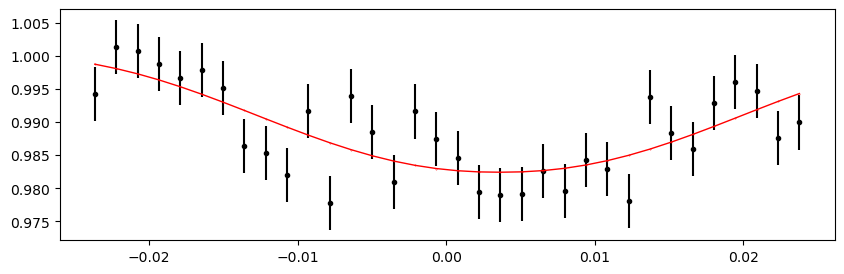

2401.156369 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.80it/s]


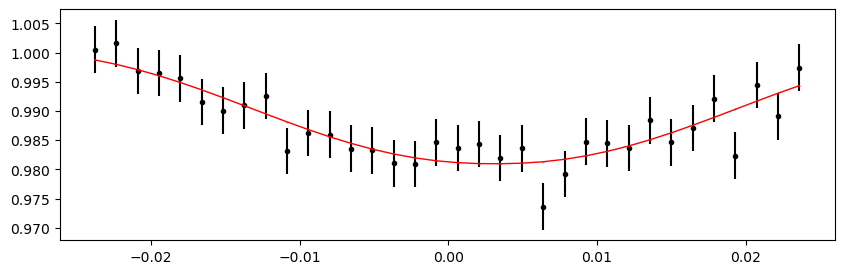

2402.123168 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 421.68it/s]


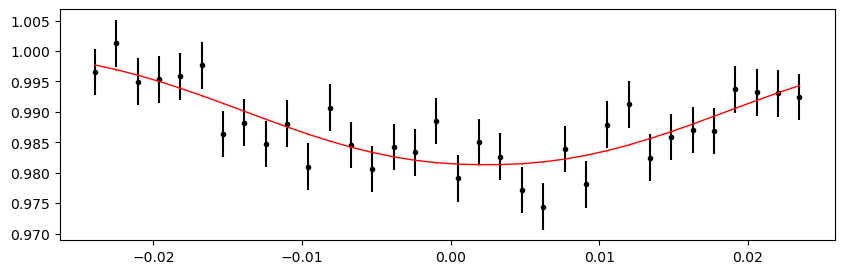

2403.089967 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.71it/s]


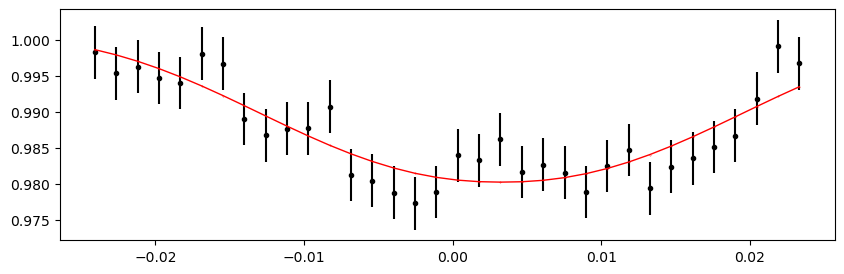

2404.0567659999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 411.37it/s]


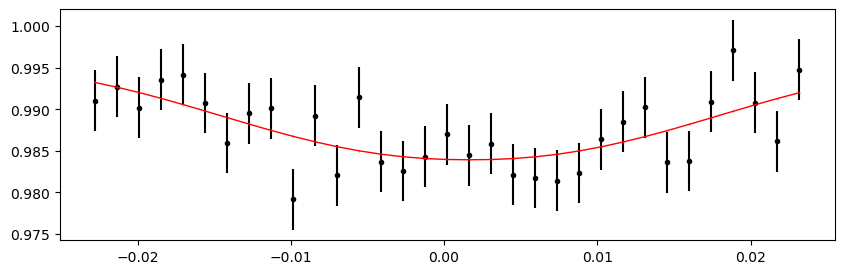

2405.9903639999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.47it/s]


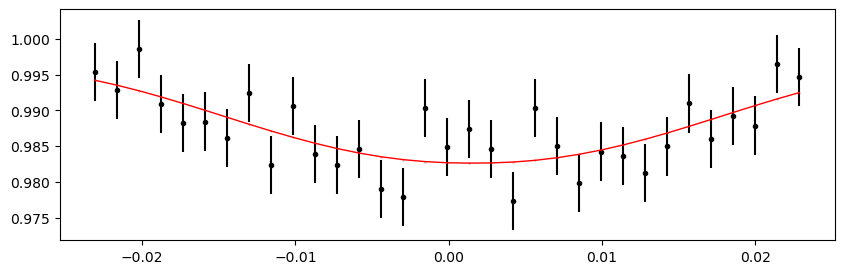

2406.957163 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.08it/s]


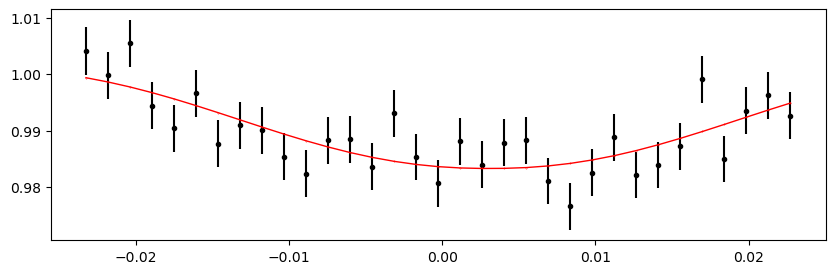

2407.923962 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.34it/s]


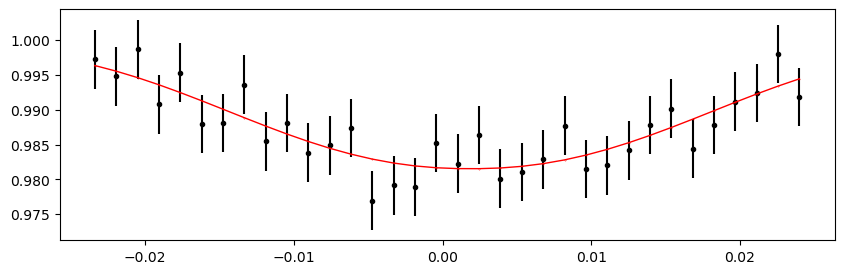

2408.8907609999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.32it/s]


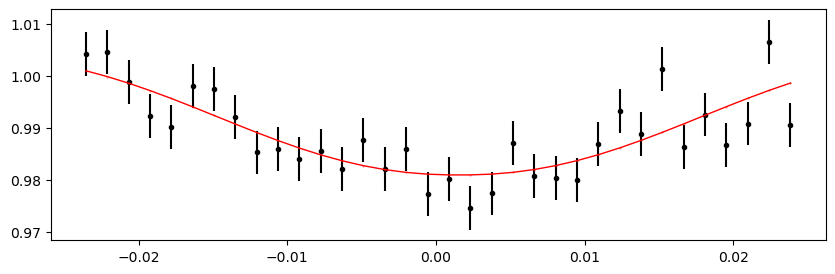

2409.85756 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.48it/s]


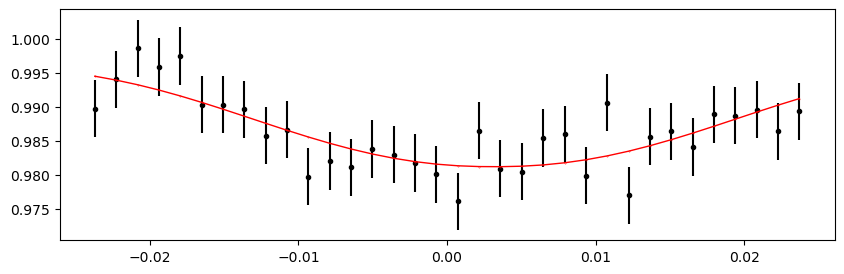

2410.8243589999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.87it/s]


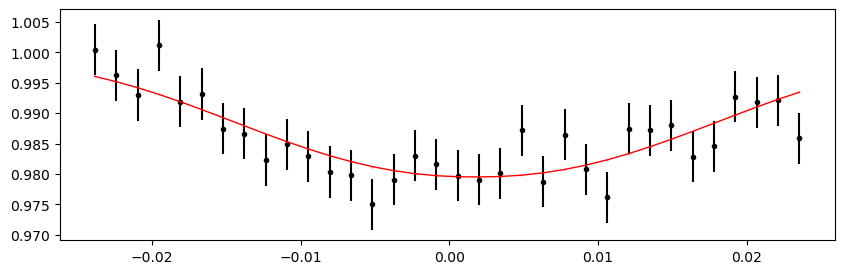

2411.791158 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.92it/s]


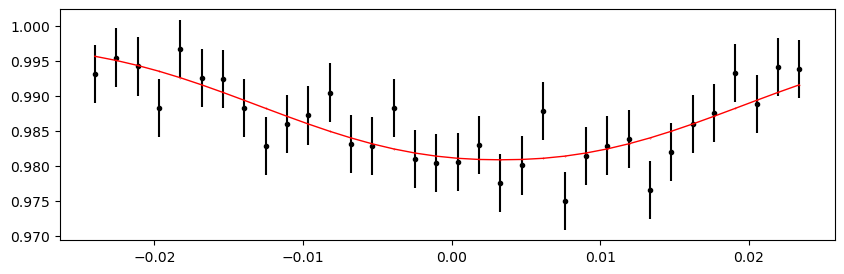

2412.757957 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.75it/s]


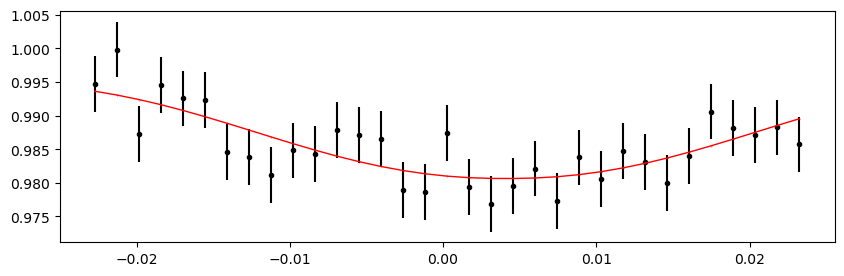

2413.724756 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.92it/s]


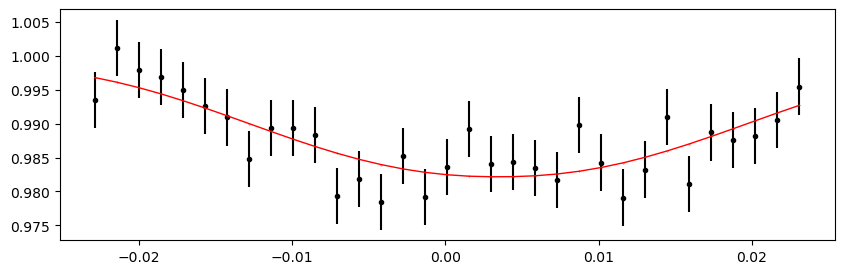

2414.691555 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.52it/s]


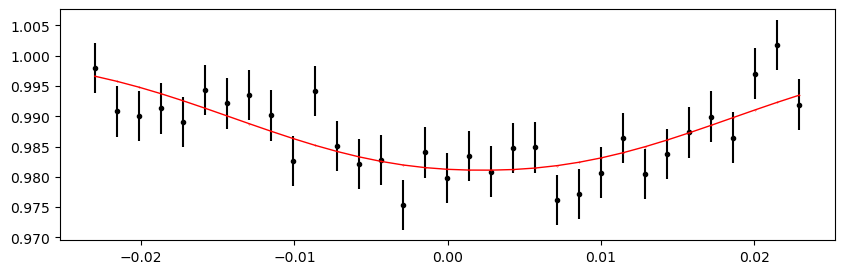

2415.6583539999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.30it/s]


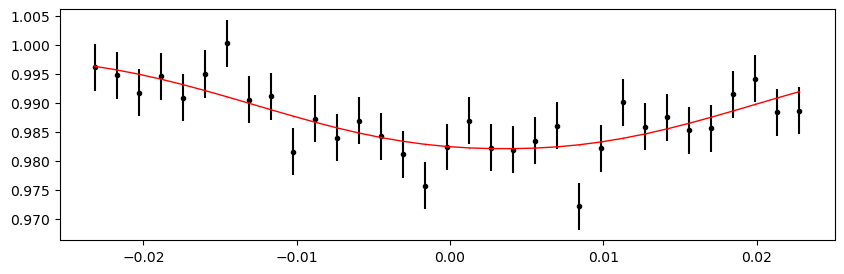

2416.625153 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.45it/s]


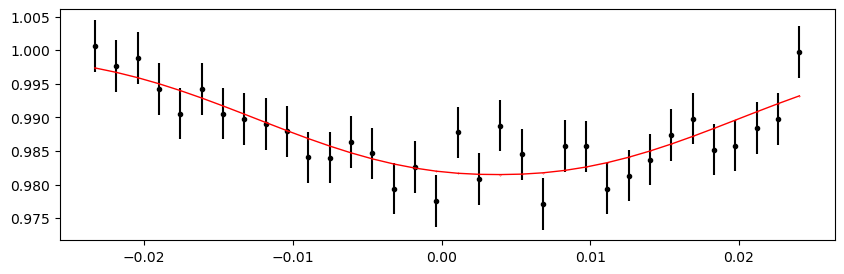

2417.5919519999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 423.00it/s]


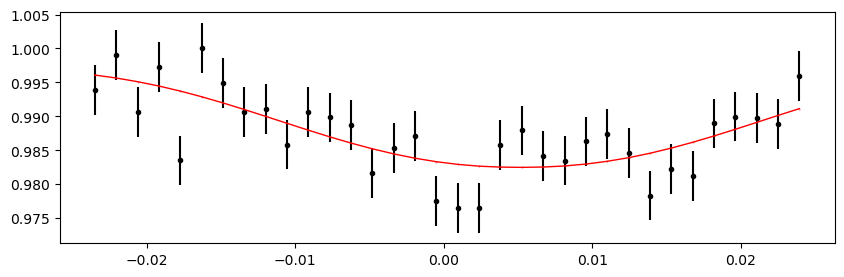

2418.558751 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.21it/s]


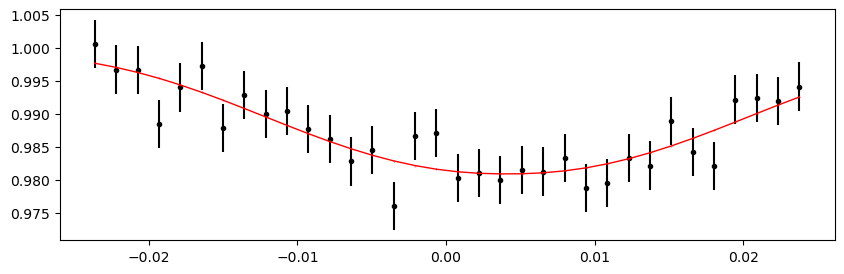

2722.133637 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.12it/s]


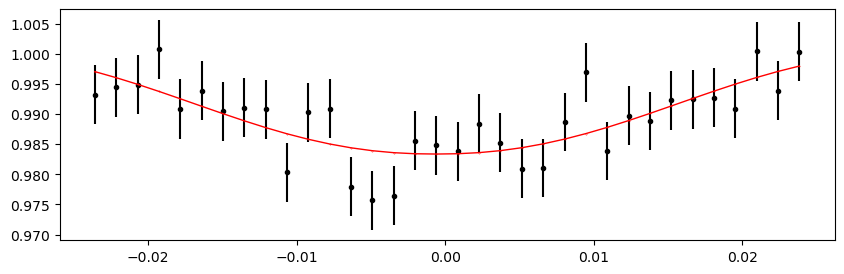

2723.1004359999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.97it/s]


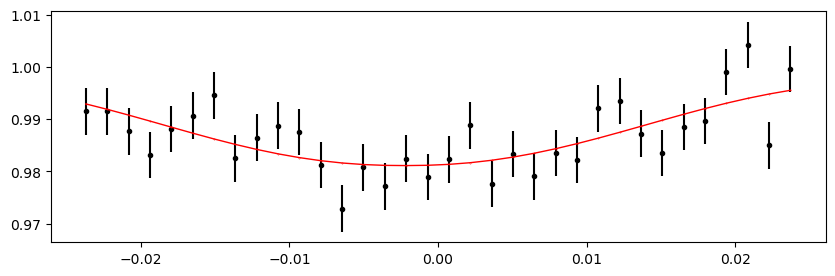

2724.067235 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.79it/s]


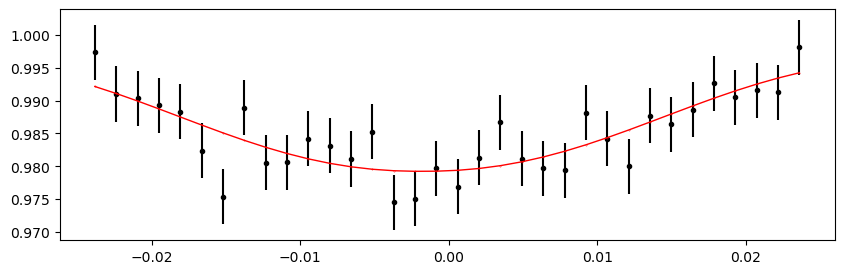

2725.034034 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.99it/s]


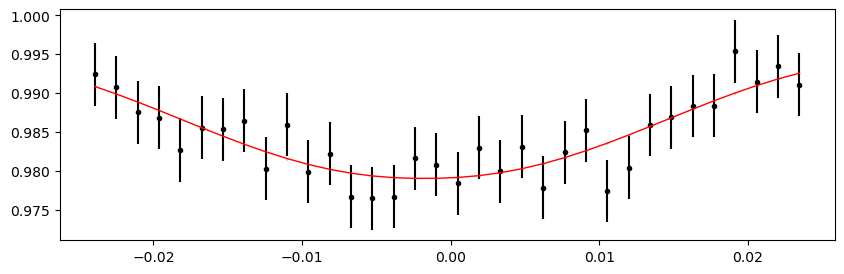

2726.000833 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 422.63it/s]


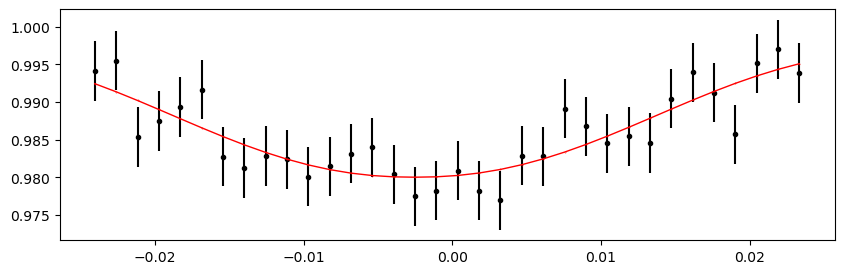

2726.967632 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.69it/s]


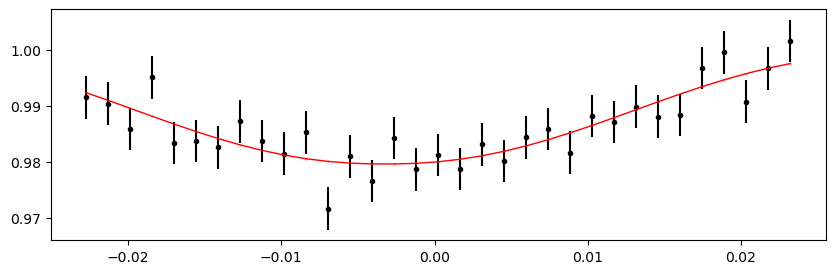

2727.9344309999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.99it/s]


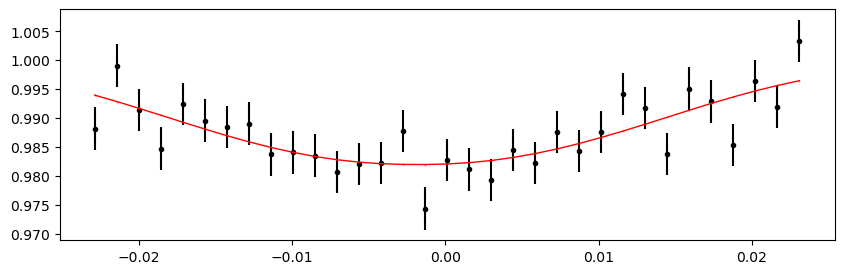

2728.90123 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.50it/s]


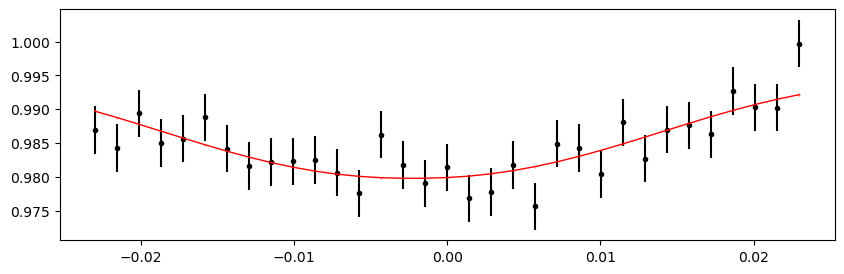

2729.8680289999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.70it/s]


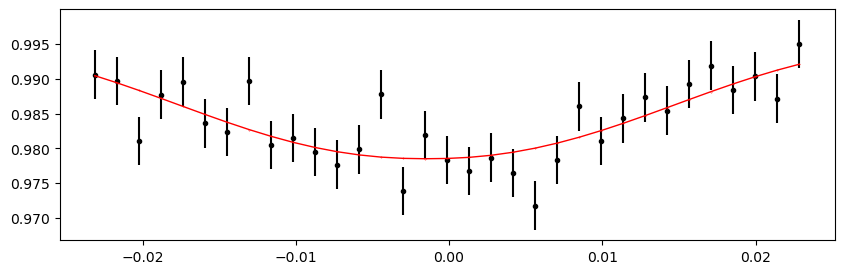

2735.668823 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 410.55it/s]


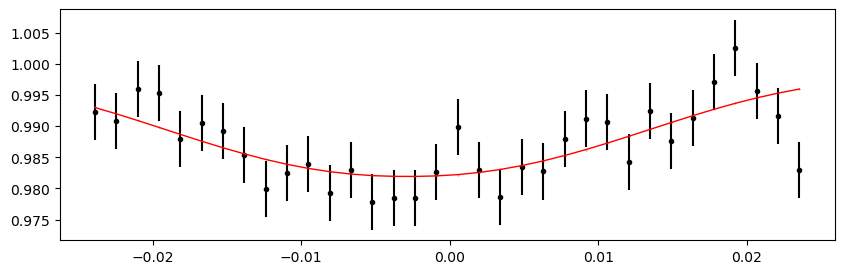

2736.635622 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 418.90it/s]


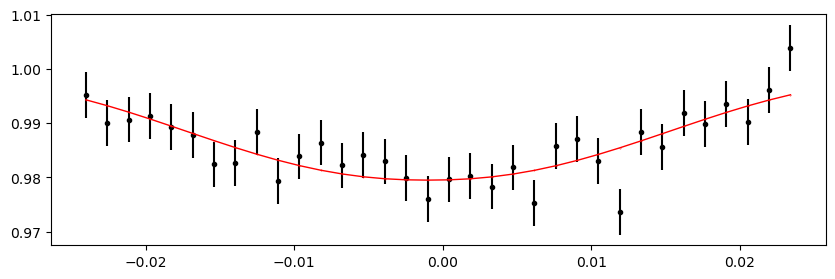

2737.6024209999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.12it/s]


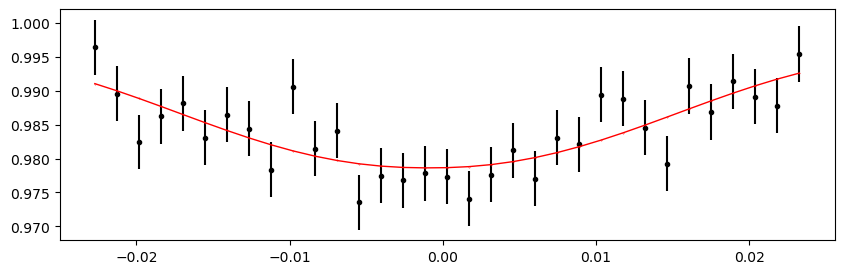

2738.56922 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.35it/s]


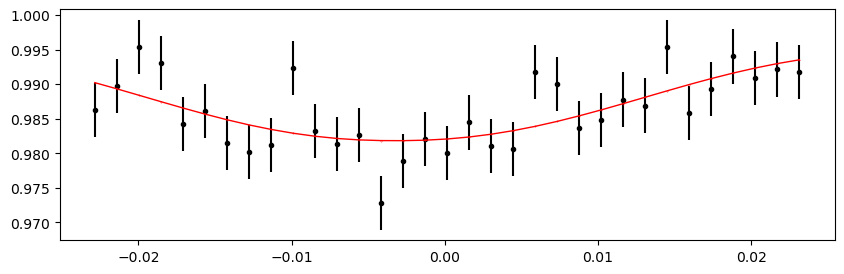

2739.536019 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.80it/s]


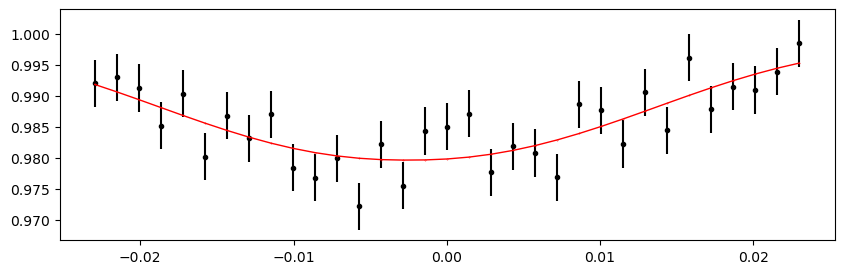

2740.502818 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.58it/s]


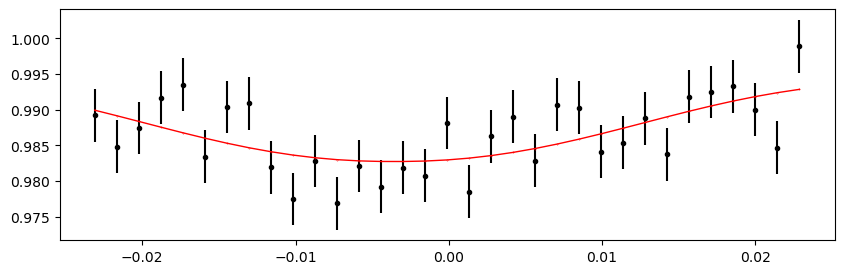

2741.4696169999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 414.01it/s]


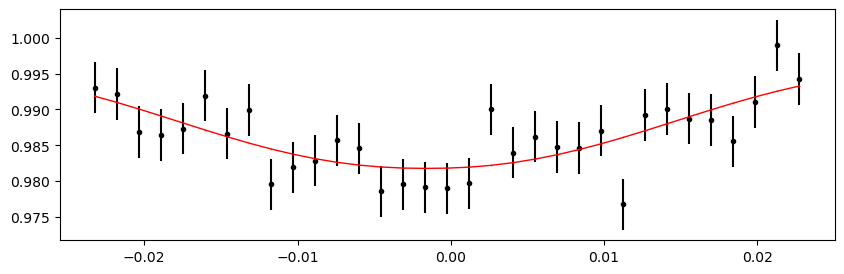

2742.436416 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.96it/s]


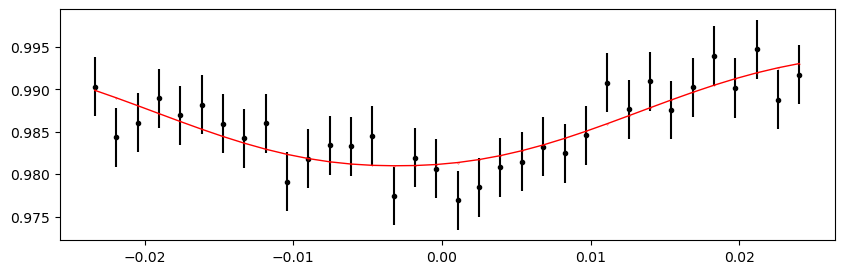

2744.370014 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.10it/s]


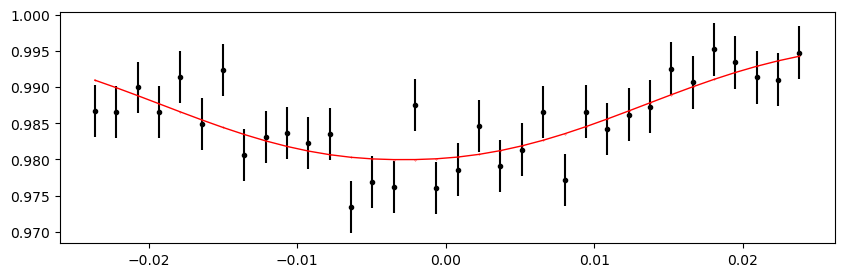

2745.336813 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.62it/s]


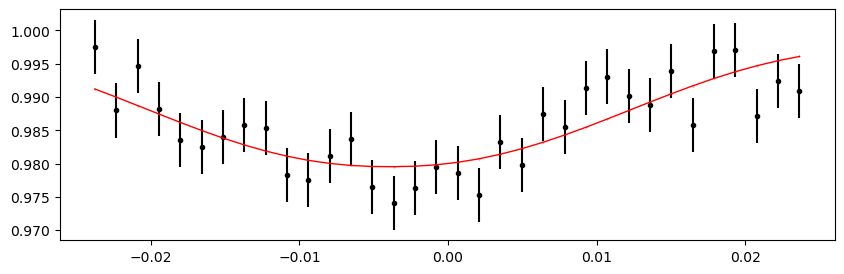

2746.3036119999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.78it/s]


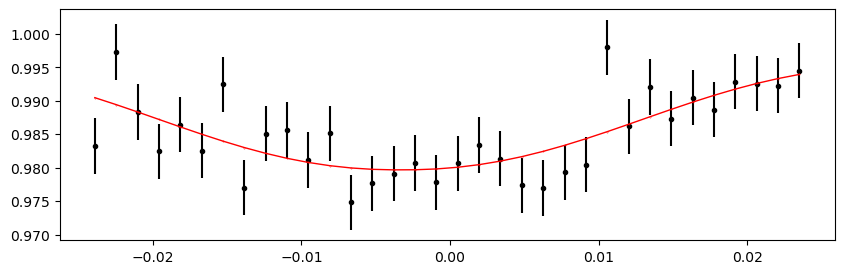

2747.270411 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 415.96it/s]


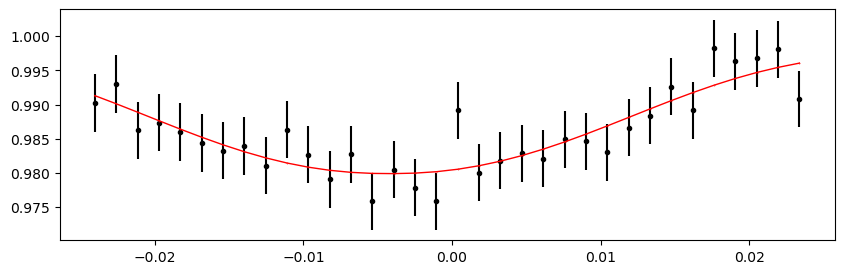

2748.23721 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.03it/s]


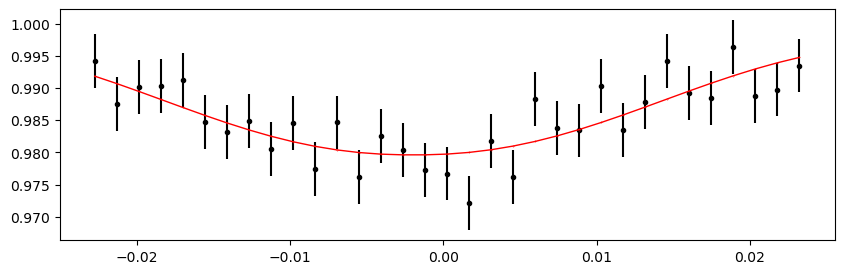

2749.204009 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.05it/s]


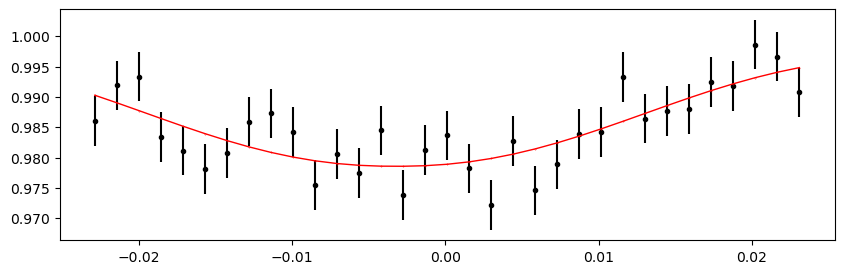

2750.170808 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 419.00it/s]


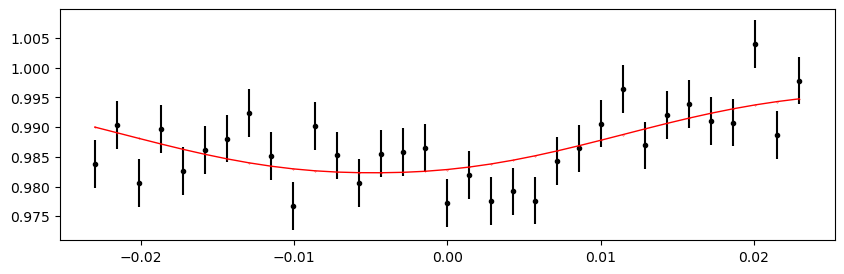

2751.1376069999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.53it/s]


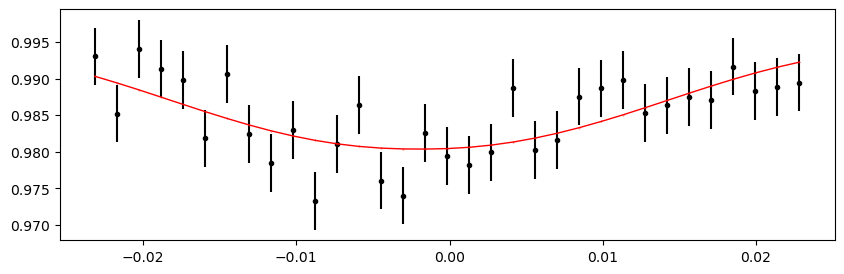

2752.104406 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.12it/s]


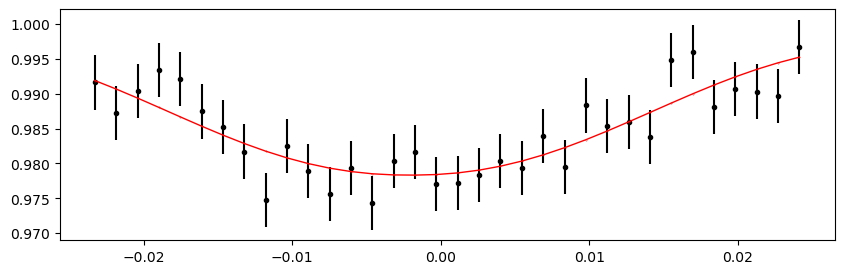

2753.0712049999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.98it/s]


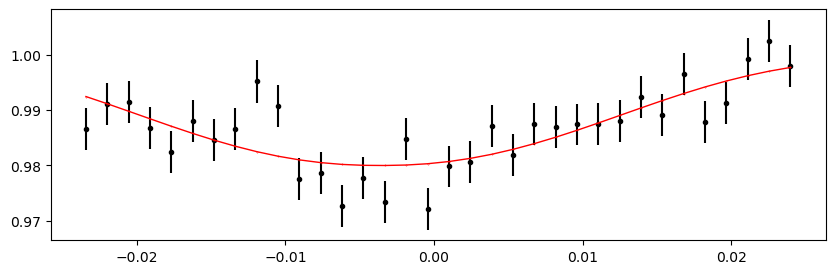

2754.038004 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.91it/s]


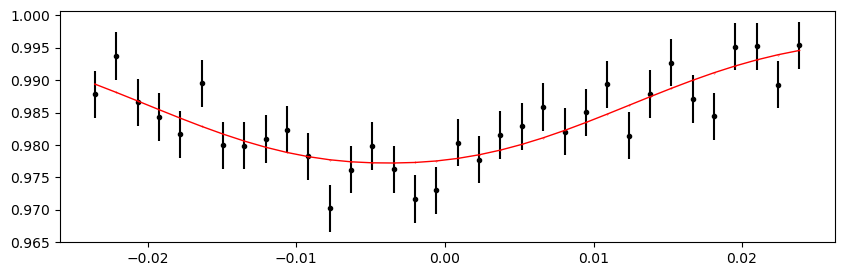

2755.004803 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.70it/s]


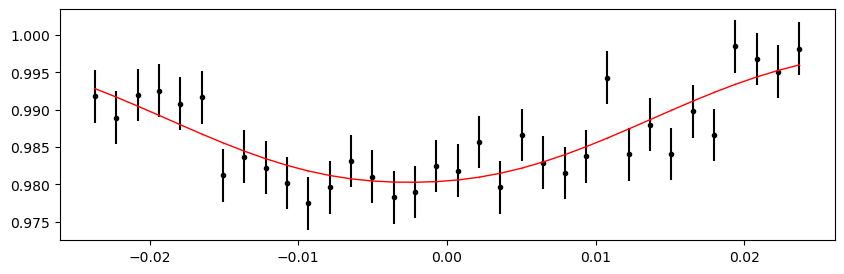

2755.9716019999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.39it/s]


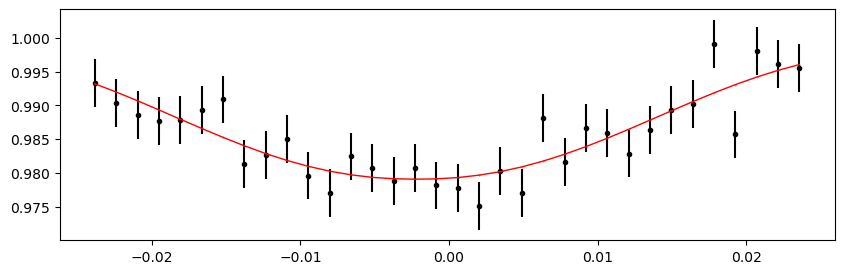

2756.938401 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.10it/s]


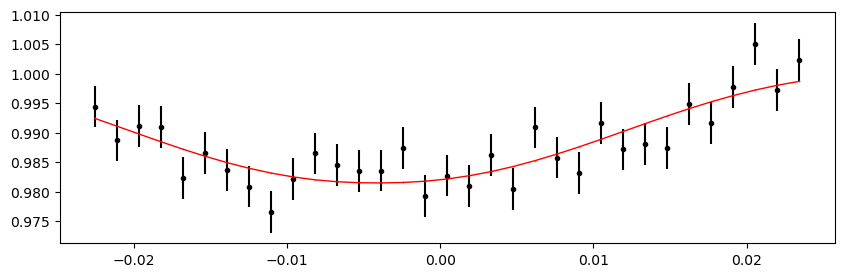

2757.9052 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.34it/s]


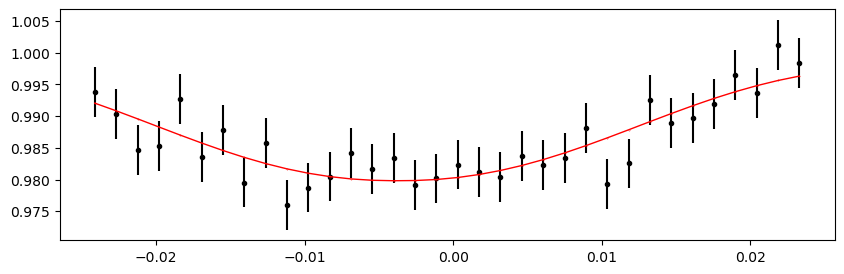

2758.871999 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.42it/s]


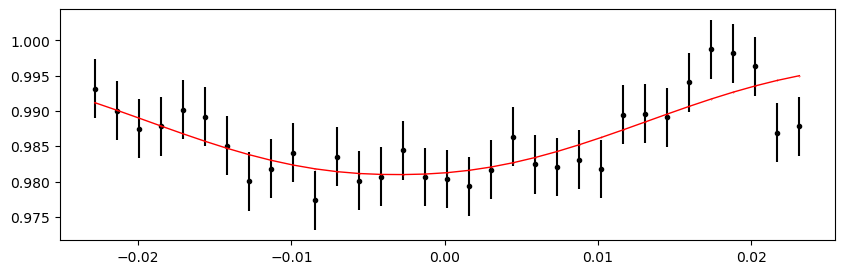

2759.8387979999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.18it/s]


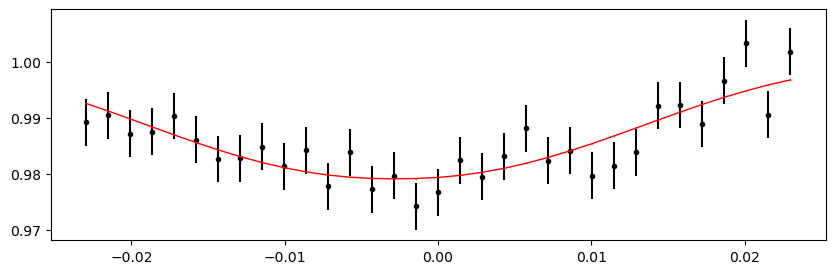

2760.805597 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.79it/s]


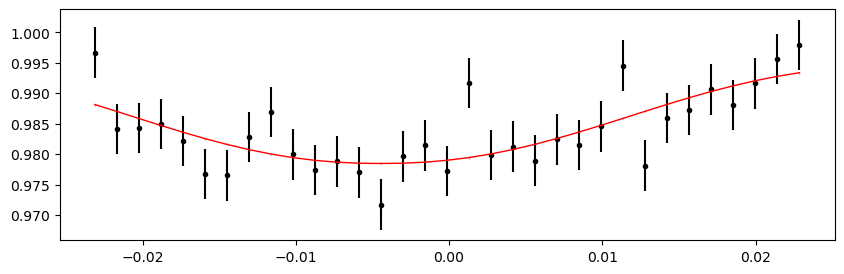

2761.772396 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.67it/s]


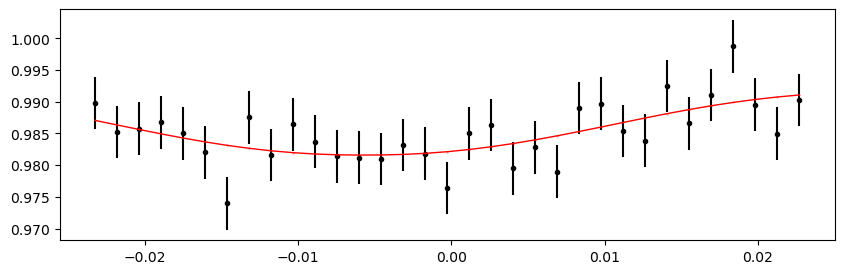

2762.739195 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.57it/s]


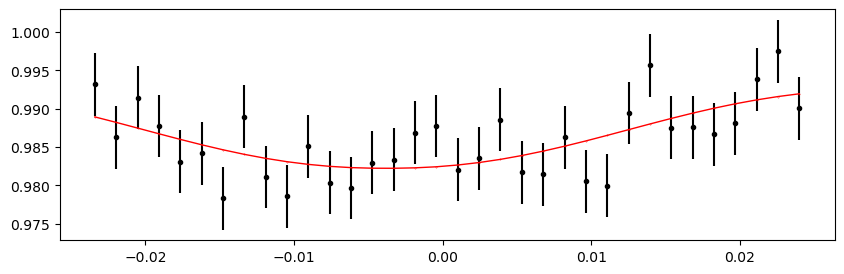

2763.705994 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.49it/s]


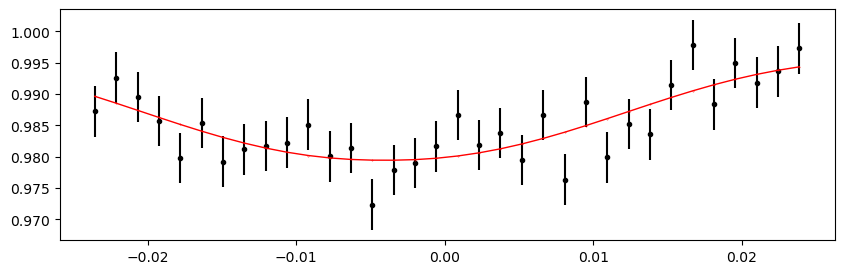

2764.6727929999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.65it/s]


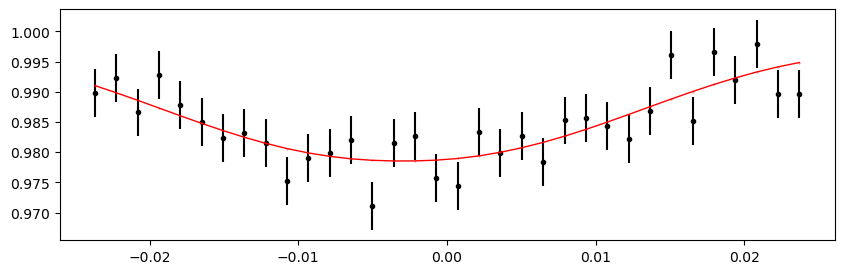

2765.639592 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.69it/s]


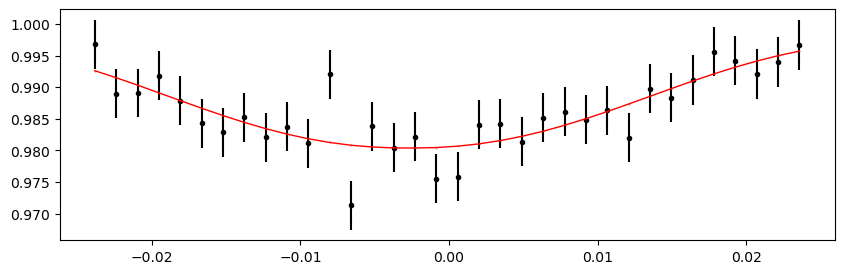

2766.606391 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 416.62it/s]


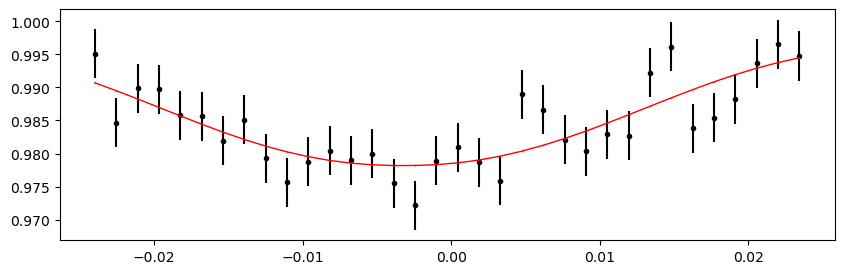

2767.57319 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.97it/s]


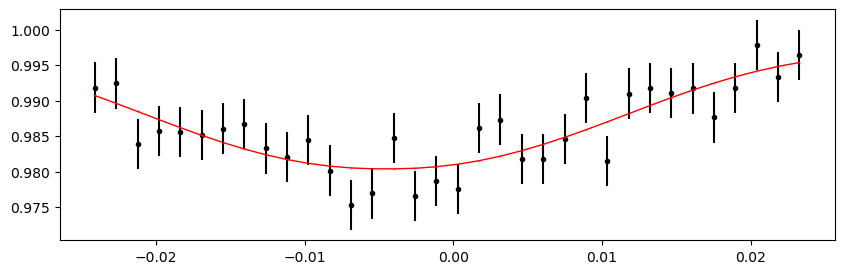

2768.539989 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.23it/s]


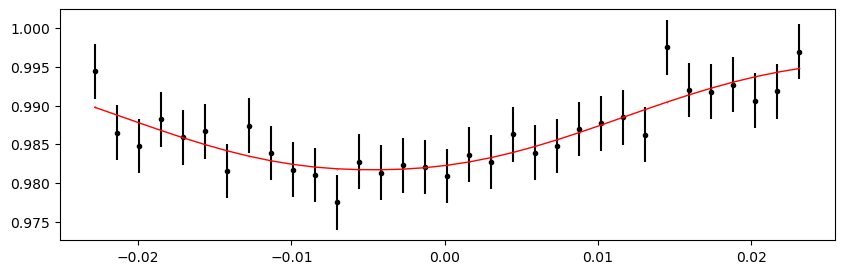

2770.473587 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.86it/s]


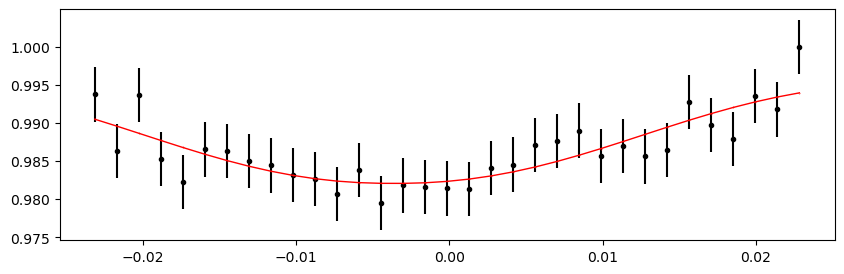

2771.4403859999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.80it/s]


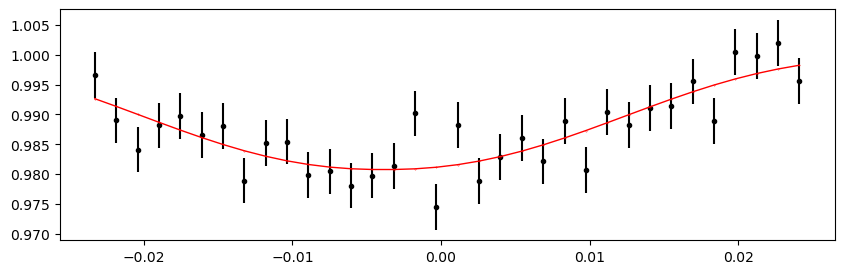

2772.407185 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.31it/s]


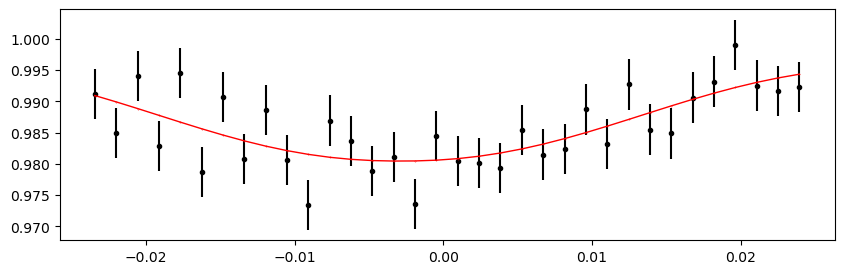

2773.373984 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.91it/s]


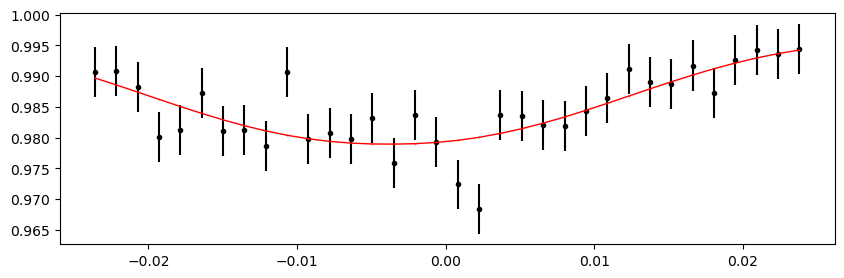

2774.3407829999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.88it/s]


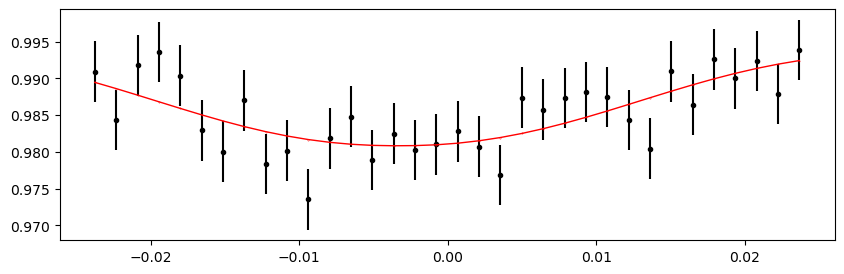

2775.307582 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.03it/s]


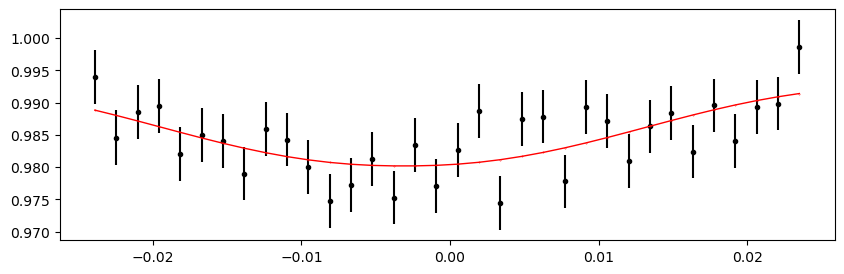

2776.2743809999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.01it/s]


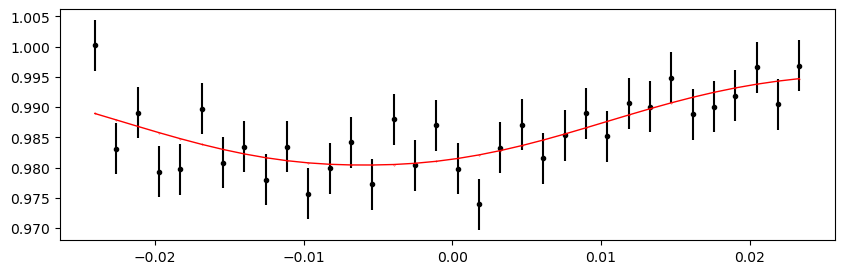

2777.24118 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.40it/s]


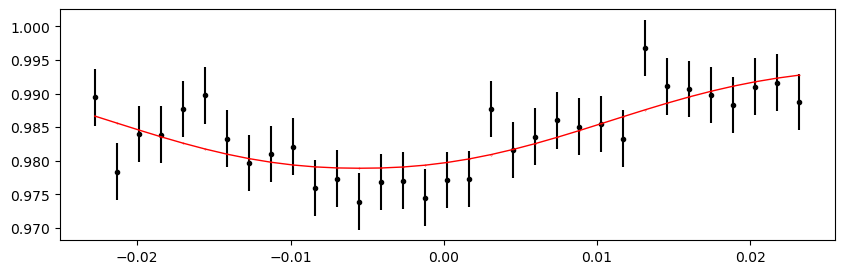

2778.207979 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.00it/s]


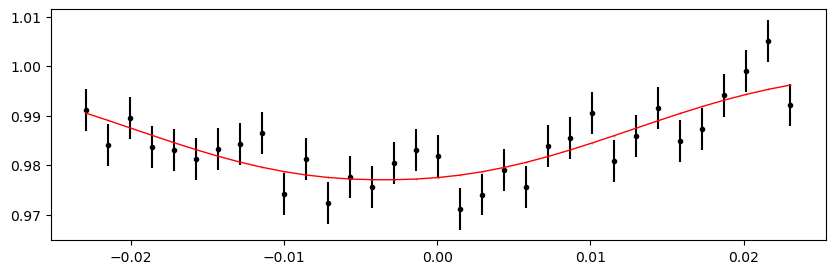

2779.1747779999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.82it/s]


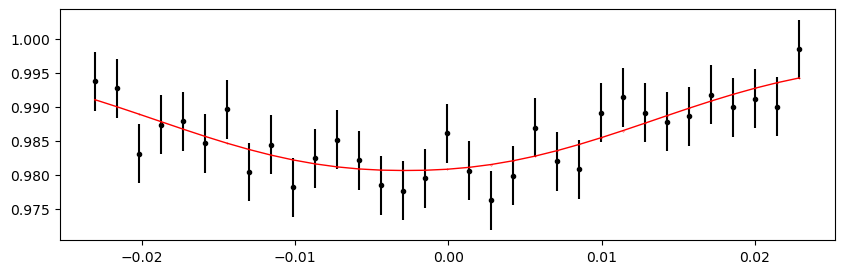

2780.141577 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.08it/s]


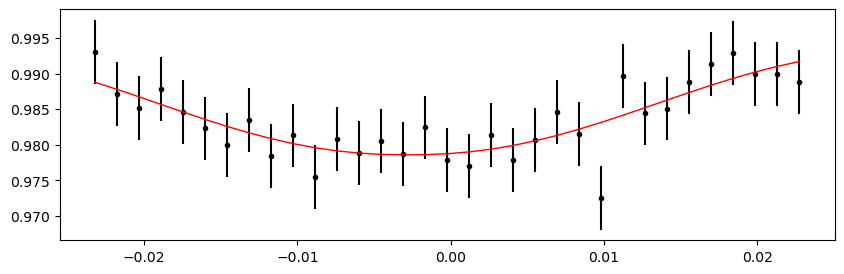

2781.108376 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.84it/s]


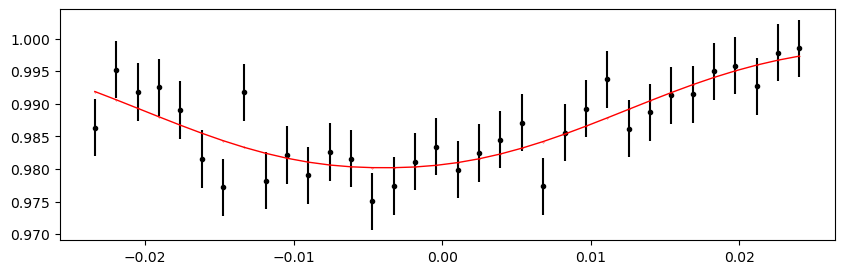

2782.075175 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.48it/s]


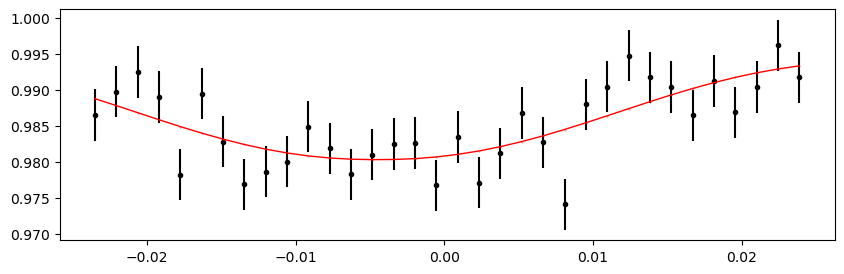

2784.008773 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.75it/s]


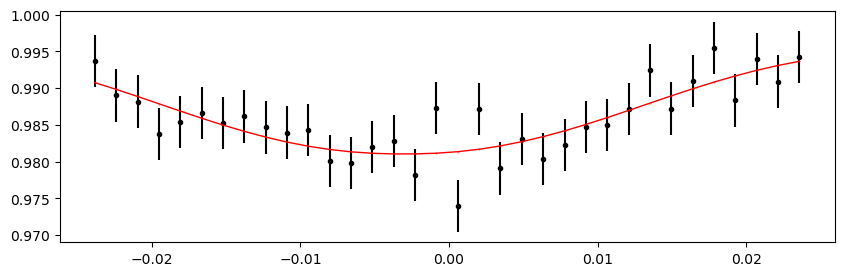

2784.975572 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.34it/s]


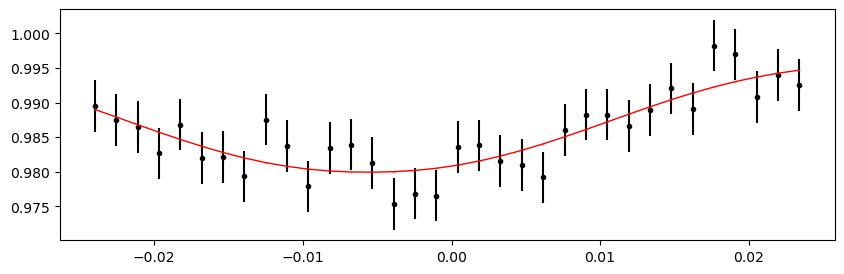

2785.942371 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.09it/s]


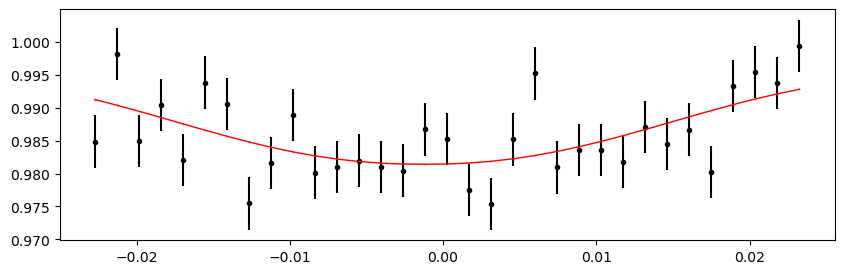

2786.90917 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 320.66it/s]


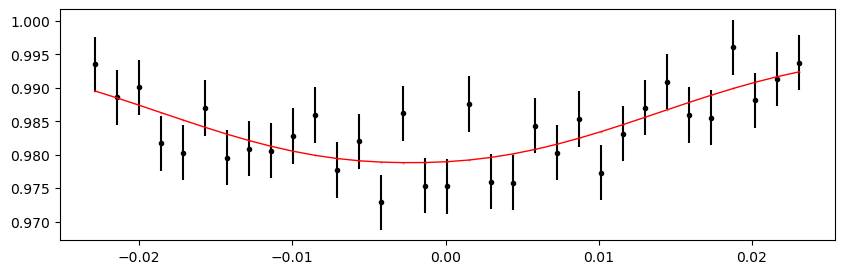

2787.8759689999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 270.38it/s]


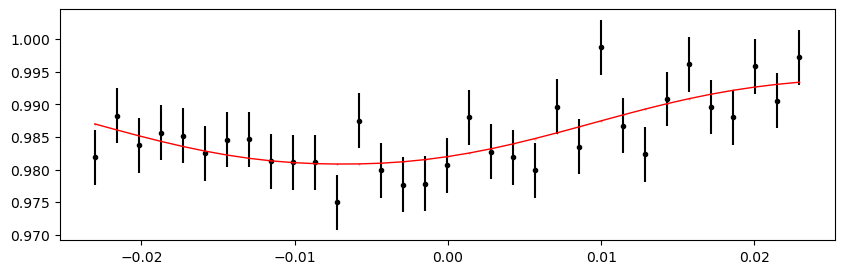

2788.842768 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.65it/s]


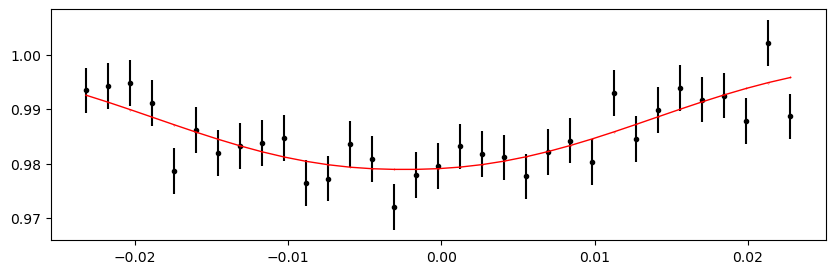

2789.809567 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.91it/s]


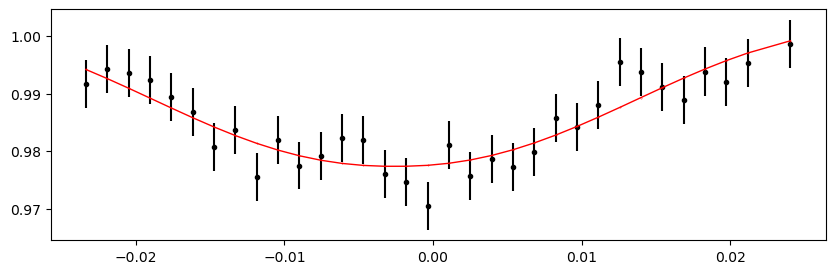

2790.776366 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.06it/s]


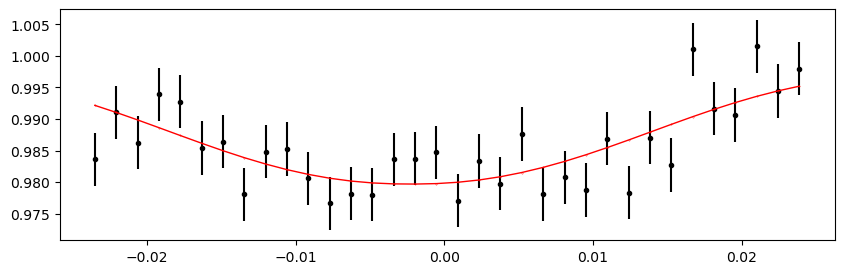

2791.743165 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.73it/s]


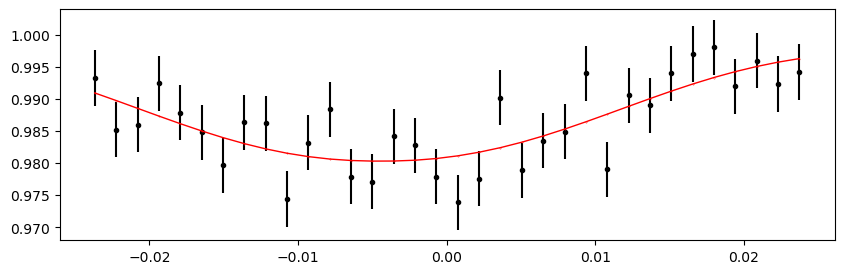

Time 2792.7099639999997 does not have enough data points: 19
2793.676763 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.79it/s]


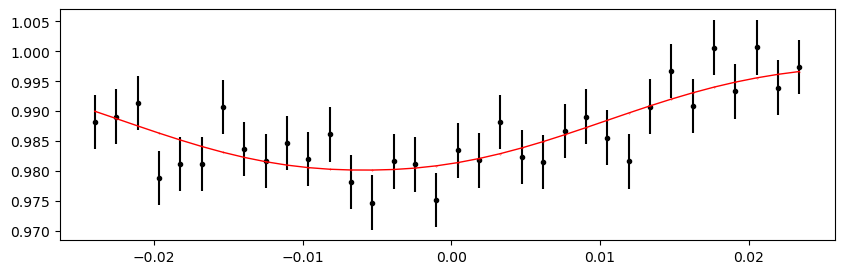

2794.6435619999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.96it/s]


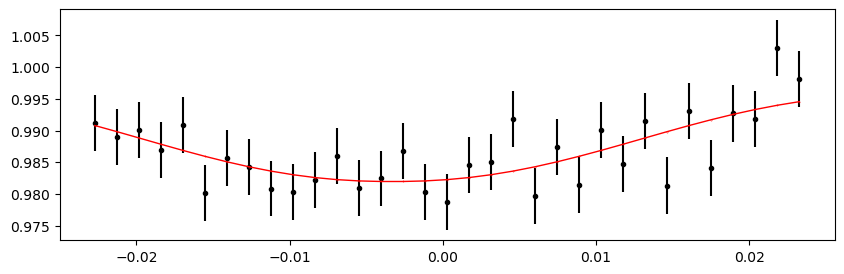

2795.610361 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.59it/s]


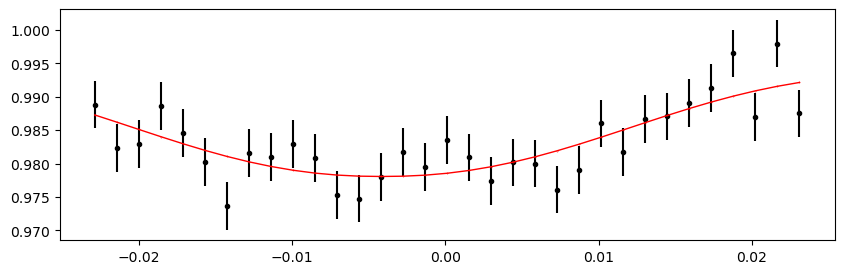

Time 3312.847826 does not have enough data points: 7
3315.7482229999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.62it/s]


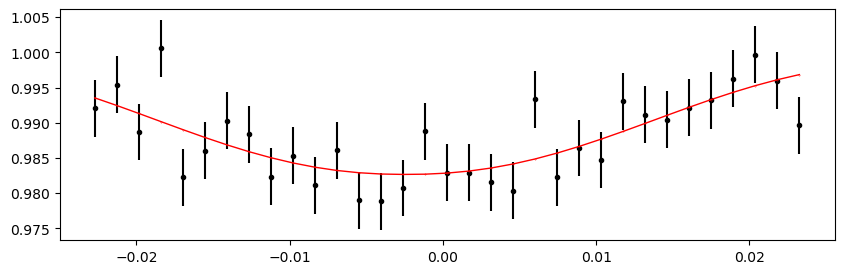

3316.715022 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.38it/s]


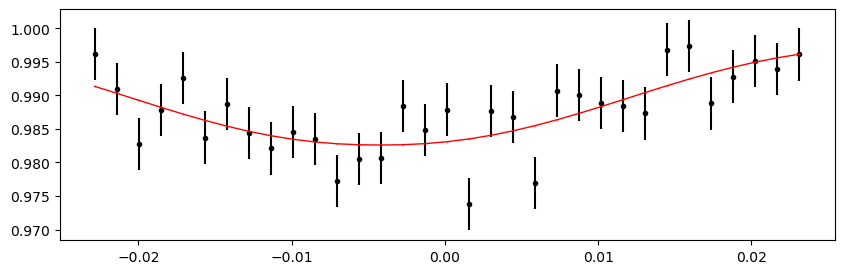

3317.681821 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.66it/s]


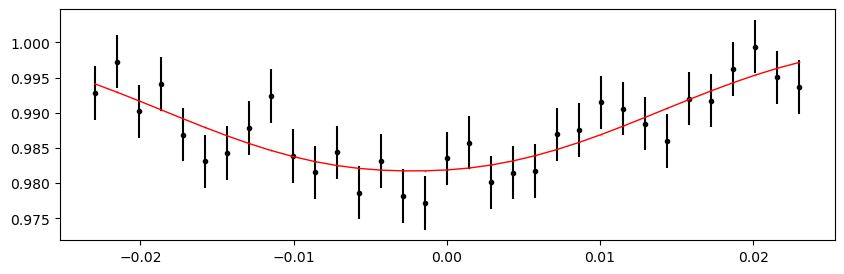

3318.64862 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.13it/s]


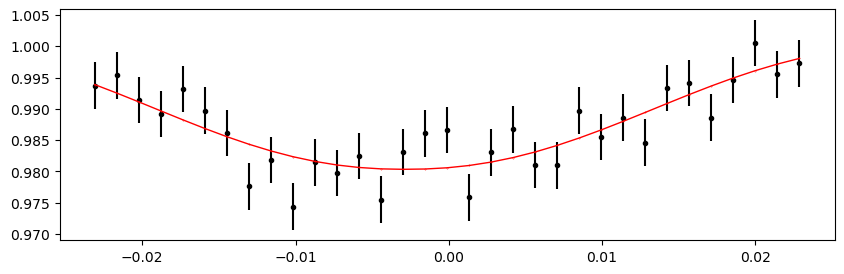

3319.6154189999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.71it/s]


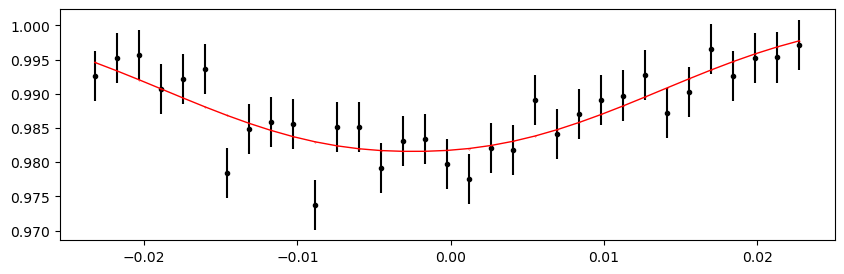

3320.5822179999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 292.53it/s]


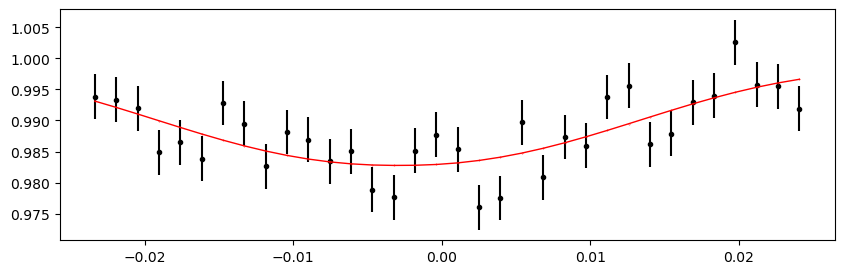

3321.549017 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.75it/s]


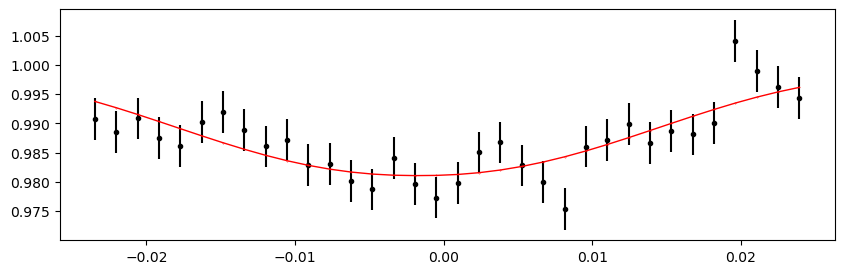

3322.515816 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.40it/s]


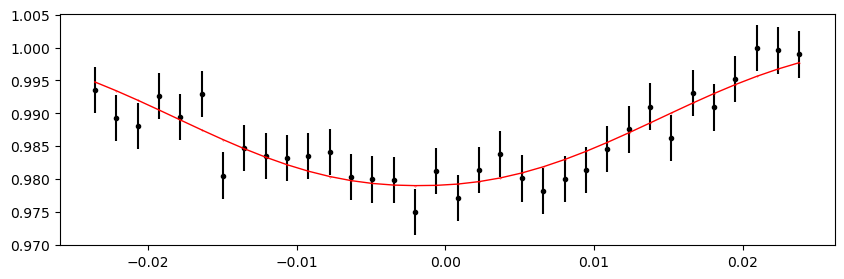

3323.482615 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.38it/s]


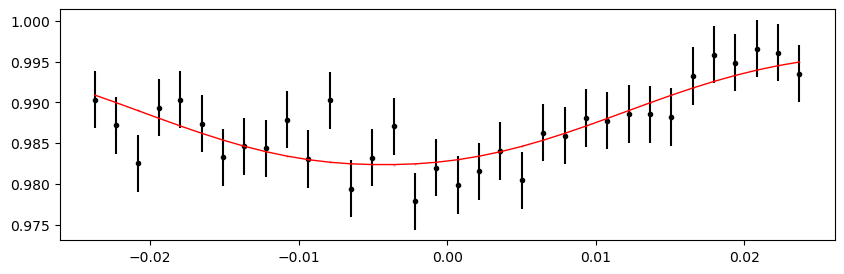

3324.4494139999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.73it/s]


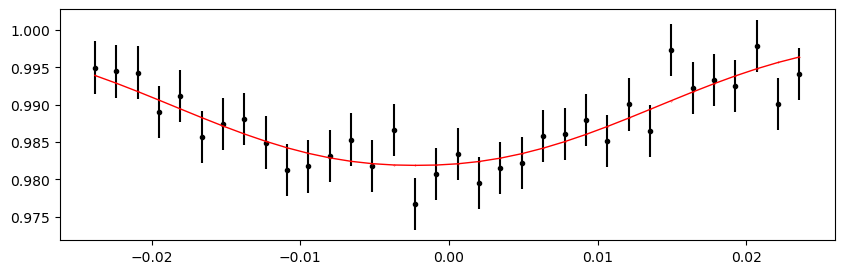

3325.4162129999995 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.78it/s]


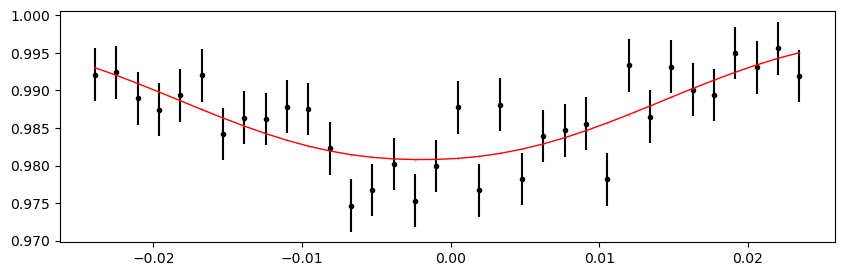

3326.383012 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.14it/s]


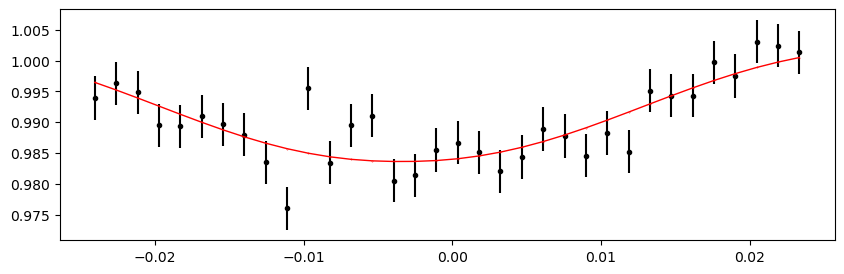

3327.349811 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.19it/s]


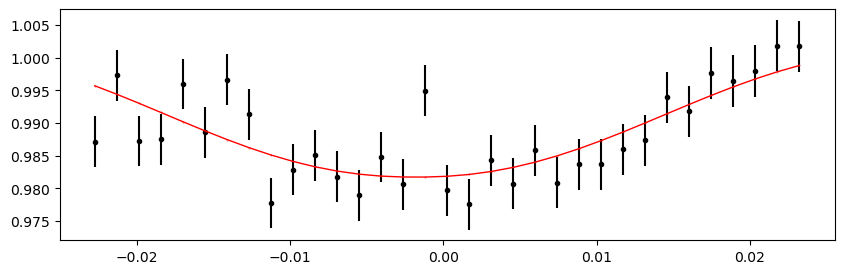

3329.2834089999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.17it/s]


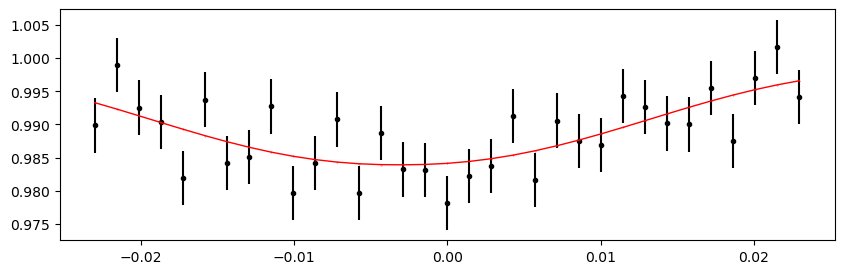

3330.250208 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.04it/s]


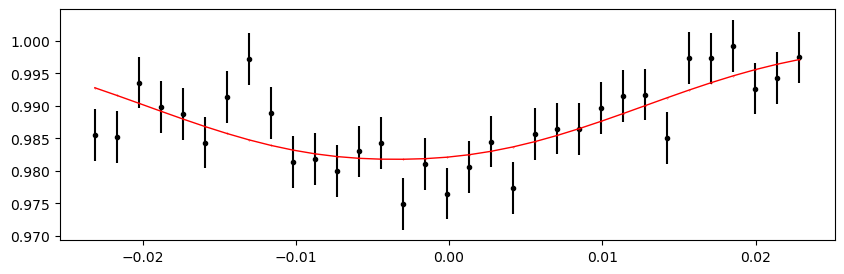

3331.2170069999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.08it/s]


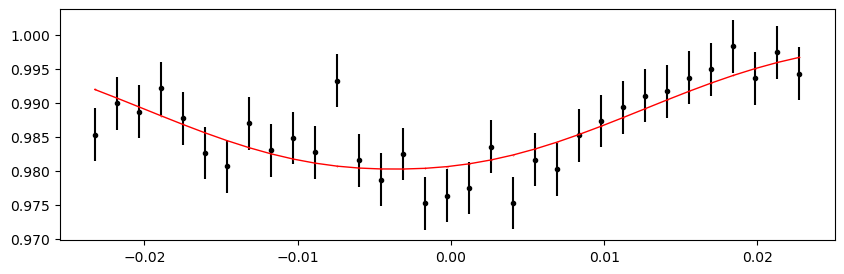

3332.183806 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.90it/s]


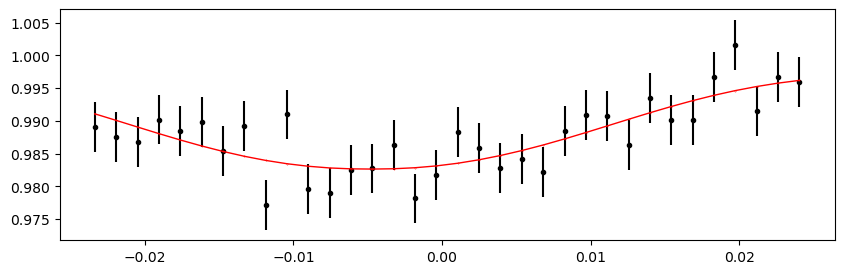

3333.150605 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.94it/s]


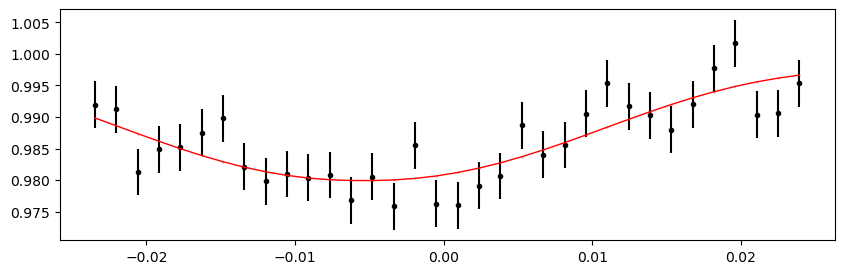

3334.1174039999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.21it/s]


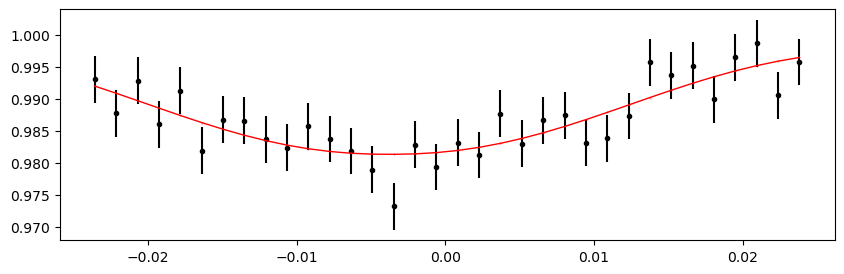

3335.084203 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.45it/s]


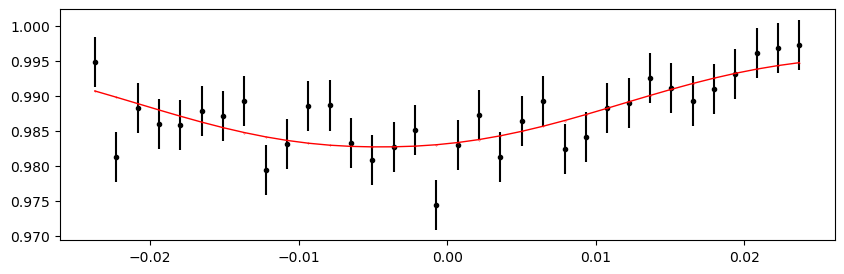

3336.051002 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:37<00:00, 267.81it/s]


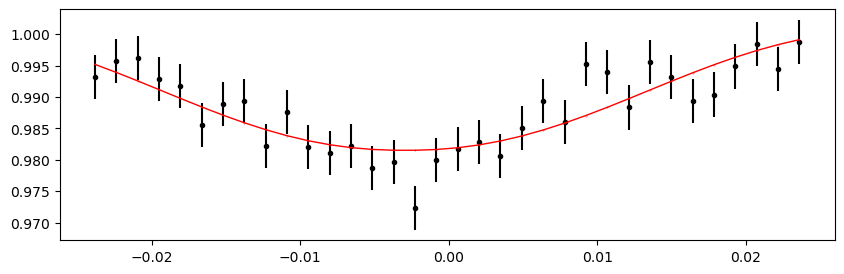

3337.017801 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.22it/s]


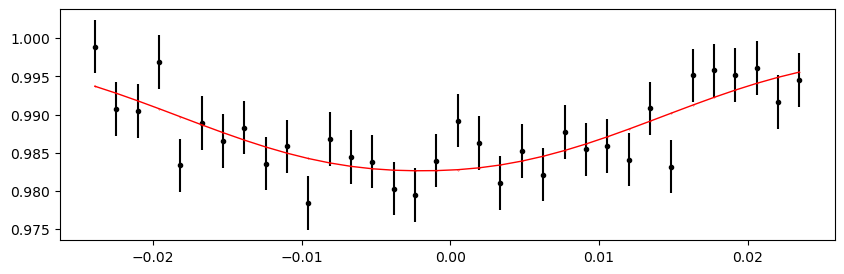

3337.9846 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.29it/s]


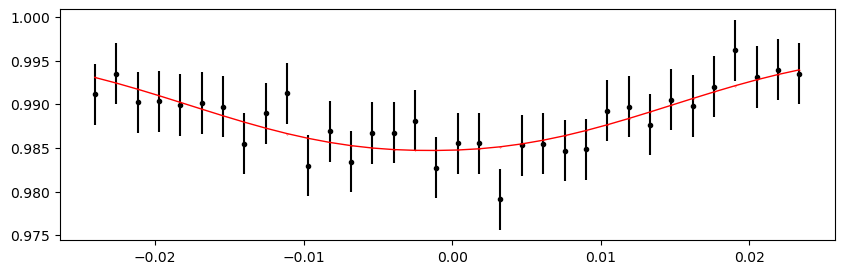

3338.9513989999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.57it/s]


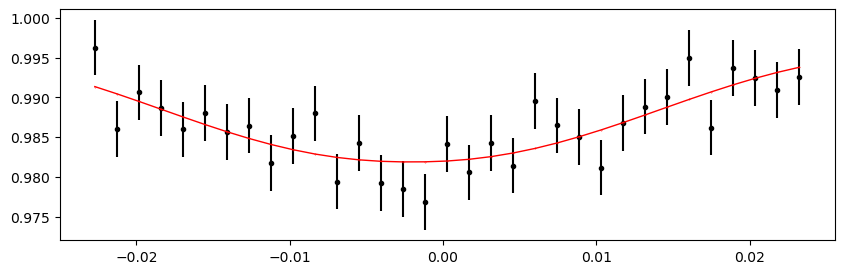

3453.033681 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.90it/s]


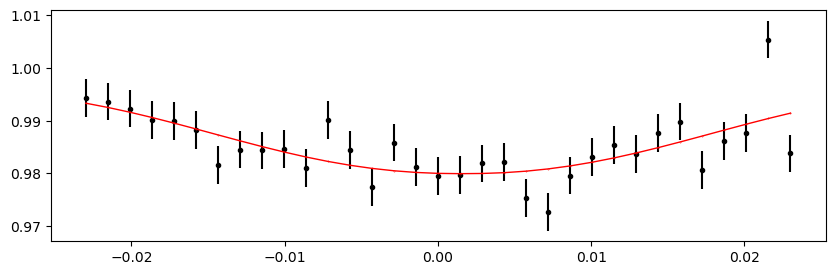

3454.0004799999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.22it/s]


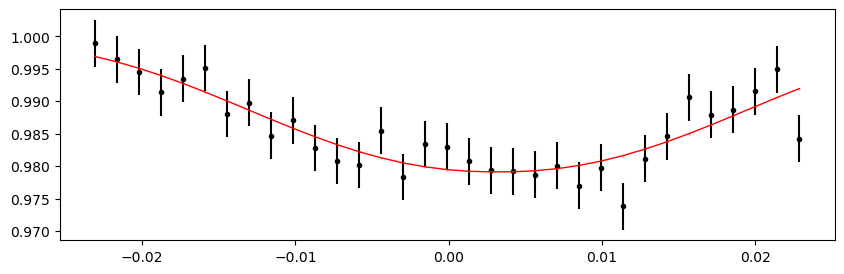

3454.9672789999995 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.01it/s]


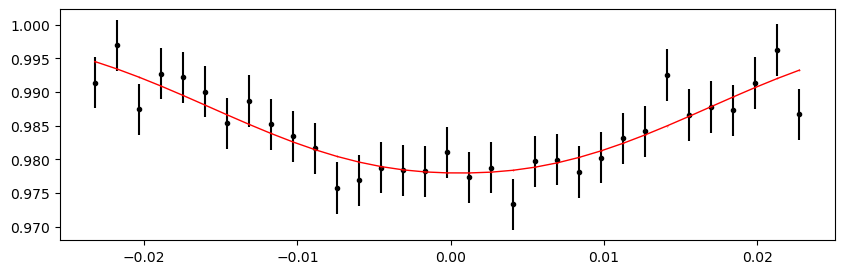

3455.9340779999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.37it/s]


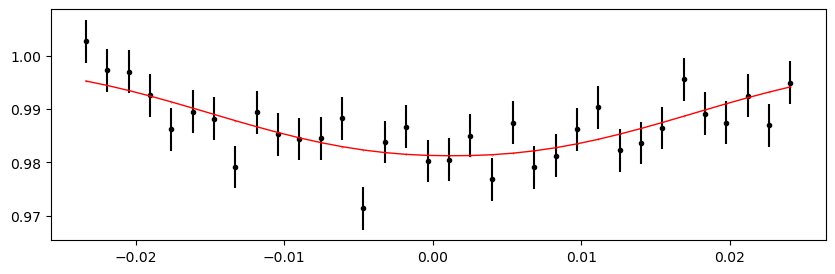

3456.900877 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.00it/s]


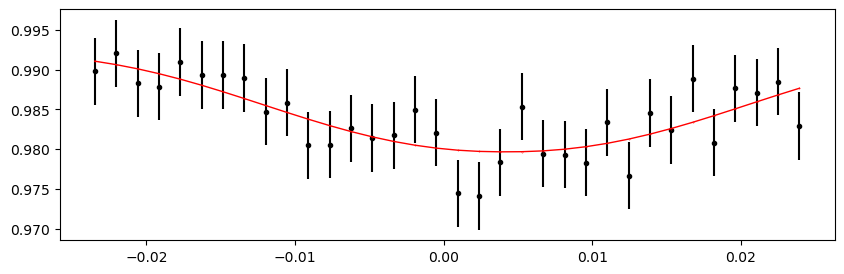

3457.867676 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.39it/s]


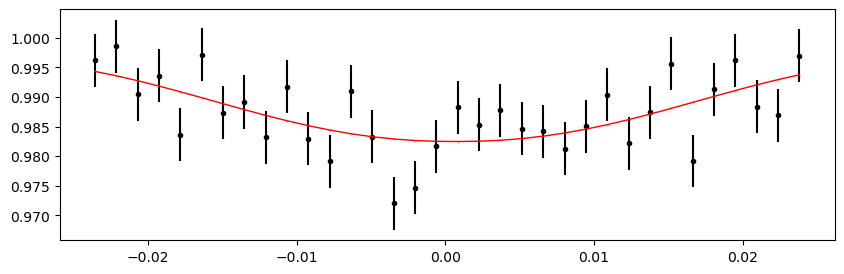

3458.8344749999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.26it/s]


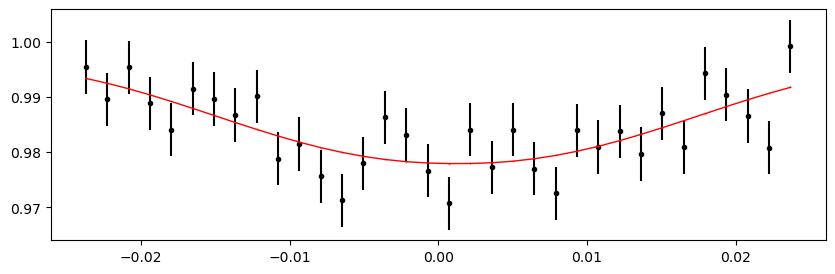

3461.734872 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.96it/s]


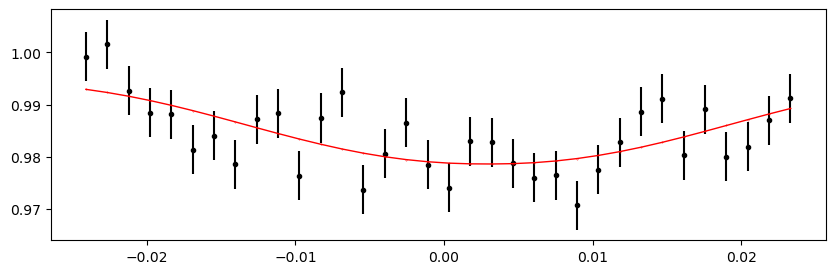

3462.701671 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.15it/s]


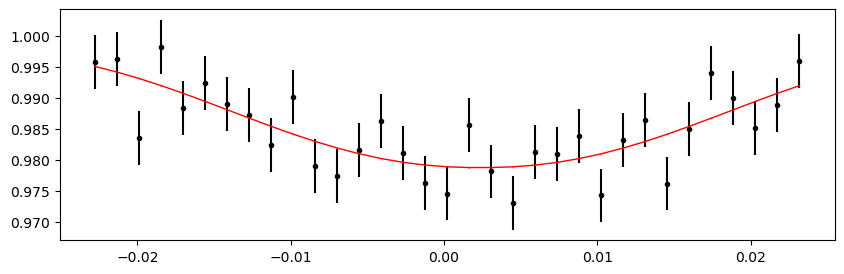

3463.6684699999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.01it/s]


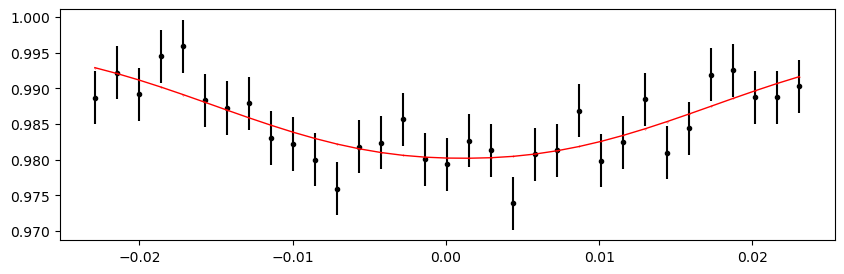

3464.635269 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 286.89it/s]


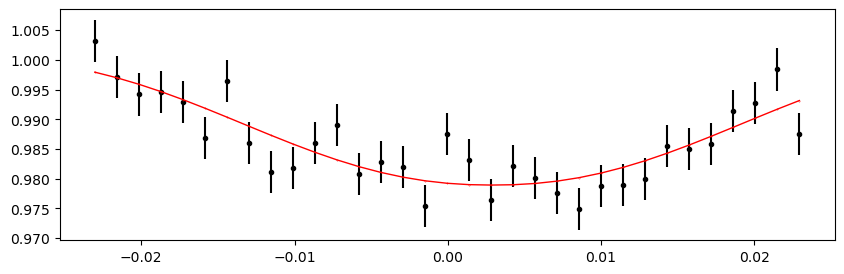

Time 3465.602068 does not have enough data points: 17
3466.568867 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.00it/s]


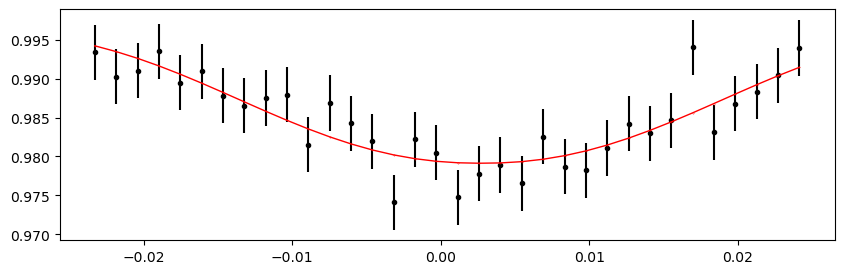

3467.5356659999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.86it/s]


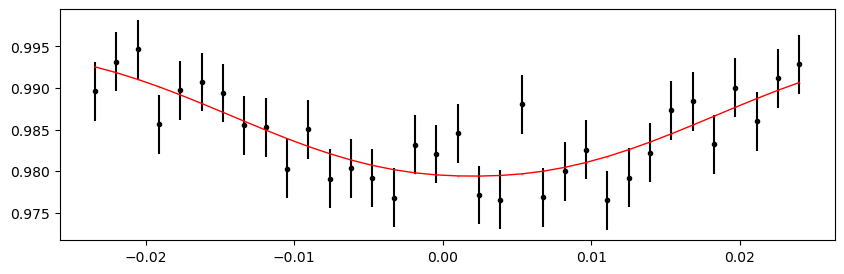

3468.5024649999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.41it/s]


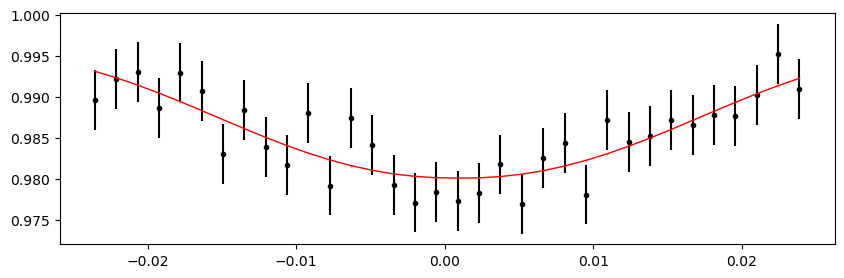

3469.469264 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.07it/s]


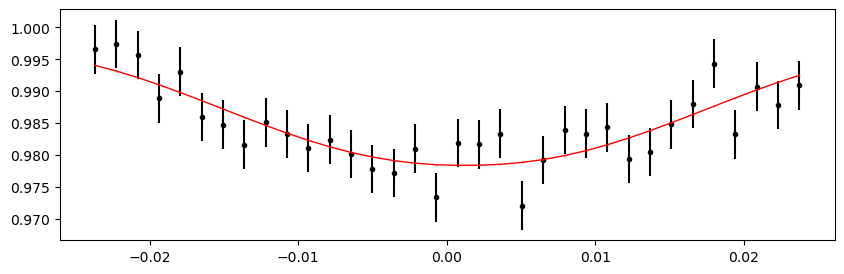

3470.436063 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.35it/s]


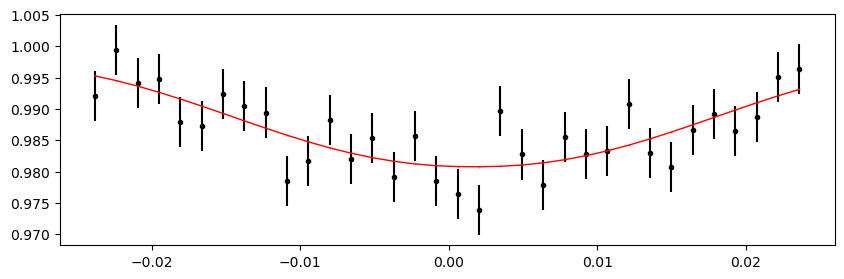

3471.402862 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.81it/s]


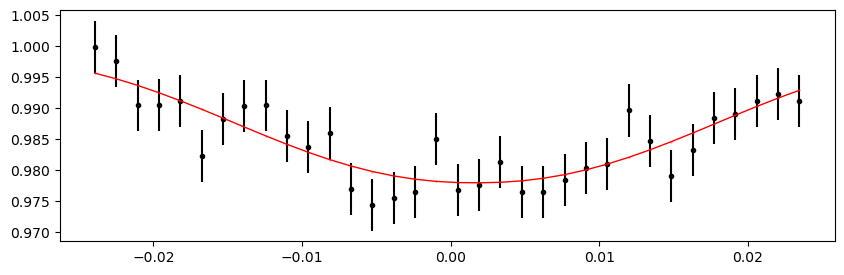

3472.3696609999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.71it/s]


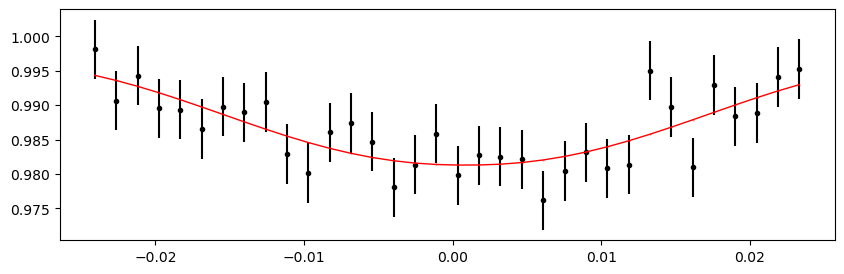

3473.3364599999995 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.46it/s]


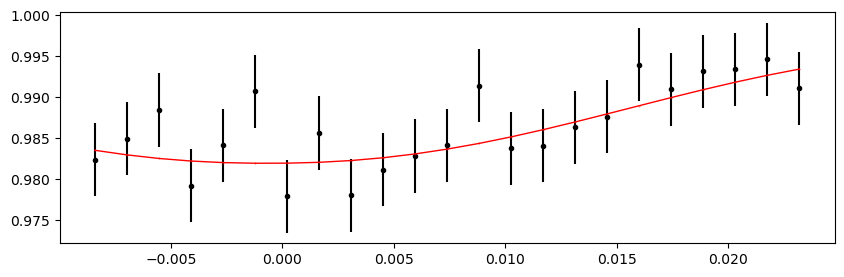

3474.303259 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.36it/s]


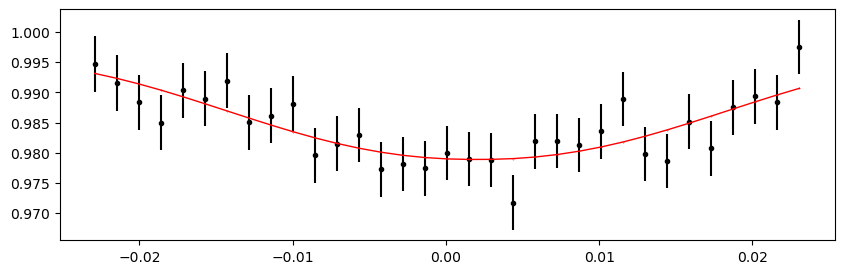

3475.270058 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.39it/s]


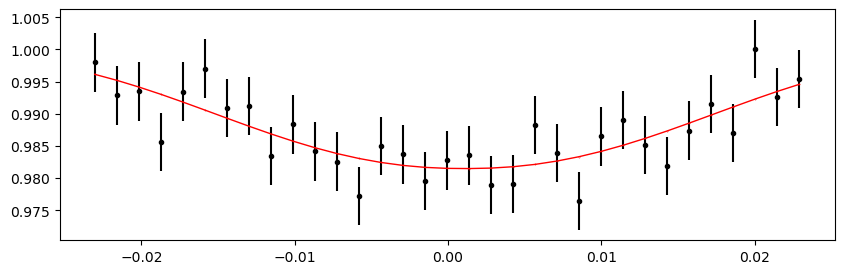

3476.236857 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.57it/s]


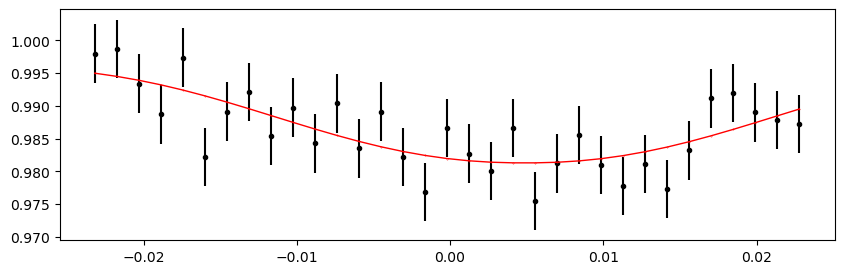

3477.2036559999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.52it/s]


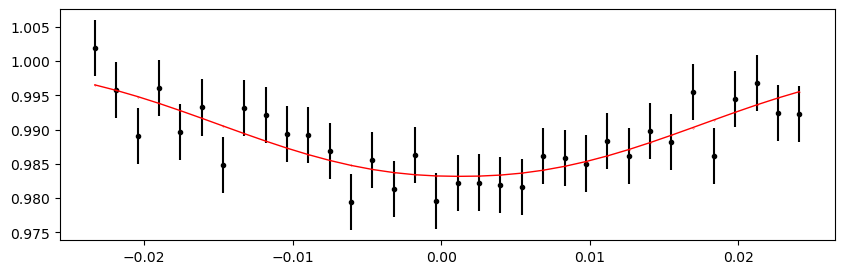

3478.170455 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.50it/s]


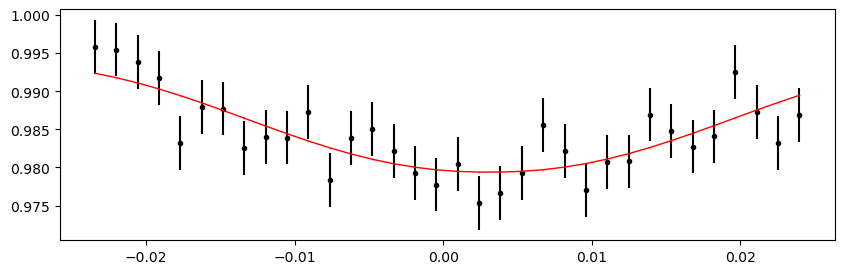

3479.1372539999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.98it/s]


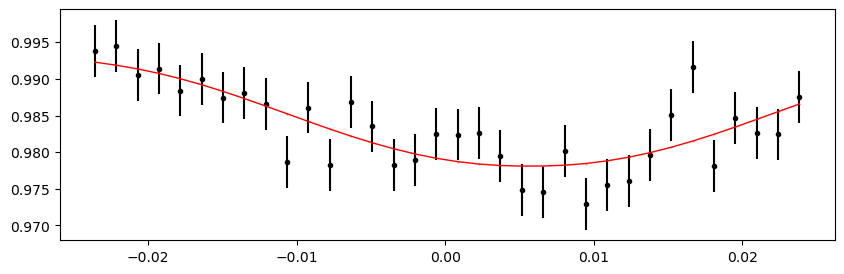

3480.104053 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.57it/s]


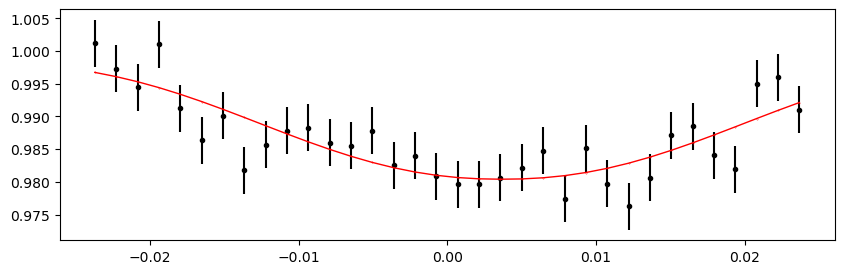

3481.070852 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.98it/s]


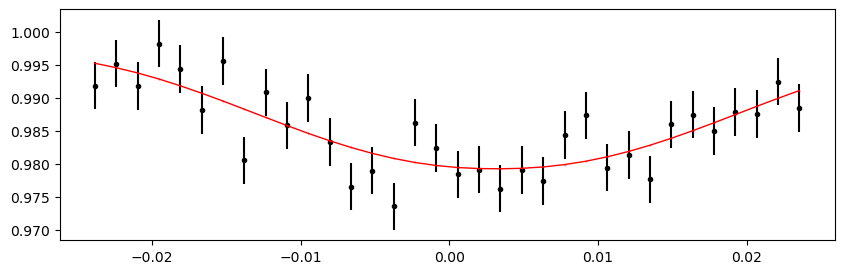

3482.0376509999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.50it/s]


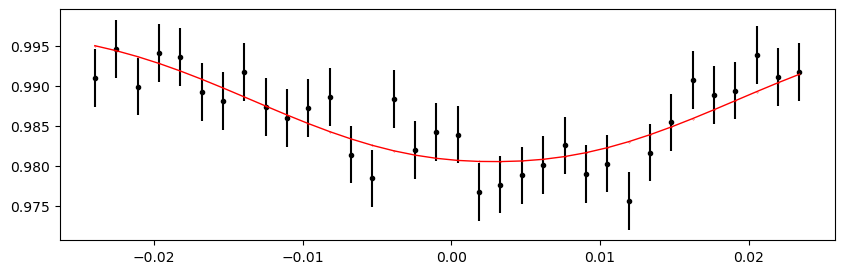

3483.00445 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.45it/s]


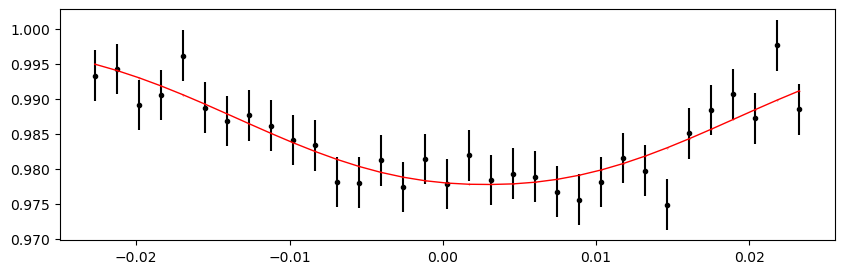

3483.971249 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.42it/s]


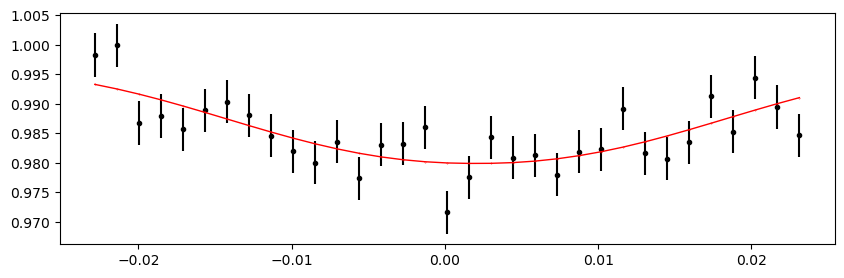

3484.938048 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.04it/s]


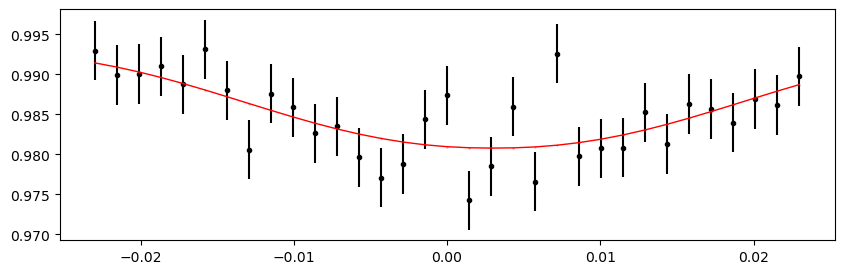

3485.904847 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.95it/s]


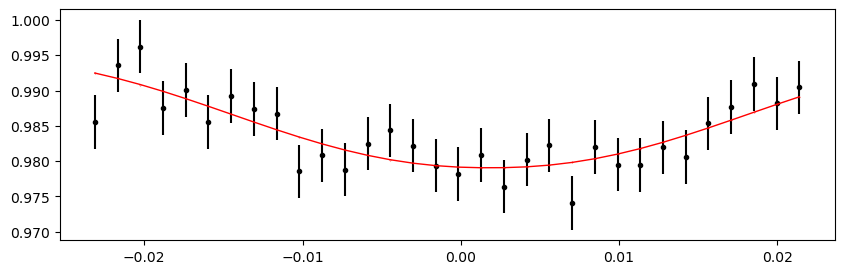

3486.8716459999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.41it/s]


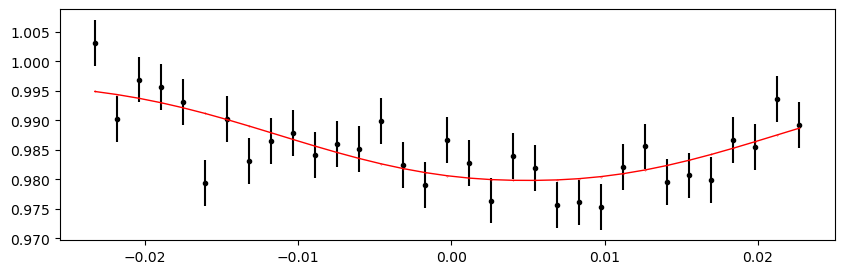

3487.838445 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.95it/s]


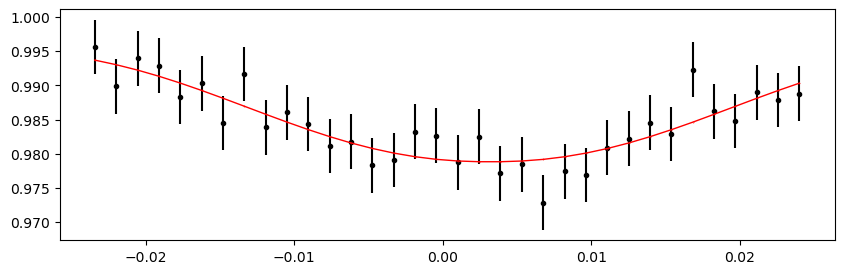

3488.805244 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.87it/s]


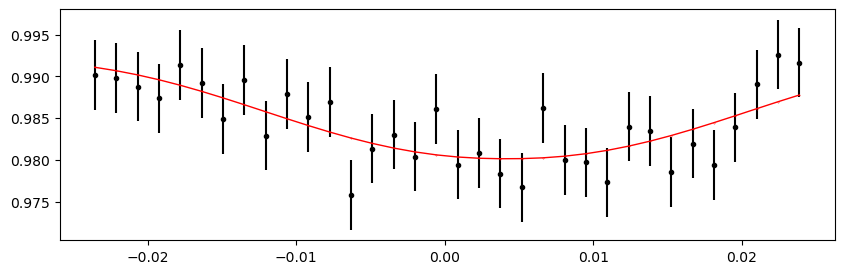

3492.67244 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.38it/s]


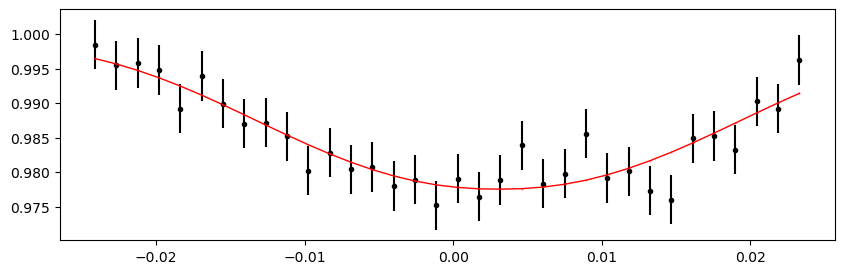

3493.639239 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.31it/s]


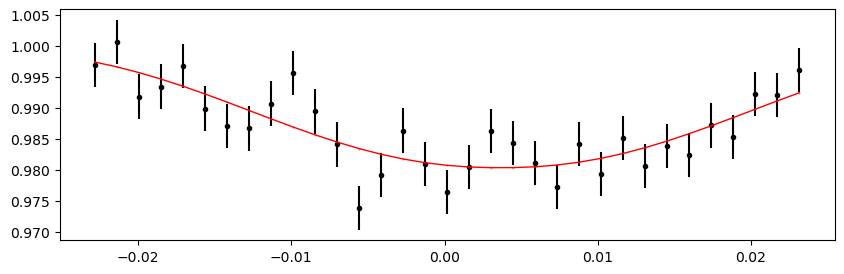

3494.606038 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.71it/s]


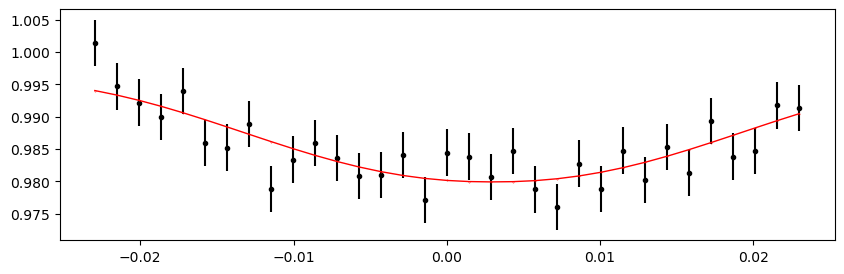

3495.5728369999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.46it/s]


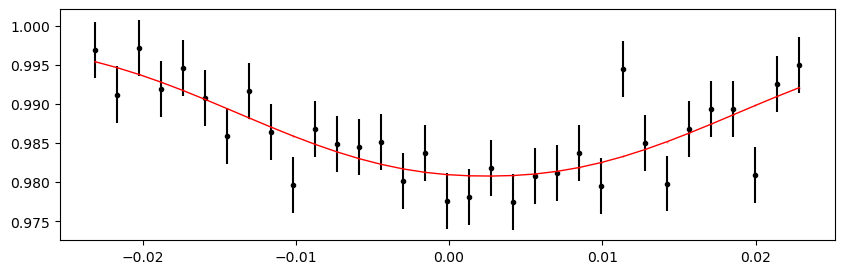

3496.5396359999995 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.62it/s]


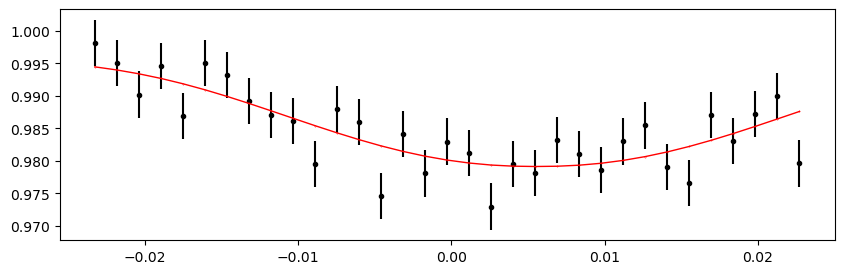

3497.506435 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.96it/s]


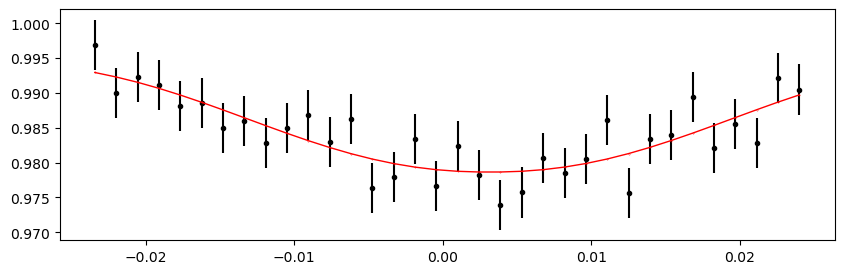

3498.473234 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.62it/s]


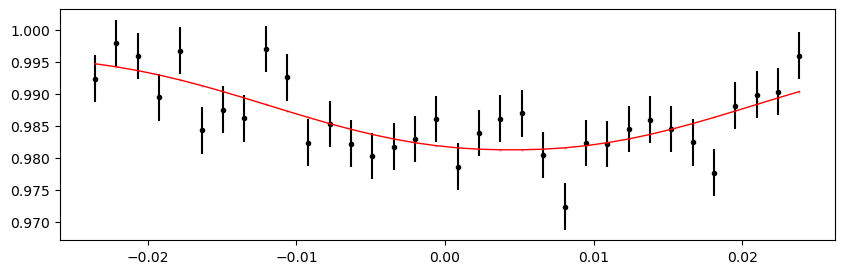

3499.440033 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.09it/s]


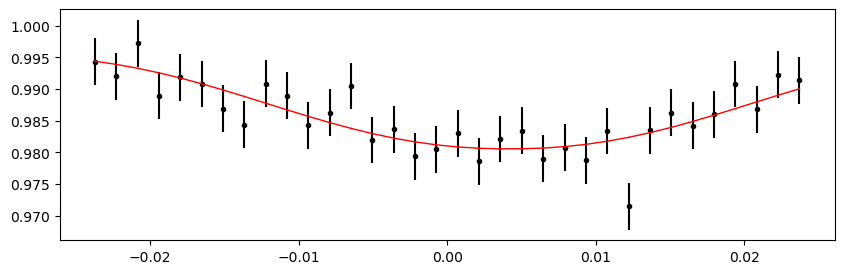

3500.4068319999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 334.51it/s]


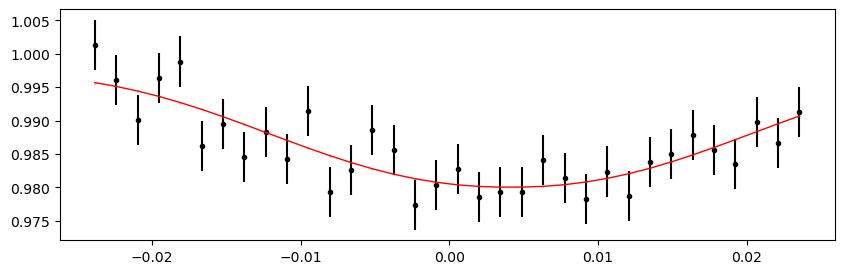

3501.373631 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 299.26it/s]


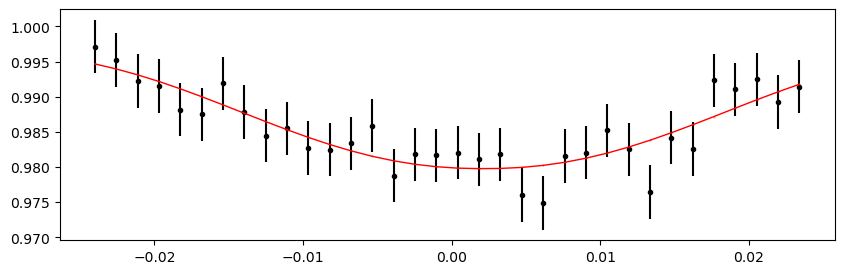

3502.3404299999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.88it/s]


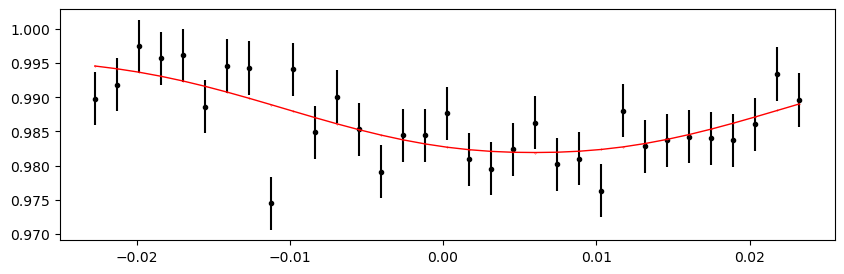

3503.307229 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 406.80it/s]


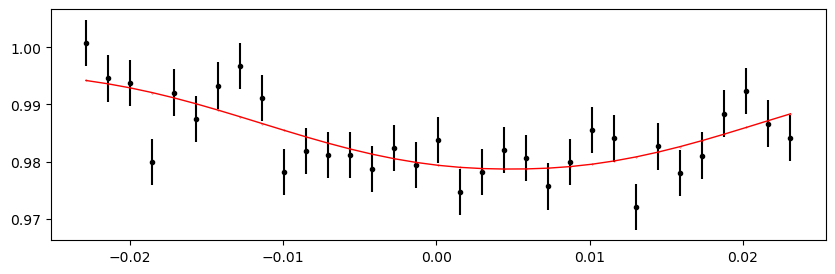

3506.207626 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.33it/s]


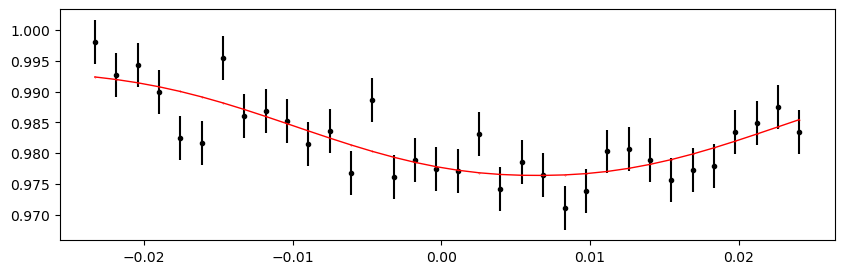

3507.174425 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.15it/s]


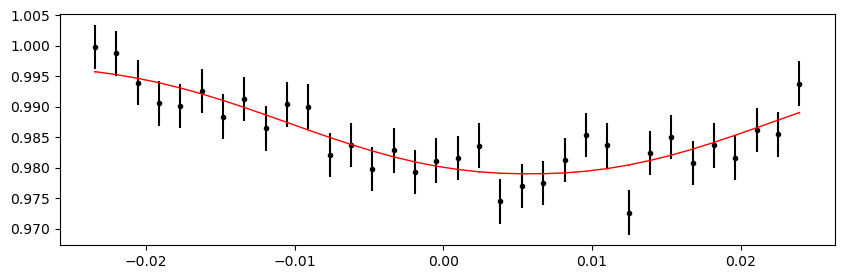

3508.141224 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.93it/s]


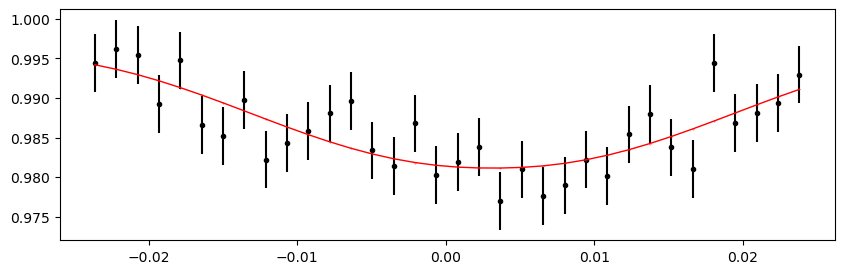

3509.108023 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.35it/s]


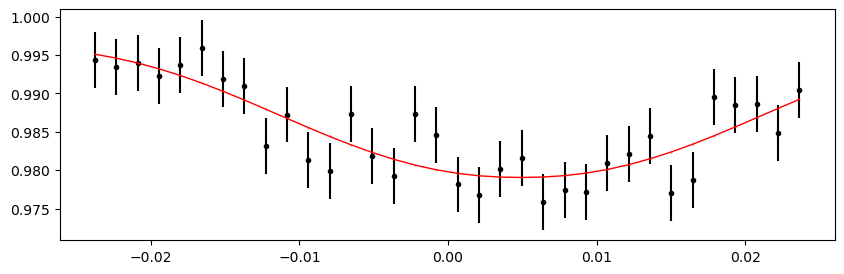

3510.0748219999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.35it/s]


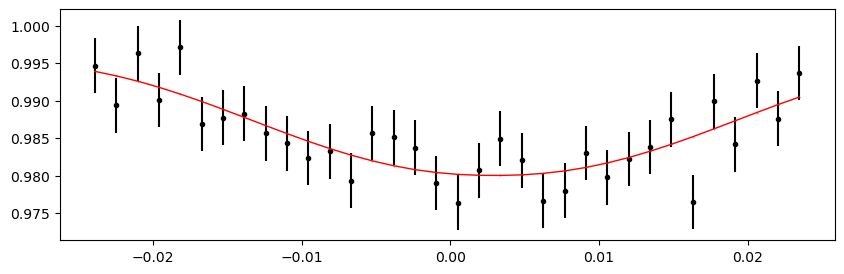

3511.041621 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.48it/s]


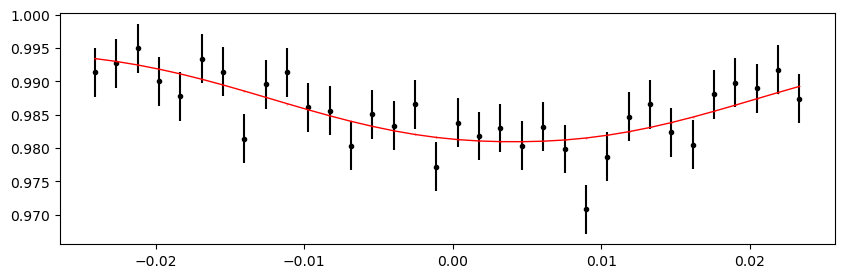

3512.00842 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.96it/s]


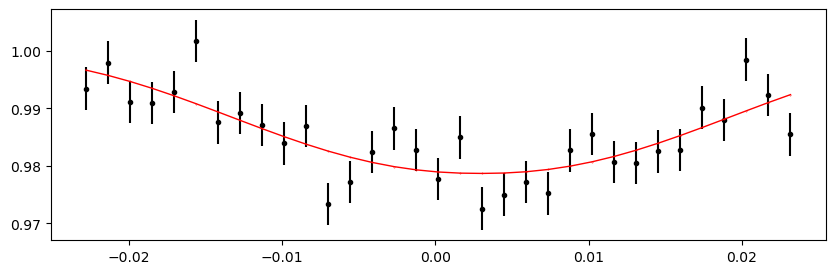

3512.975219 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 288.23it/s]


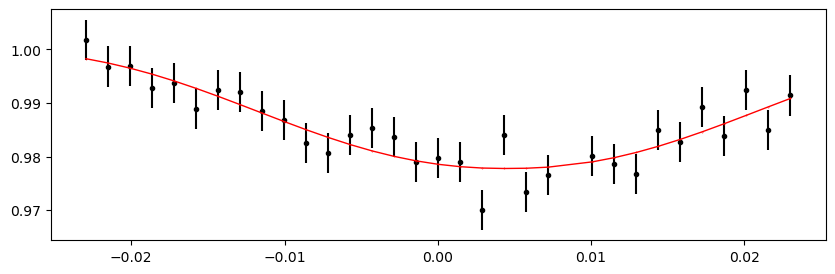

3513.9420179999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 304.88it/s]


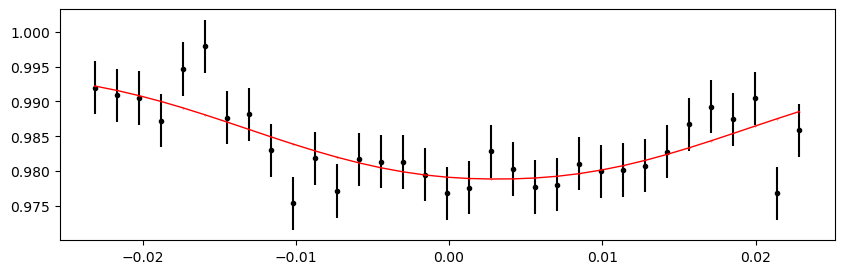

3514.9088169999995 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 313.23it/s]


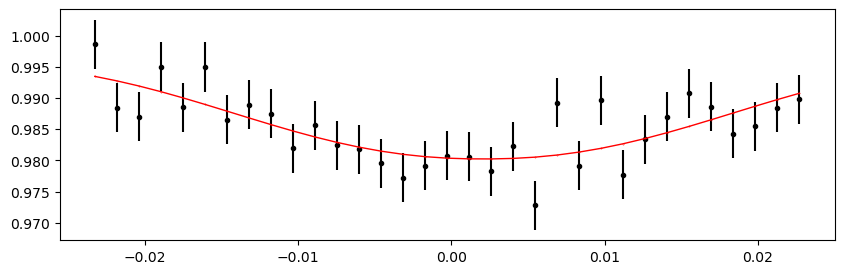

3515.875616 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.75it/s]


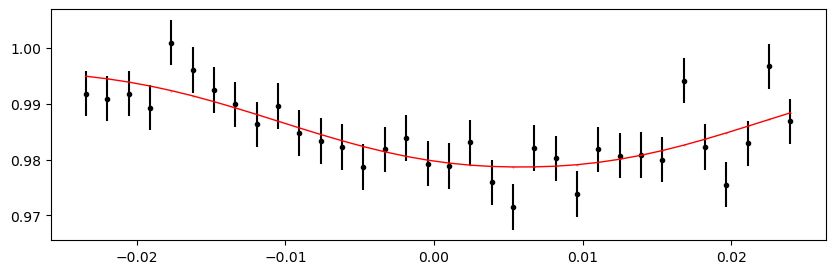

3520.7096109999998 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.89it/s]


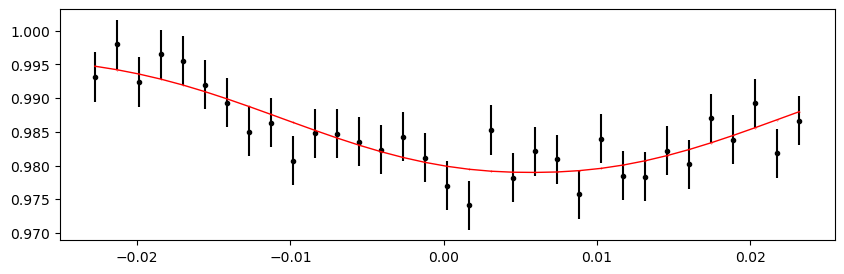

3521.67641 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.95it/s]


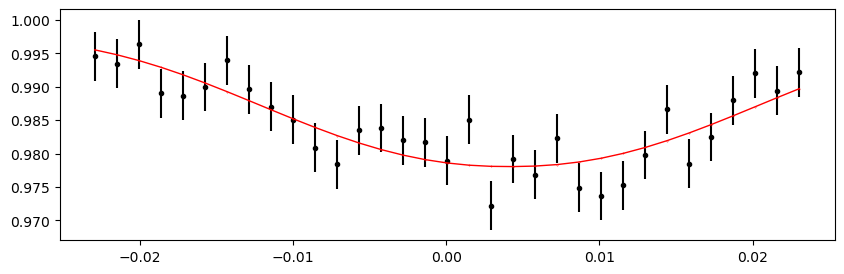

3522.643209 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.02it/s]


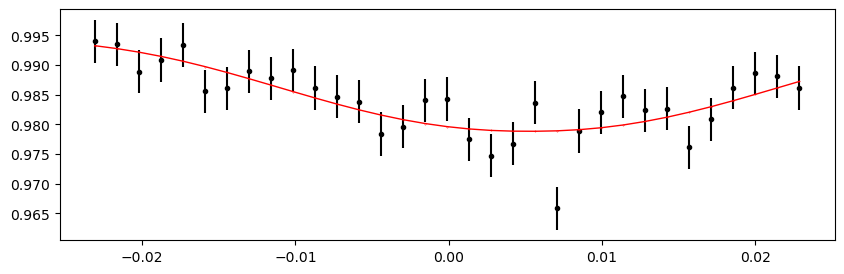

3523.6100079999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.86it/s]


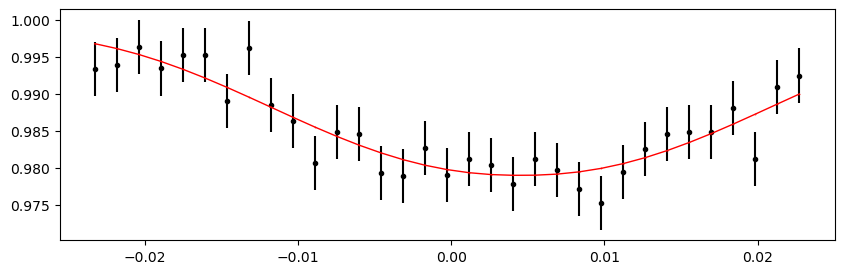

3524.576807 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 329.58it/s]


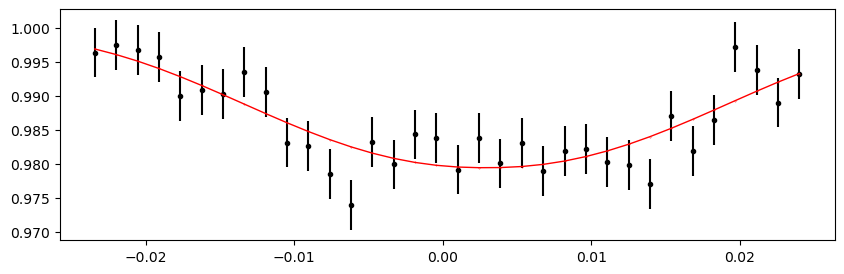

3525.5436059999997 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 337.82it/s]


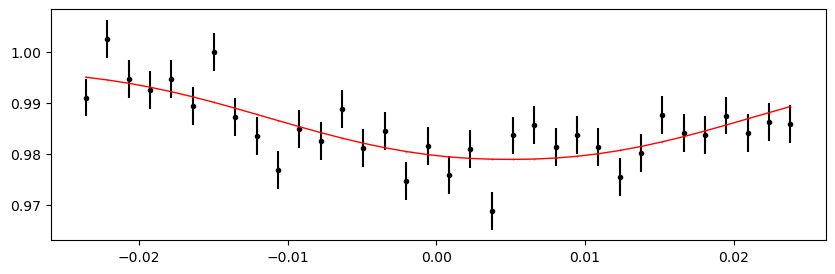

3526.510405 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.41it/s]


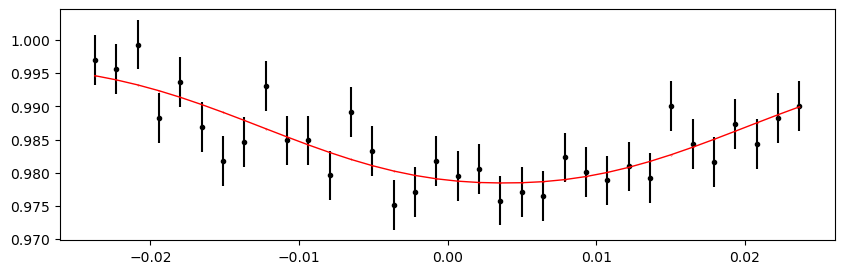

3527.477204 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.20it/s]


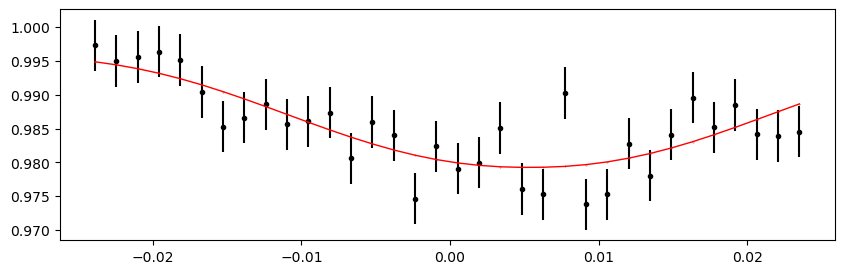

3528.4440029999996 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.43it/s]


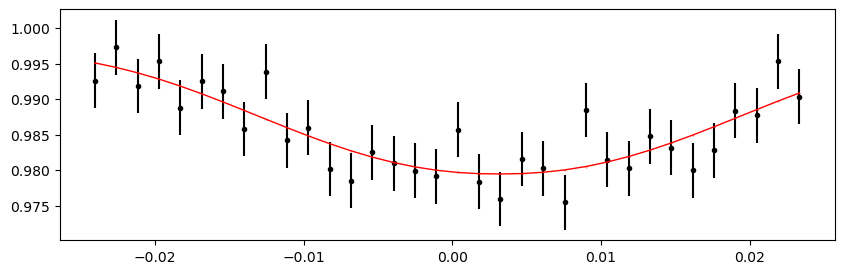

3529.410802 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.09it/s]


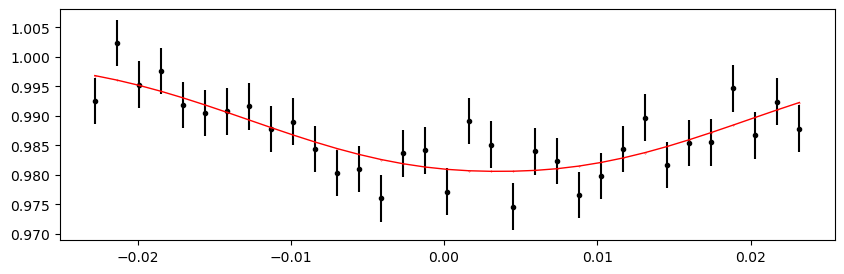

3530.377601 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.71it/s]


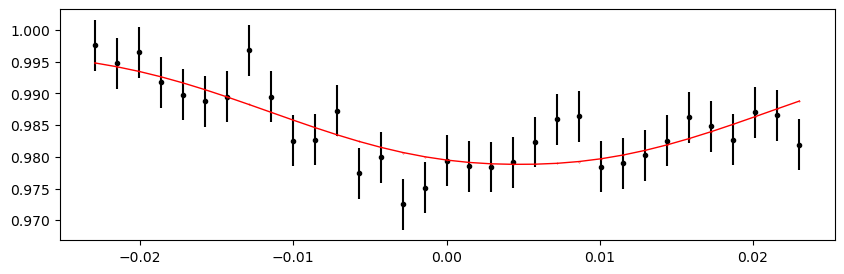

3531.3444 0.9970848499193721 -0.016442307920396693 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.44it/s]


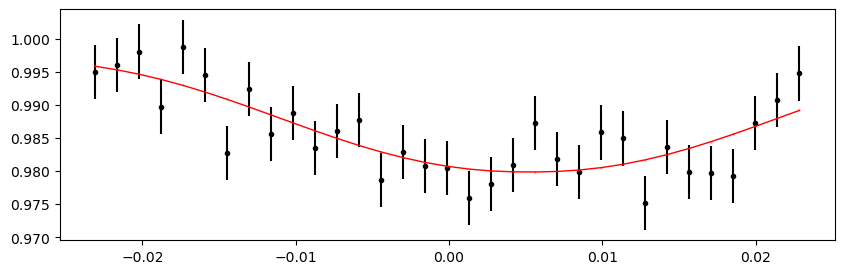

In [25]:
%matplotlib inline

# from importlib import reload
# reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=20,
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"


Fitting individual secondary eclipses...
Creating new manifest file
1983.9826004999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.46it/s]


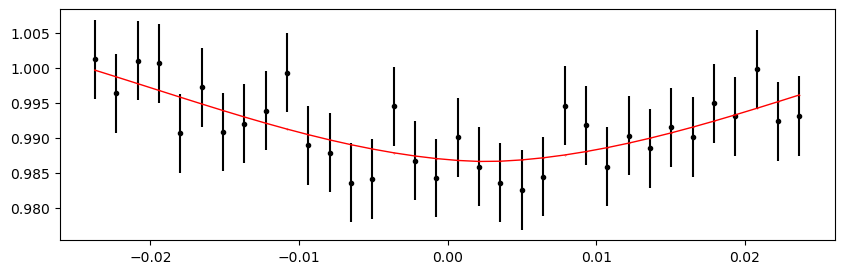

1985.9161984999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.69it/s]


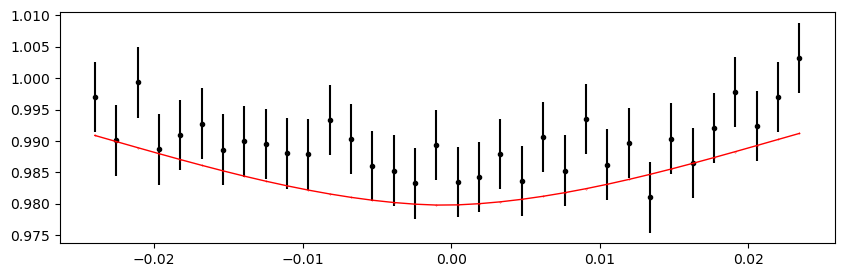

1986.8829974999999 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.55it/s]


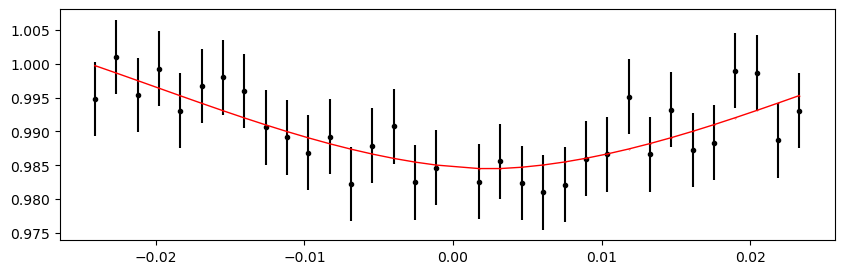

1987.8497964999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.11it/s]


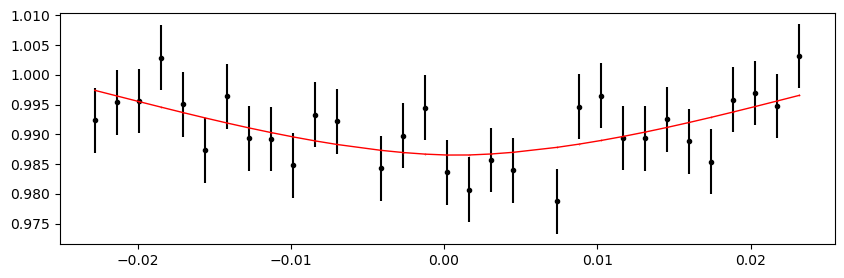

1988.8165954999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.50it/s]


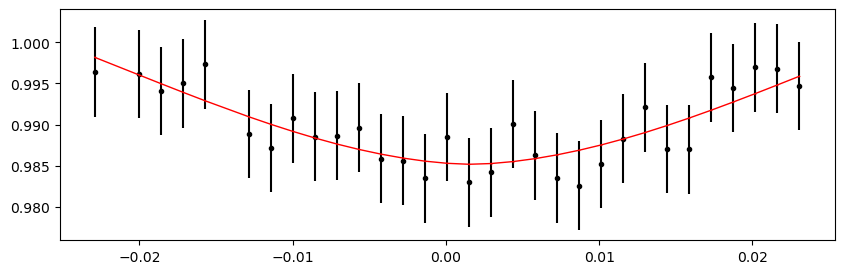

1989.7833944999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.16it/s]


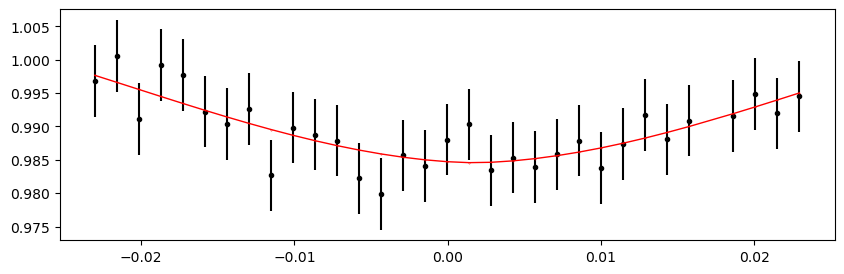

1990.7501934999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.93it/s]


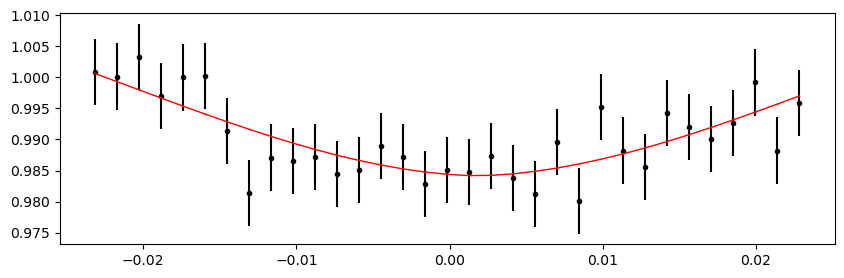

1991.7169924999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.54it/s]


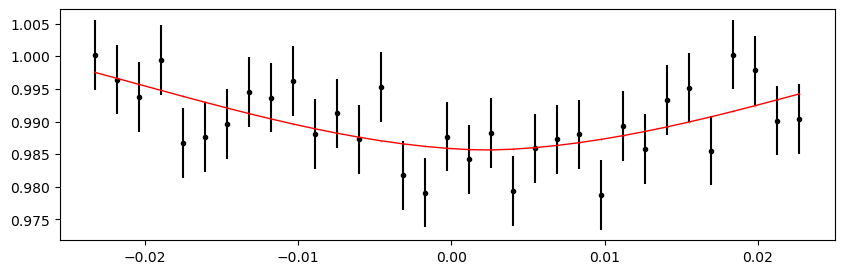

1992.6837914999999 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.48it/s]


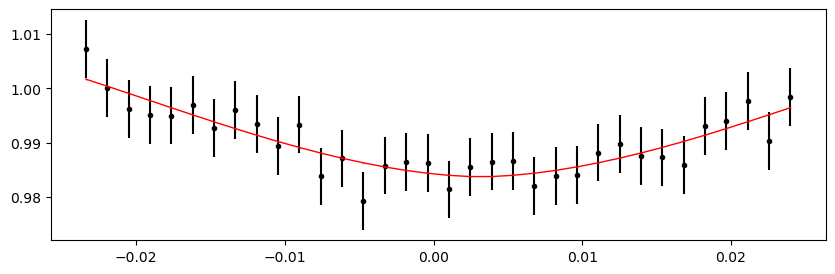

1993.6505904999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.68it/s]


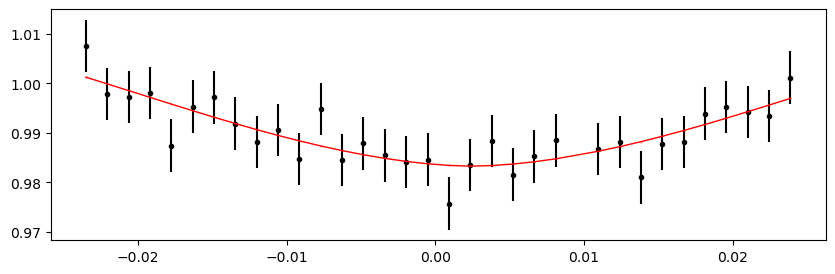

1994.6173894999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.33it/s]


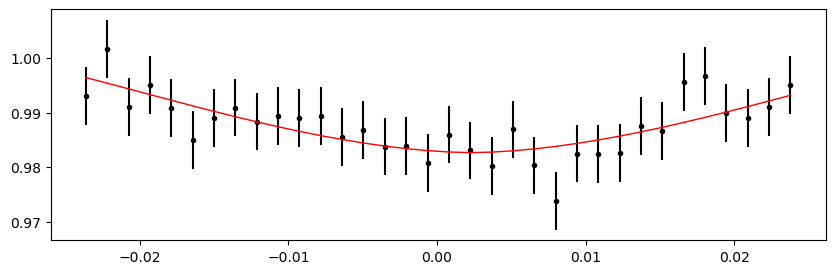

1995.5841884999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.81it/s]


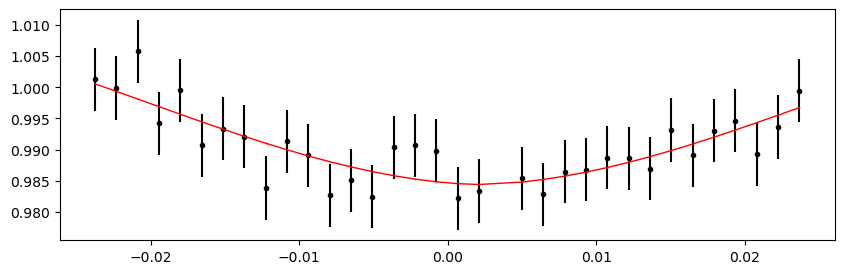

1997.5177864999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.63it/s]


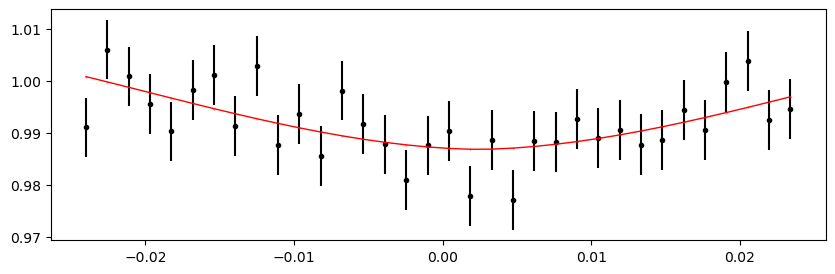

1998.4845854999999 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.62it/s]


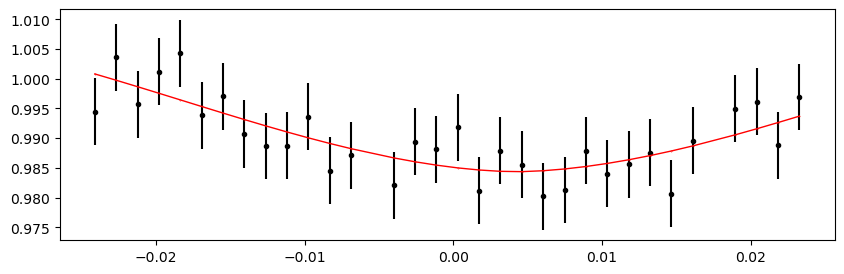

1999.4513844999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.42it/s]


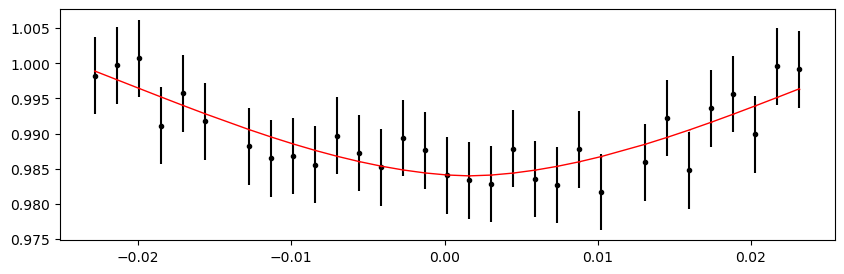

2000.4181834999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 428.94it/s]


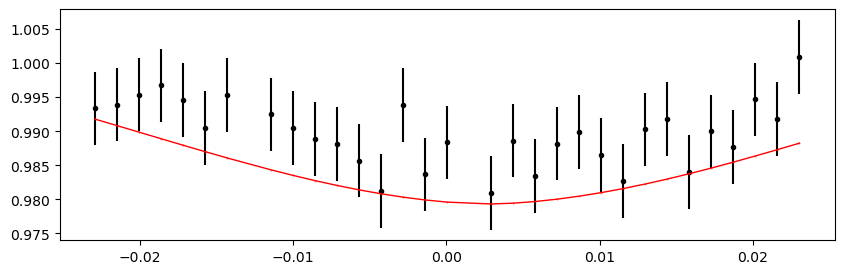

2001.3849824999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.50it/s]


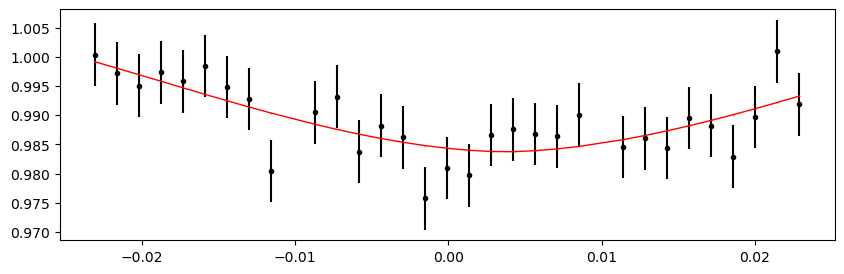

2002.3517814999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.32it/s]


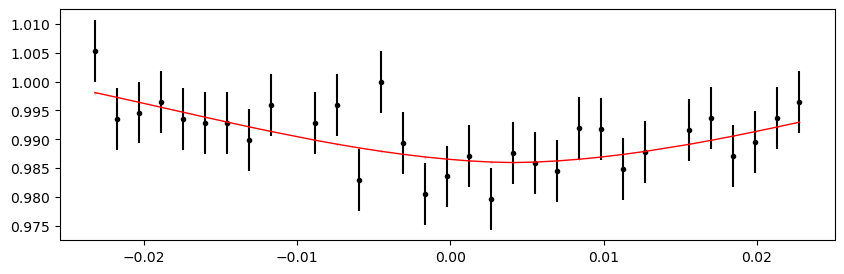

2003.3185804999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.47it/s]


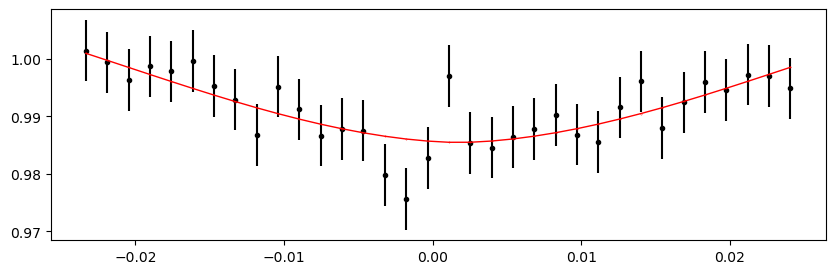

2004.2853794999999 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.89it/s]


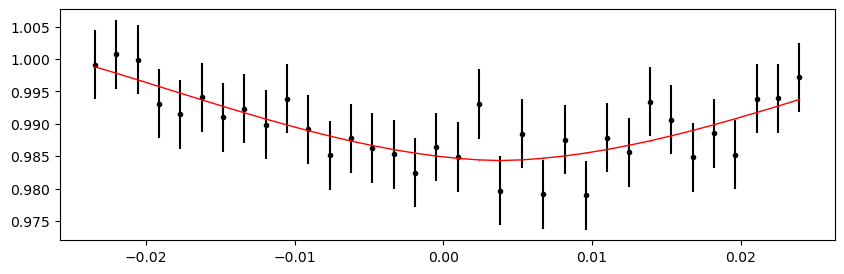

2005.2521784999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.13it/s]


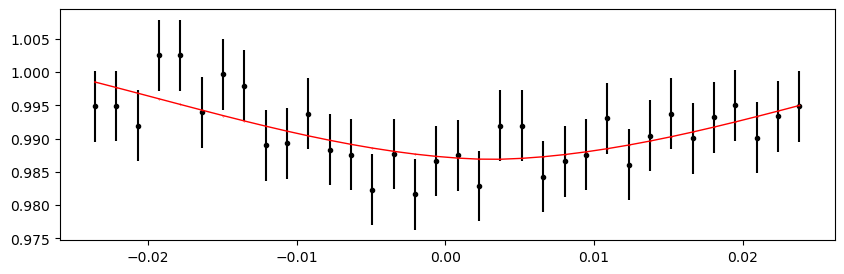

2006.2189774999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.84it/s]


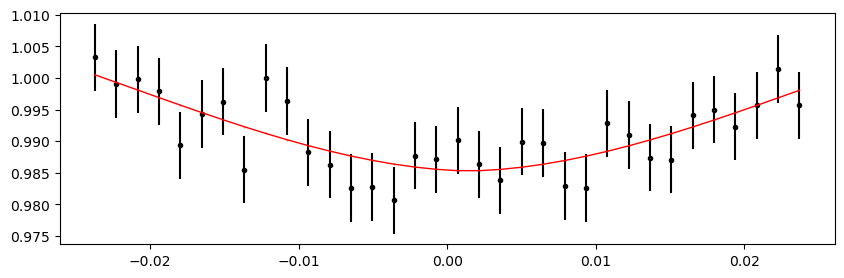

2007.1857764999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.03it/s]


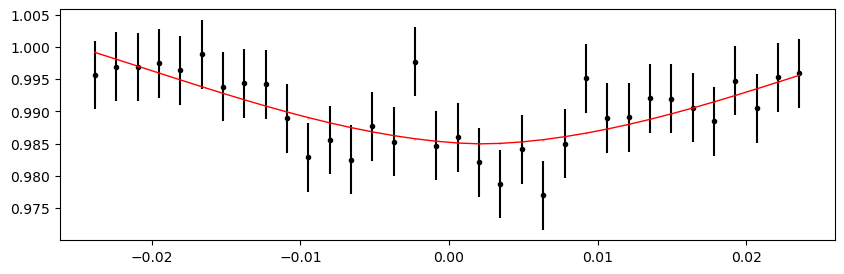

2008.1525754999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.59it/s]


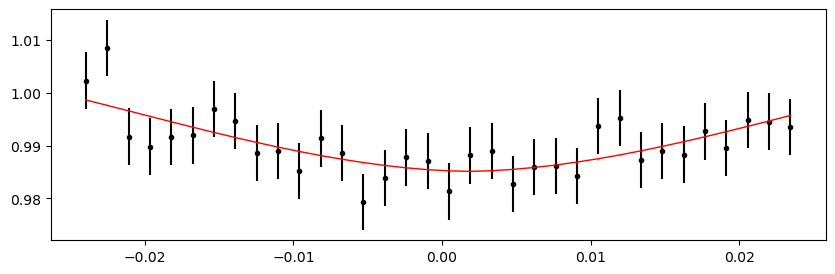

2009.1193744999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.84it/s]


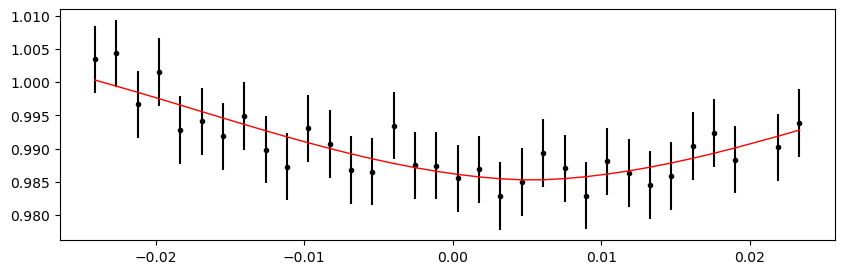

2011.0529724999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.18it/s]


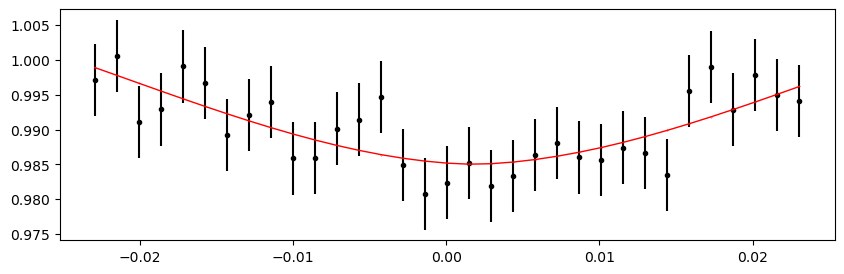

2012.0197714999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 483.12it/s]


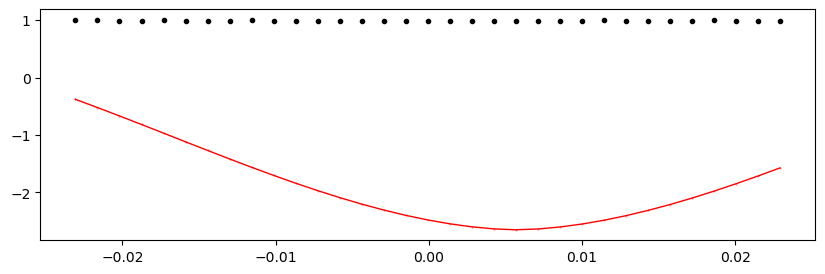

2012.9865704999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.78it/s]


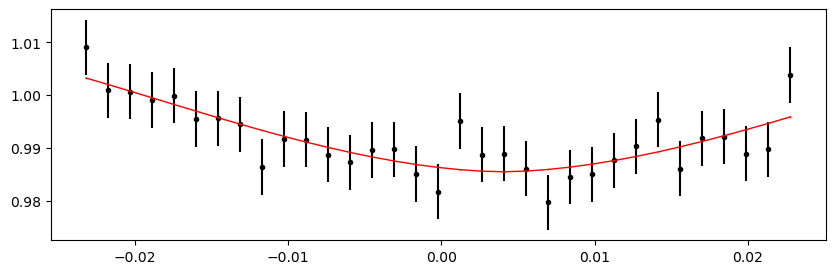

2013.9533694999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 413.17it/s]


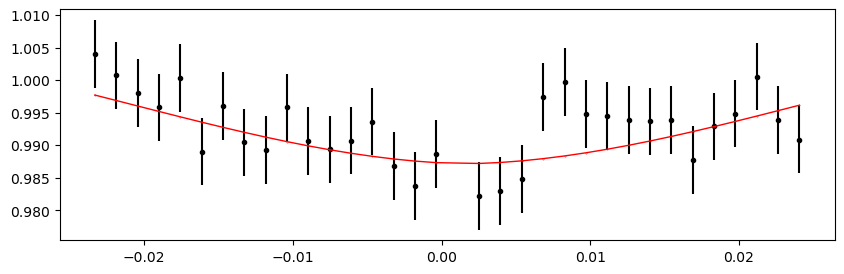

2014.9201684999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.32it/s]


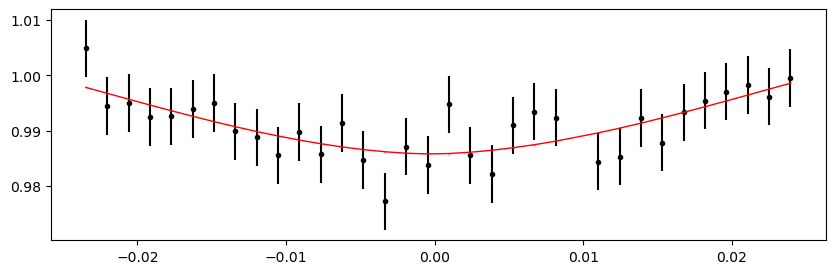

2015.8869674999999 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.57it/s]


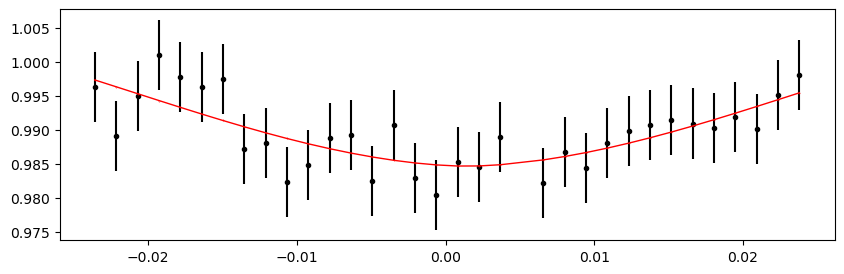

2016.8537664999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.60it/s]


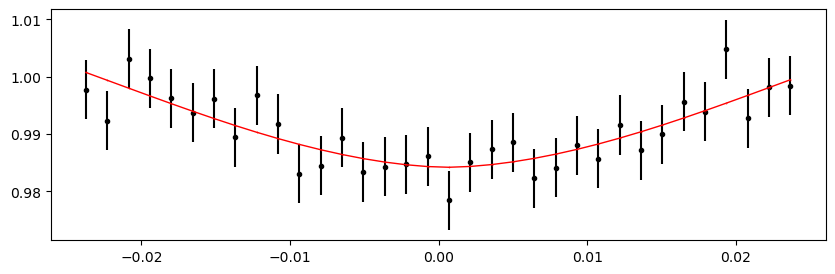

2017.8205654999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.38it/s]


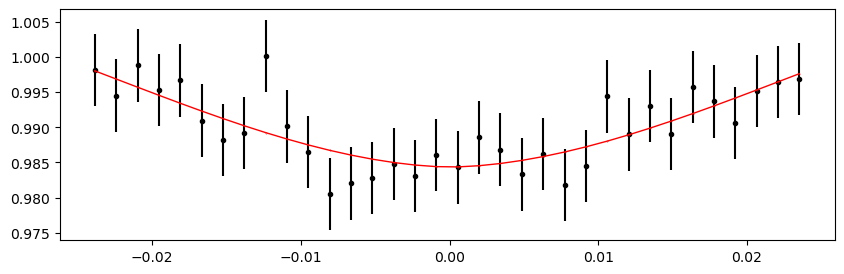

2018.7873644999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.74it/s]


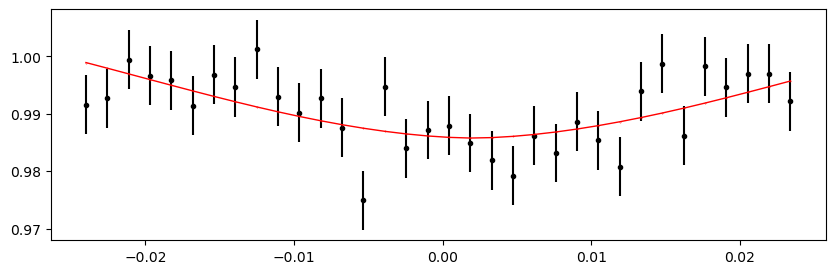

2019.7541634999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 497.70it/s]


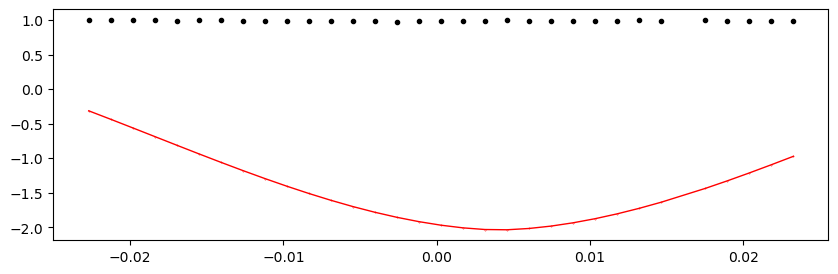

2020.7209624999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.14it/s]


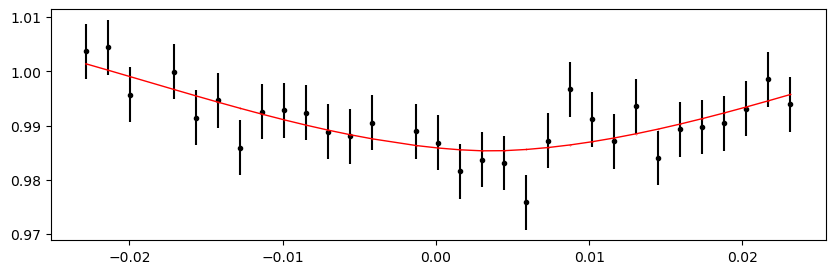

2021.6877614999999 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.29it/s]


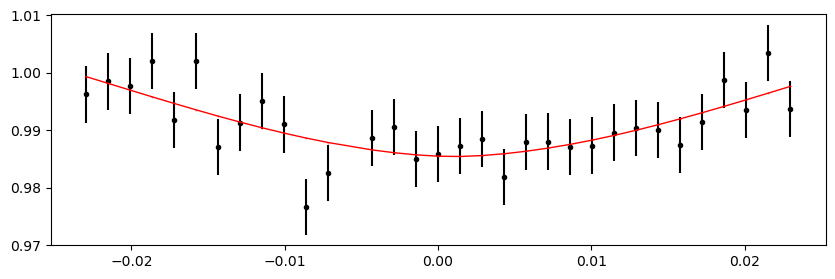

2023.6213594999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.19it/s]


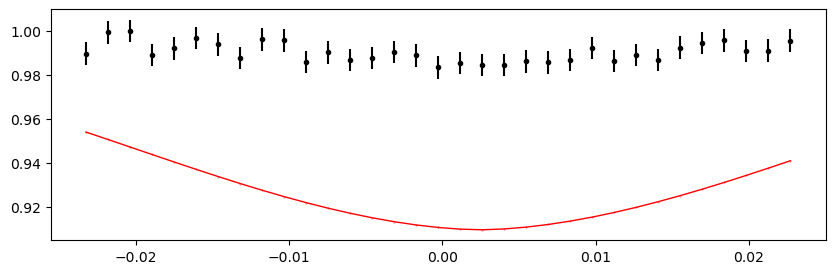

2024.5881584999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 261.19it/s]


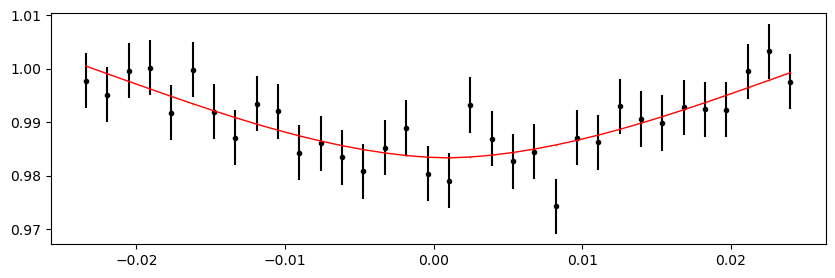

2025.5549574999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.36it/s]


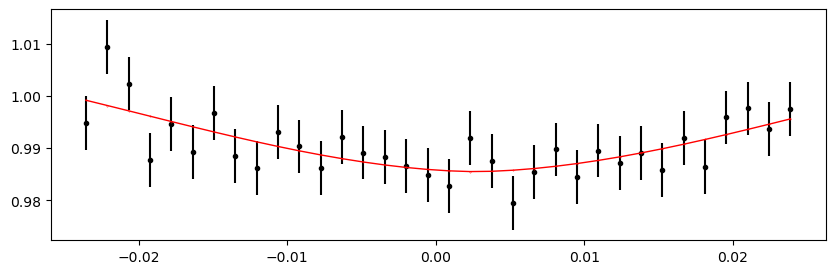

2026.5217564999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.55it/s]


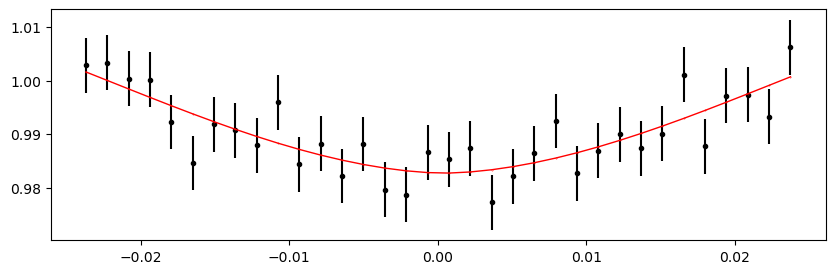

2027.4885554999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.81it/s]


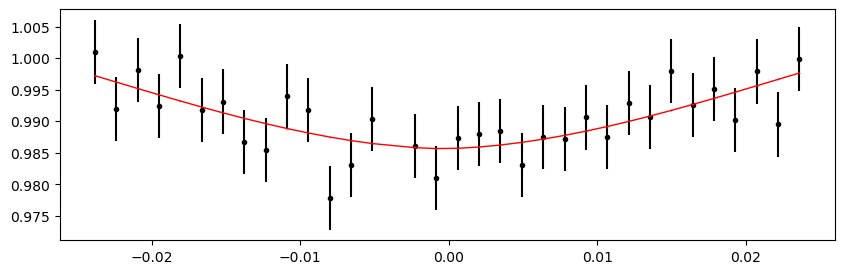

2028.4553544999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.21it/s]


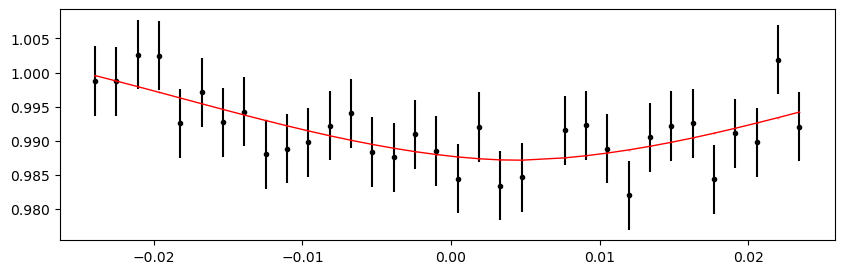

2029.4221534999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.14it/s]


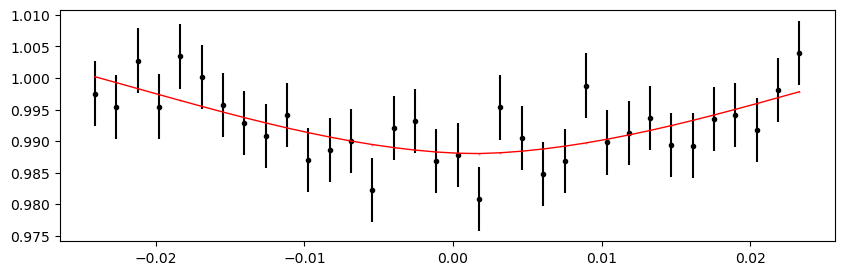

2030.3889524999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.47it/s]


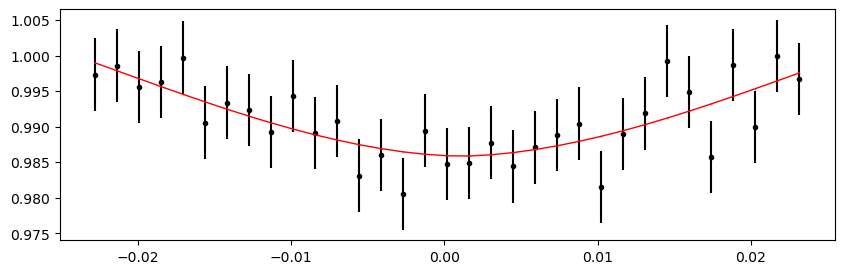

2031.3557514999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.80it/s]


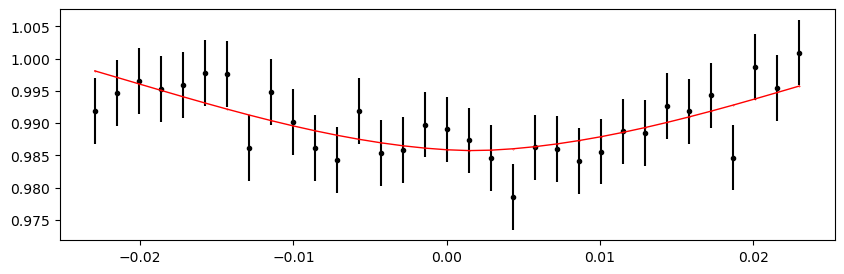

2032.3225504999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.89it/s]


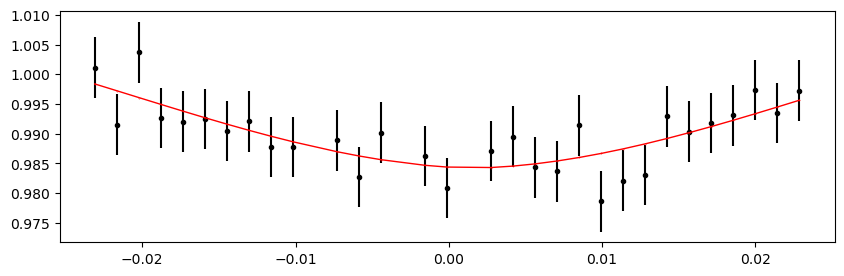

2033.2893494999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.49it/s]


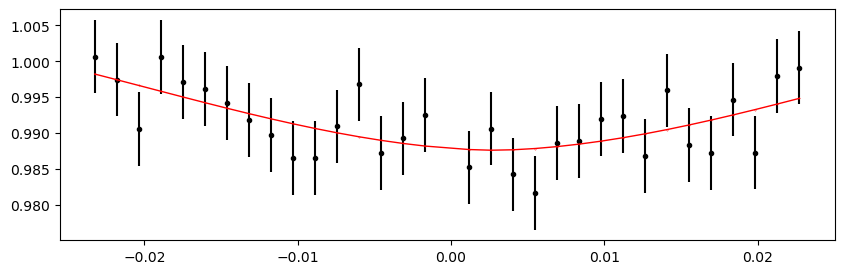

2034.2561484999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.66it/s]


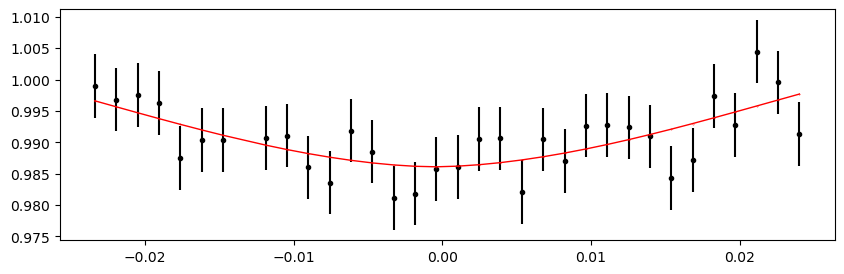

2391.0049794999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.25it/s]


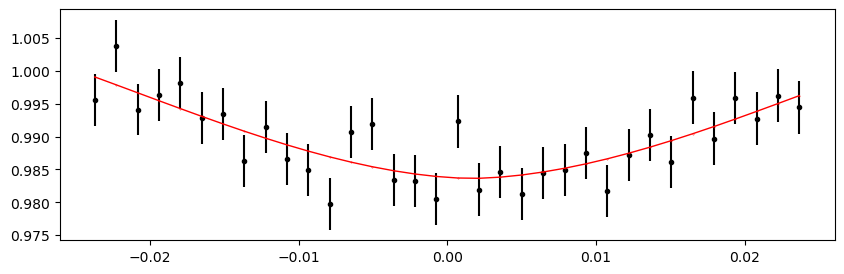

2391.9717785 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.53it/s]


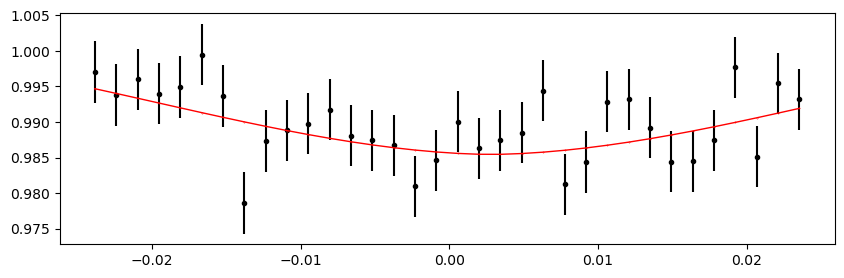

2392.9385774999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.14it/s]


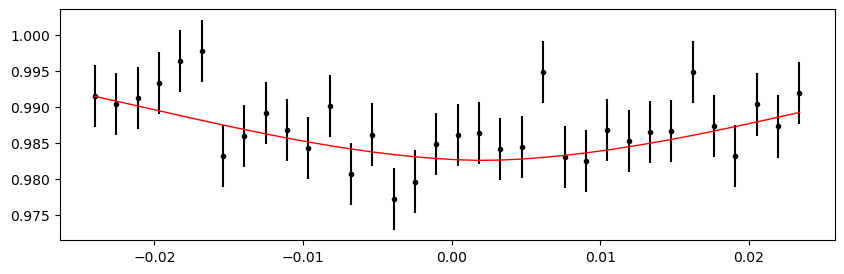

2393.9053765 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.49it/s]


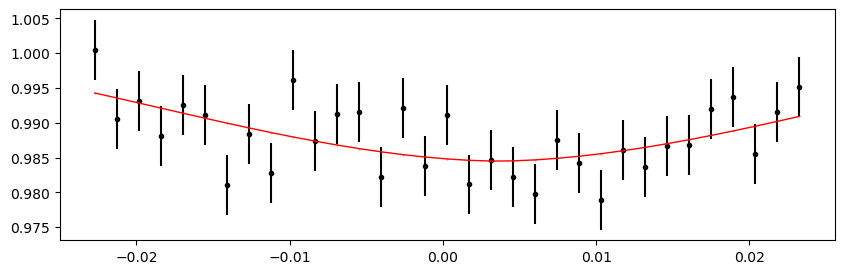

2394.8721754999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.88it/s]


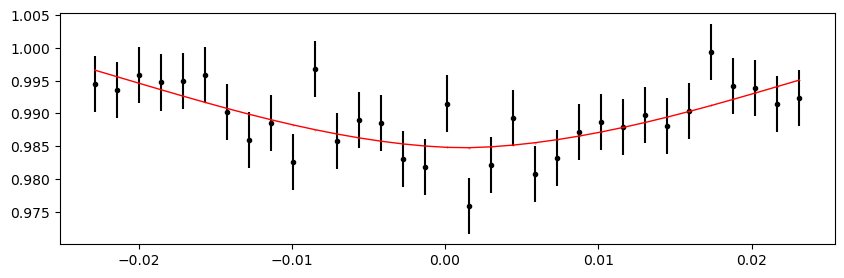

2395.8389744999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.86it/s]


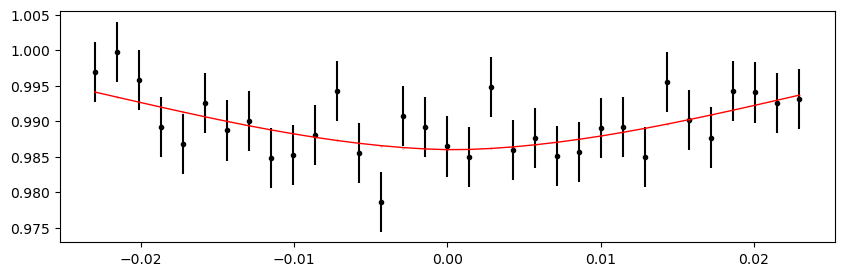

2396.8057734999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.75it/s]


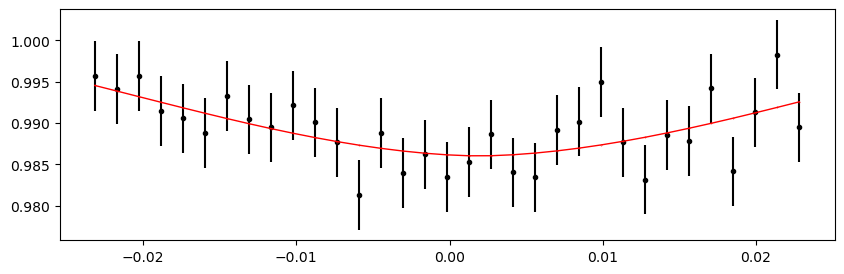

2397.7725724999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.92it/s]


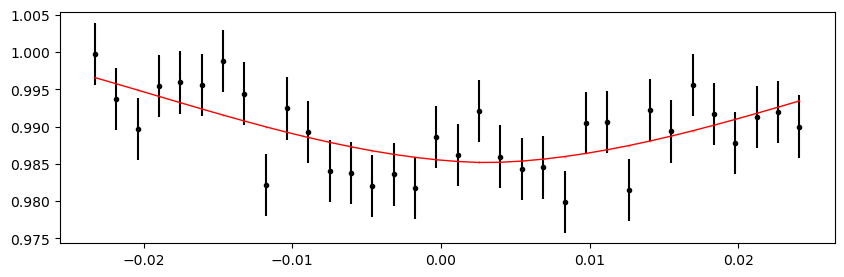

2398.7393715 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.44it/s]


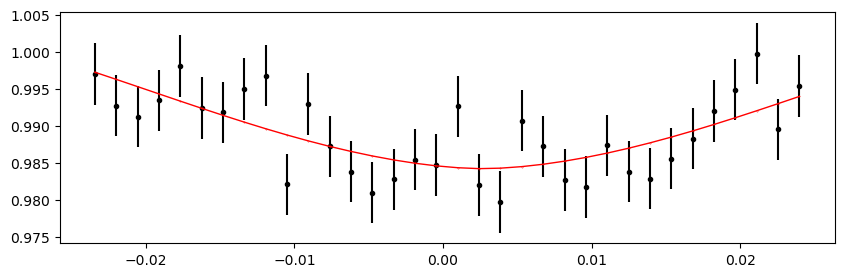

2399.7061704999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.12it/s]


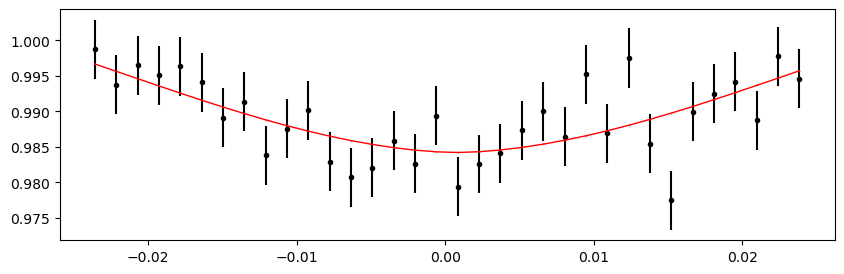

2400.6729695 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.75it/s]


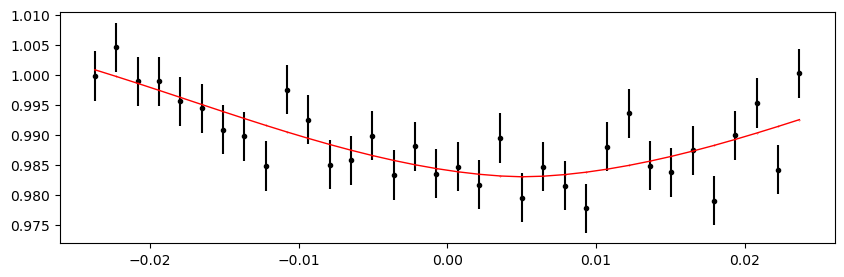

2401.6397684999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 245.33it/s]


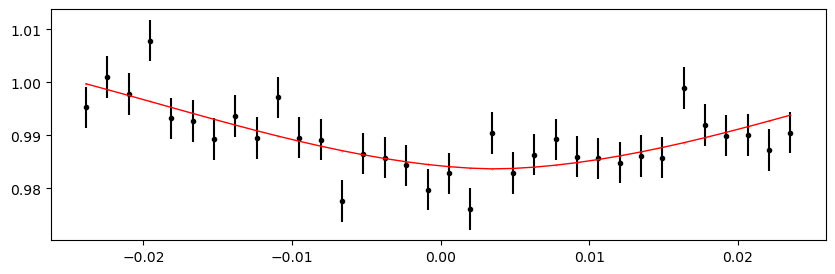

2402.6065675 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 316.15it/s]


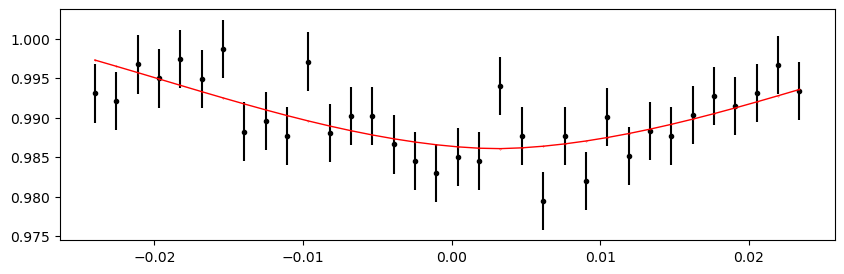

2403.5733665 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.36it/s]


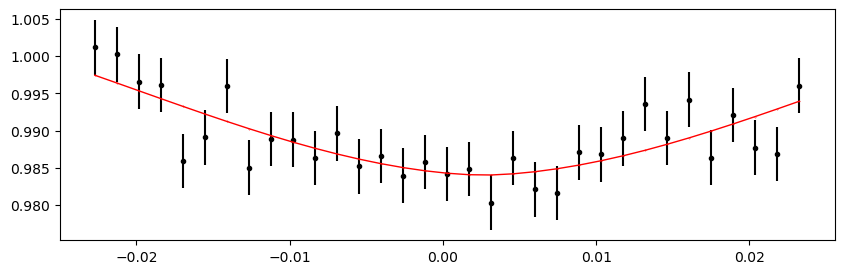

2405.5069645 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.52it/s]


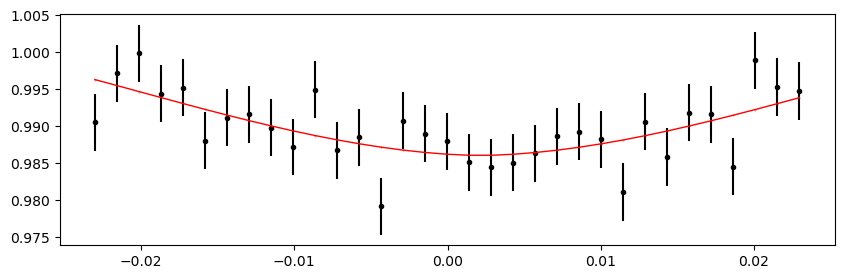

2406.4737634999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.72it/s]


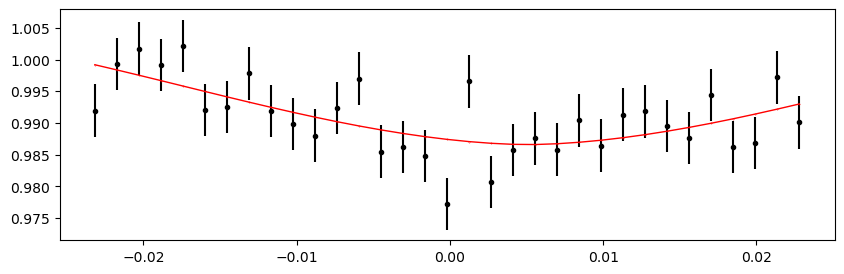

2407.4405625 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.62it/s]


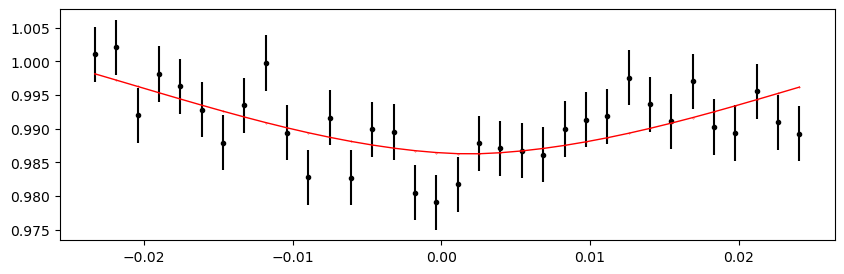

2408.4073614999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.16it/s]


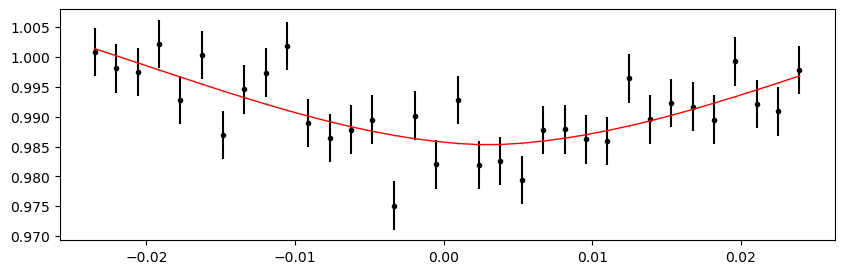

2409.3741604999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 357.98it/s]


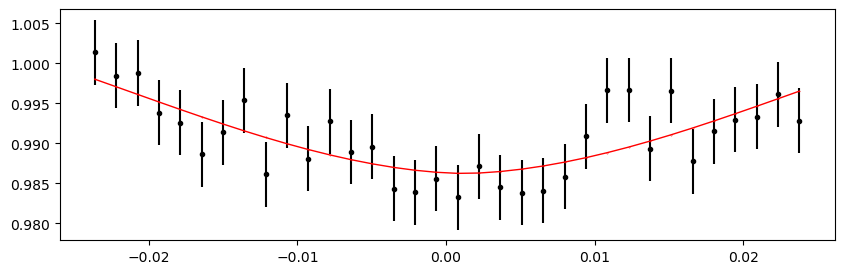

2410.3409595 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.22it/s]


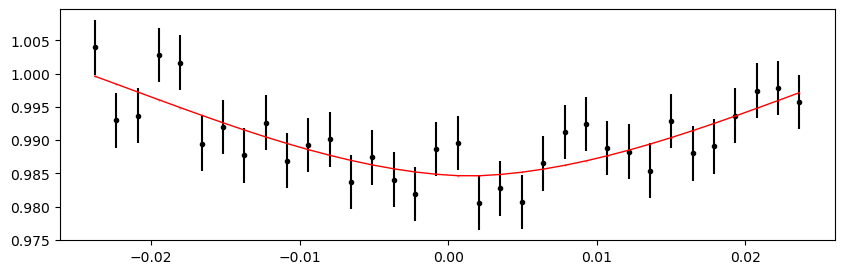

2411.3077584999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.14it/s]


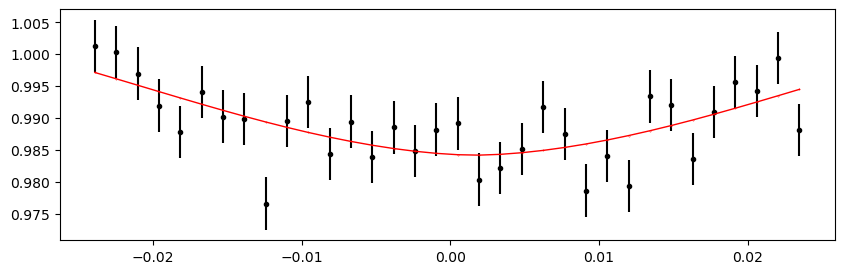

2412.2745575 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 357.13it/s]


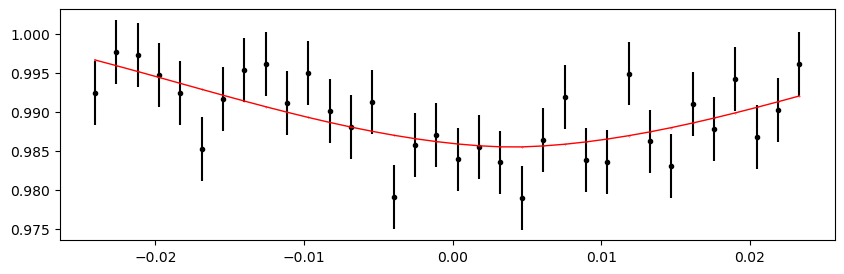

2413.2413564999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.59it/s]


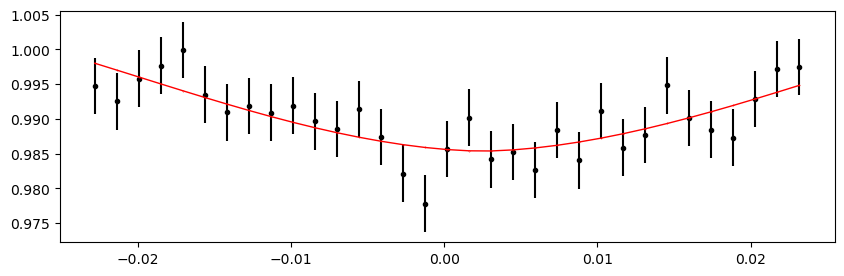

2414.2081554999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.78it/s]


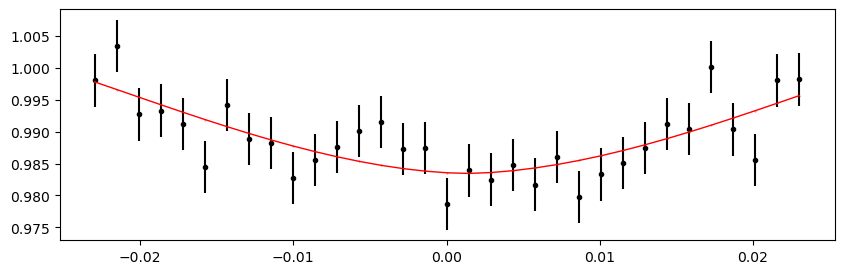

2415.1749545 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.97it/s]


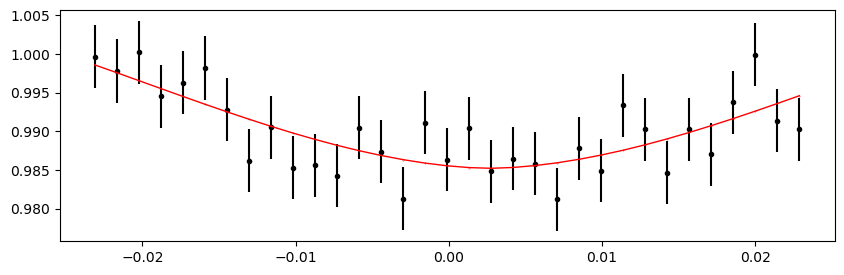

2416.1417534999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 420.32it/s]


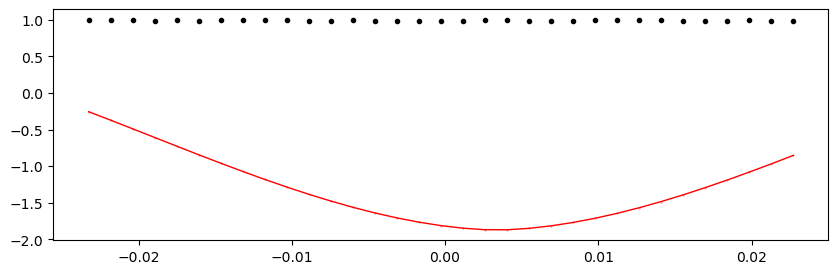

2417.1085525 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 273.37it/s]


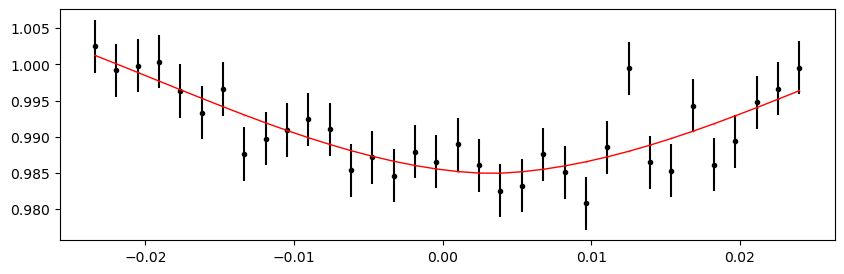

2418.0753514999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.09it/s]


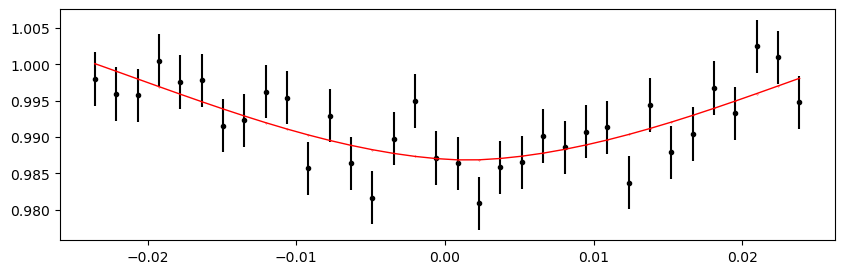

2718.7498404999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.00it/s]


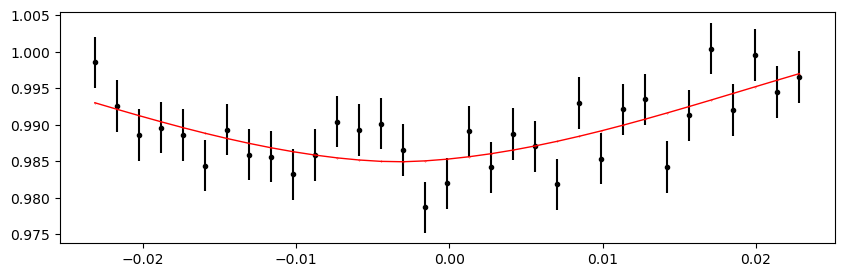

2722.6170365 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:42<00:00, 237.10it/s]


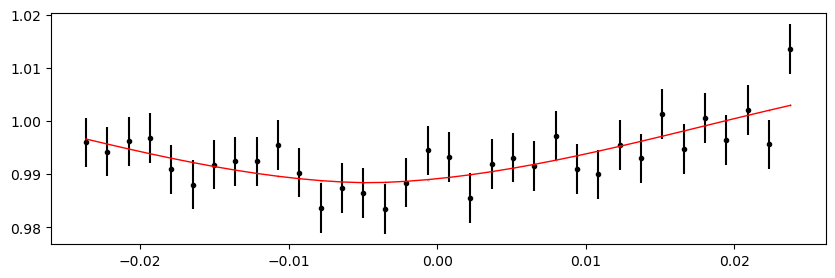

2723.5838354999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.53it/s]


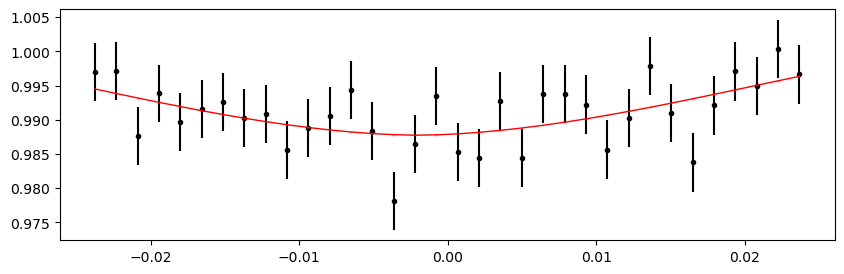

2724.5506345 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.92it/s]


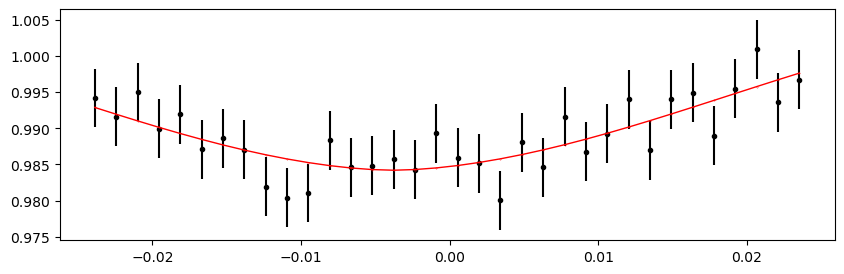

2725.5174334999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.11it/s]


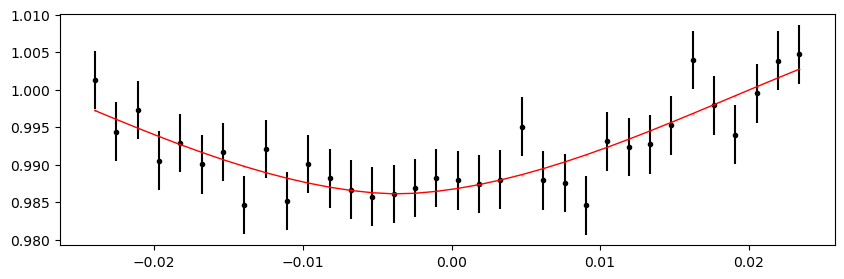

2726.4842325 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.03it/s]


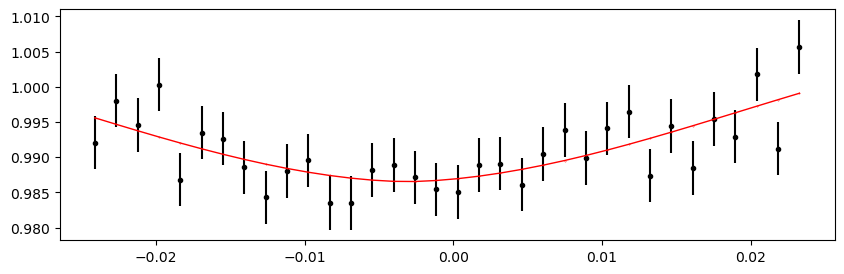

2727.4510314999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.33it/s]


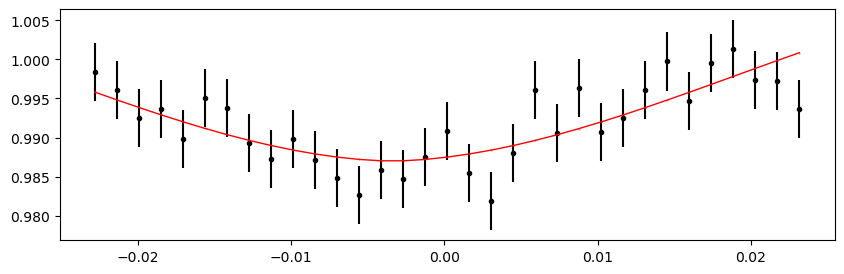

2728.4178304999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.35it/s]


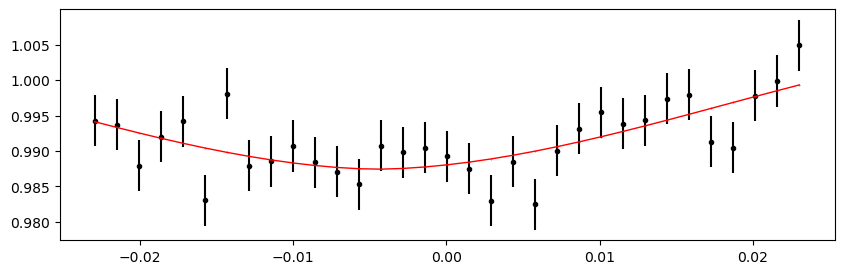

2729.3846295 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.44it/s]


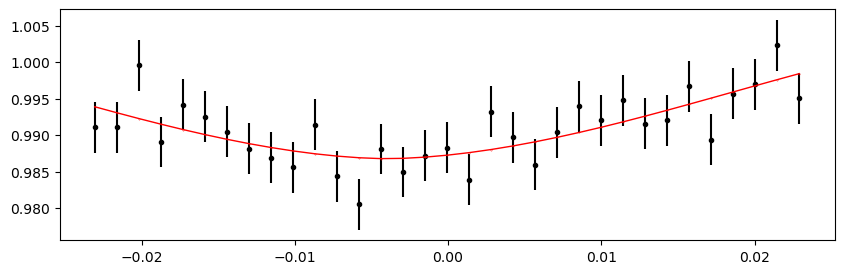

2735.1854234999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.27it/s]


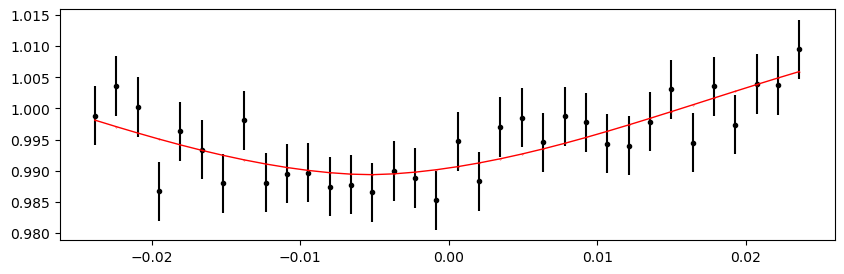

2736.1522225 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 358.84it/s]


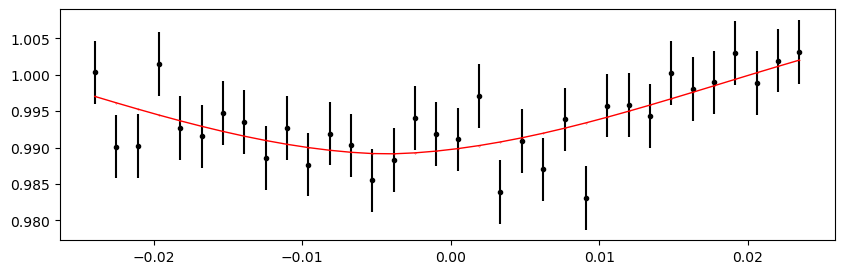

2737.1190214999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.49it/s]


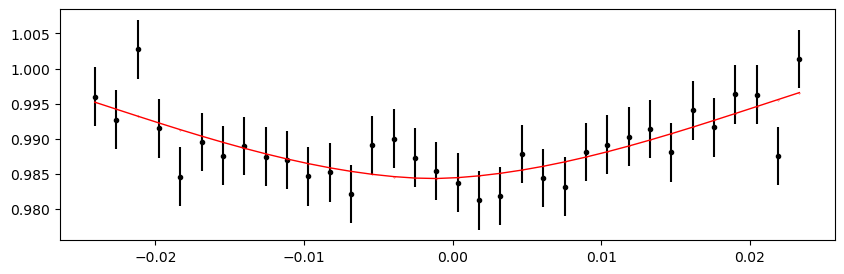

2738.0858204999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.21it/s]


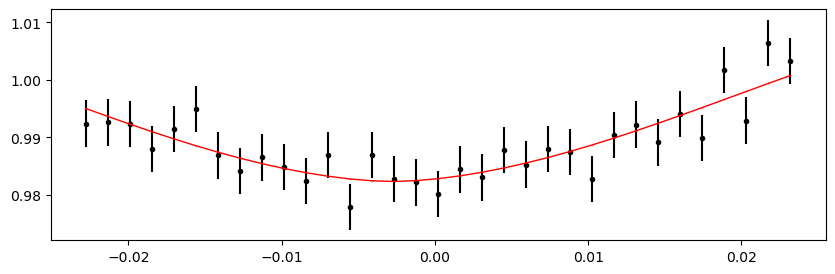

2739.0526194999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.07it/s]


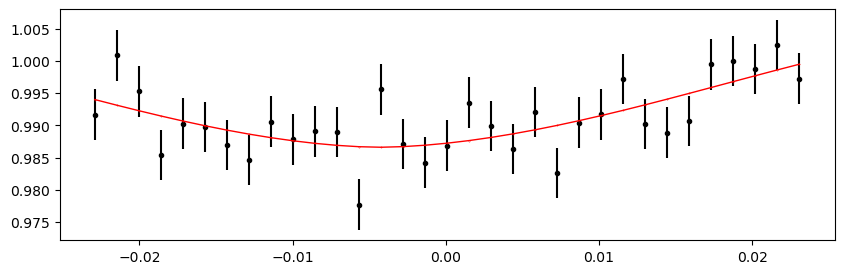

2740.0194184999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.42it/s]


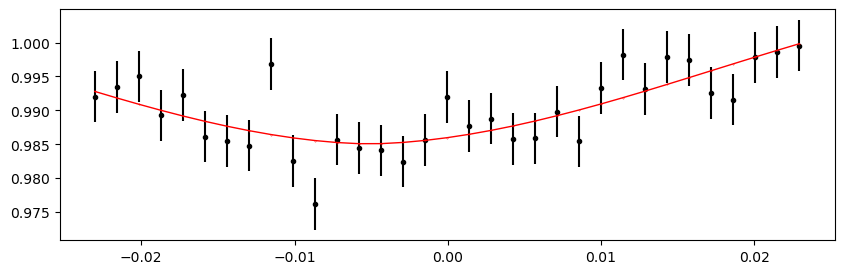

2740.9862175 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 404.22it/s]


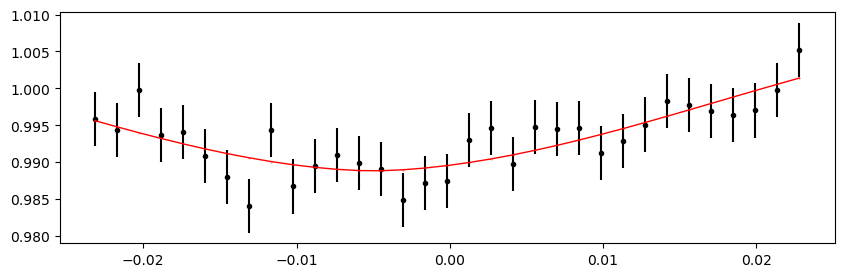

2741.9530164999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.02it/s]


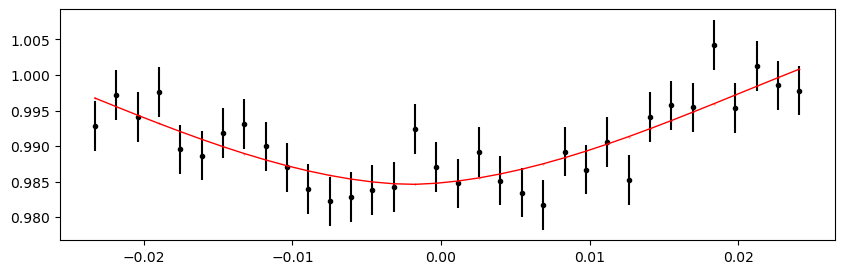

2742.9198154999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.76it/s]


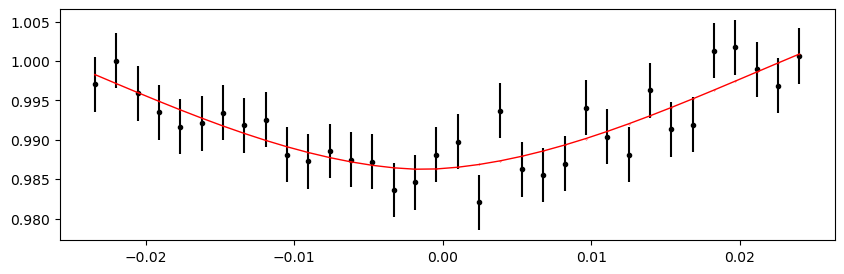

2744.8534135 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.05it/s]


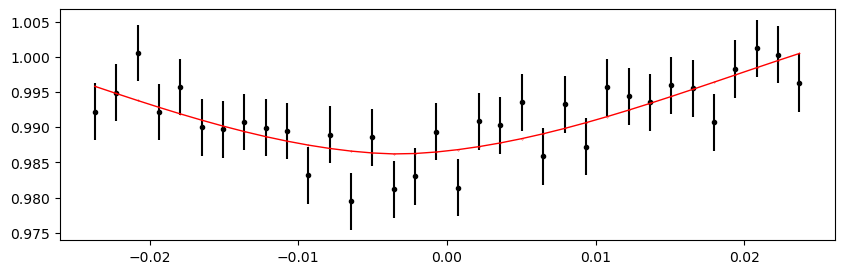

2745.8202125 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.48it/s]


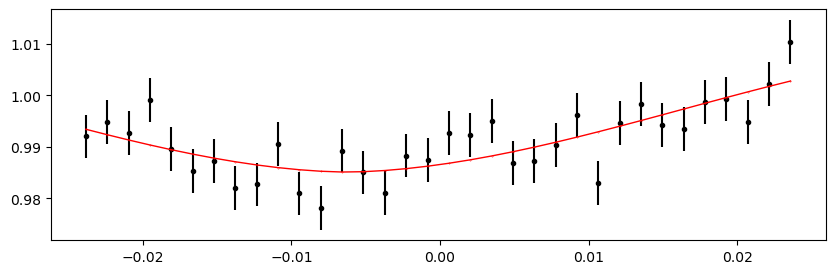

2746.7870114999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.55it/s]


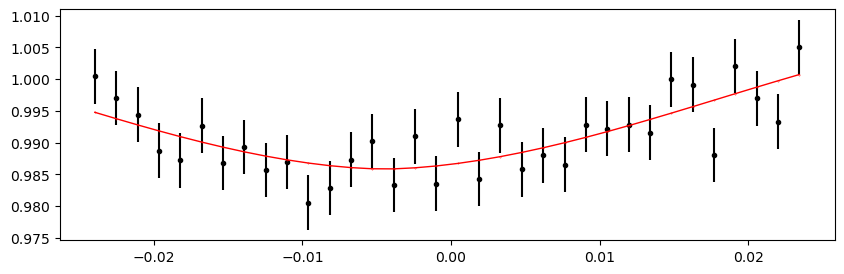

2747.7538105 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.32it/s]


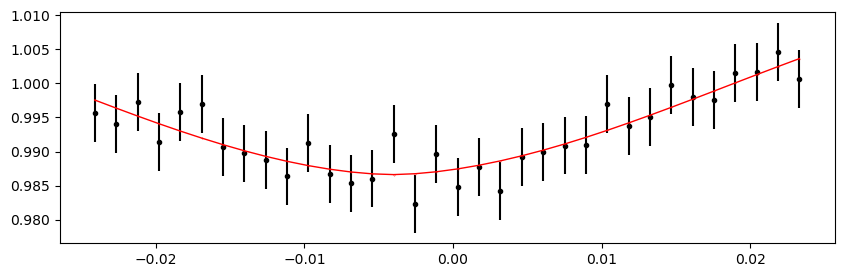

2748.7206094999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.45it/s]


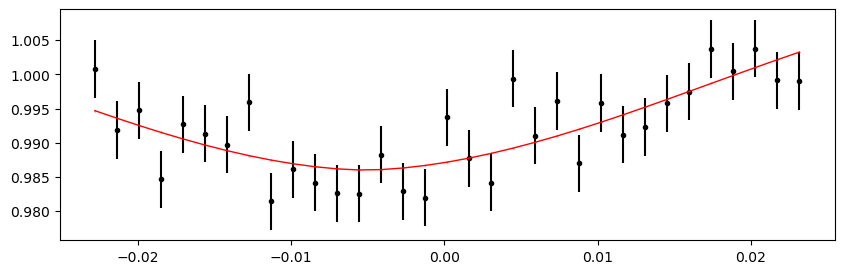

2749.6874085 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.88it/s]


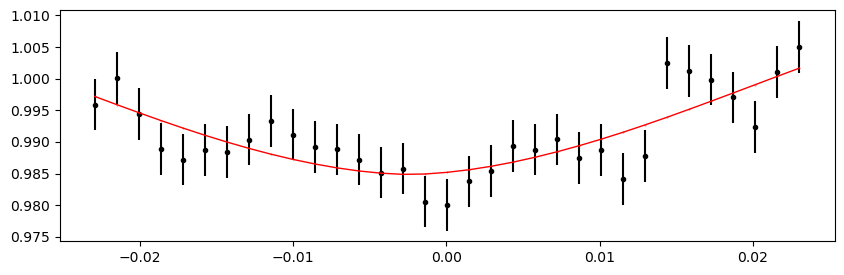

2750.6542074999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.09it/s]


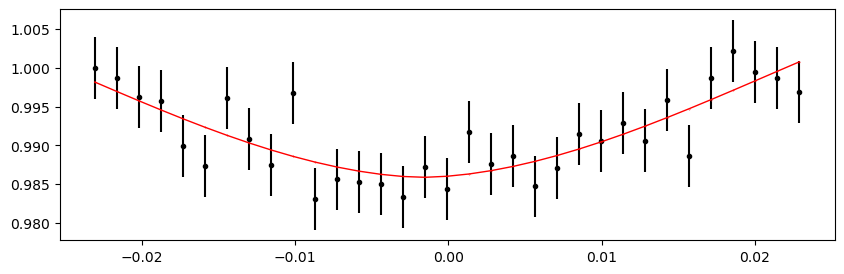

2751.6210064999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.31it/s]


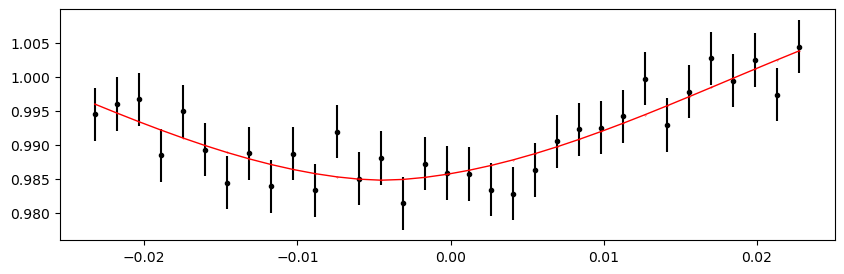

2752.5878055 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.26it/s]


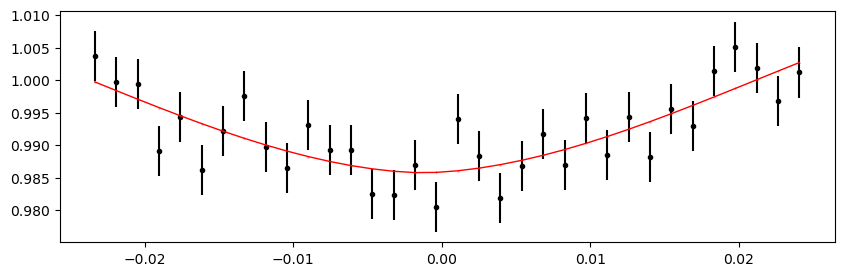

2753.5546044999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.11it/s]


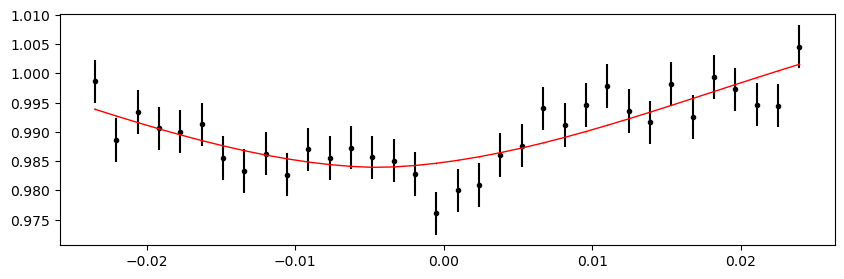

2754.5214035 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.60it/s]


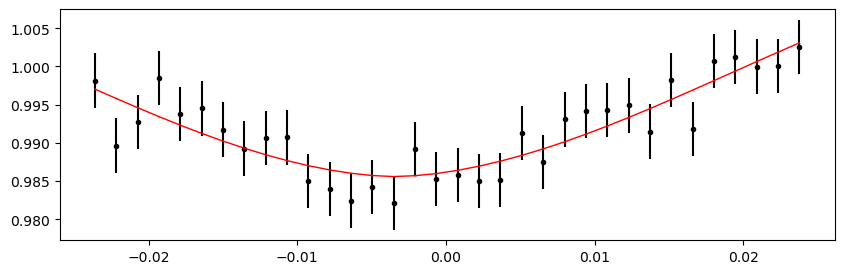

2755.4882024999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.83it/s]


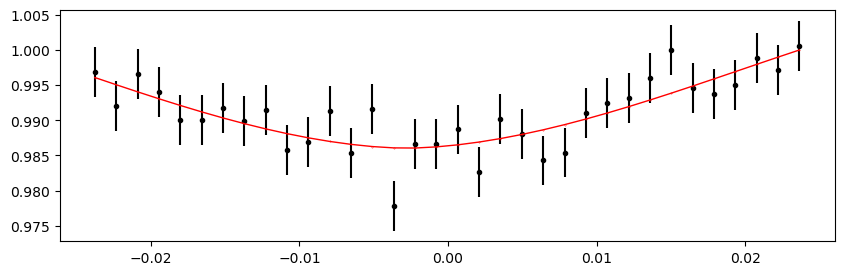

2757.4218005 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.47it/s]


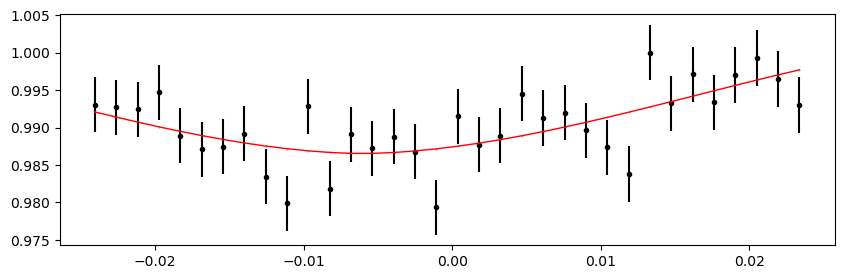

2758.3885994999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.57it/s]


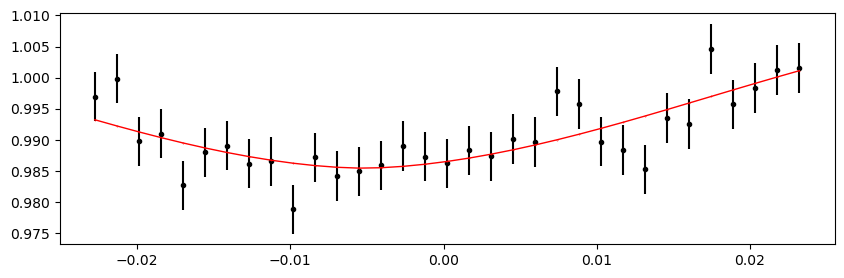

2759.3553985 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.28it/s]


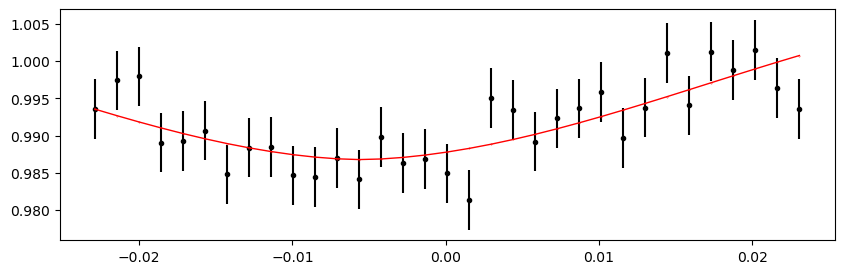

2760.3221974999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 328.73it/s]


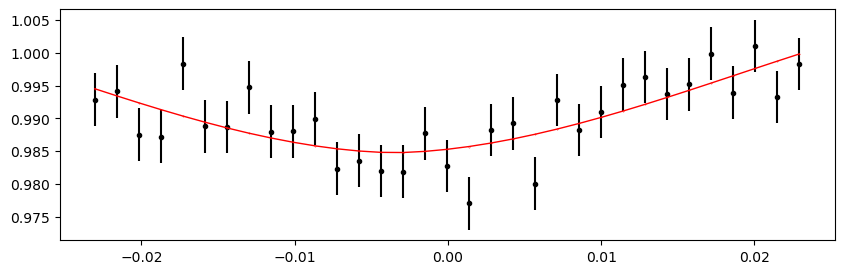

2761.2889964999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.98it/s]


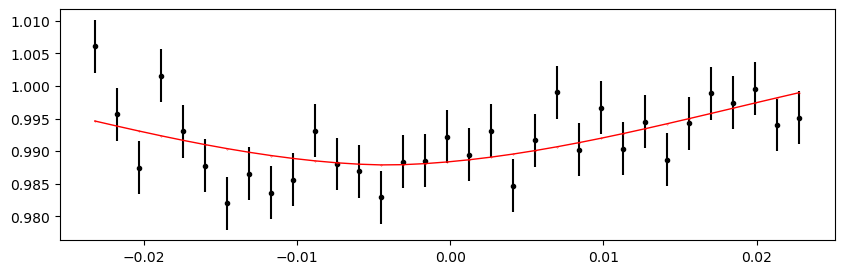

2762.2557954999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.60it/s]


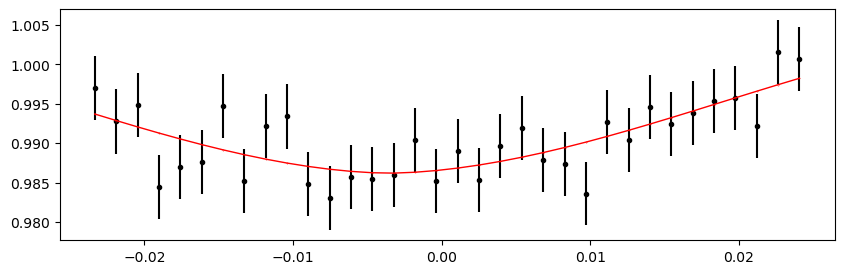

2763.2225945 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.96it/s]


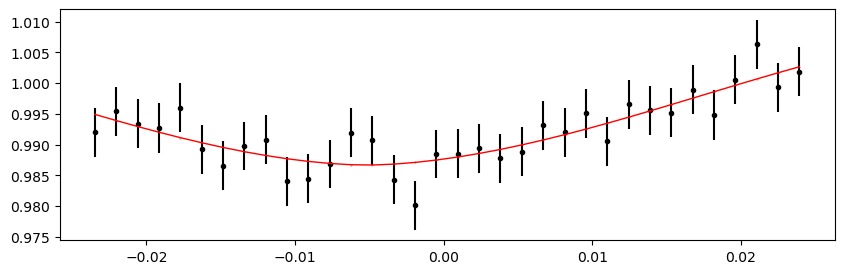

2764.1893935 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.82it/s]


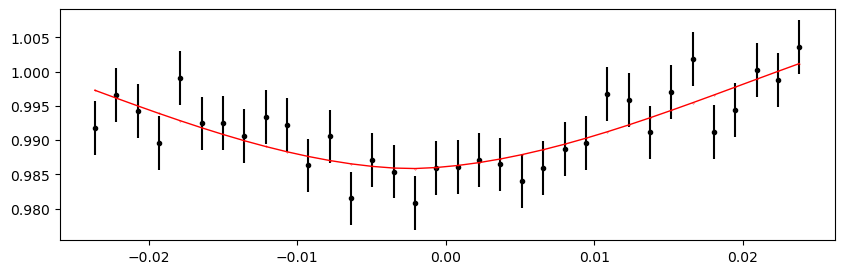

2765.1561924999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.74it/s]


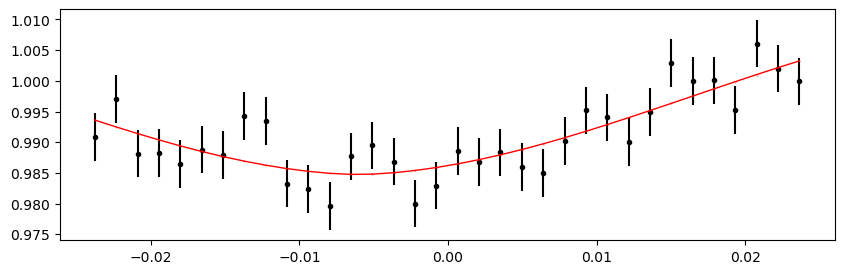

2766.1229915 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.06it/s]


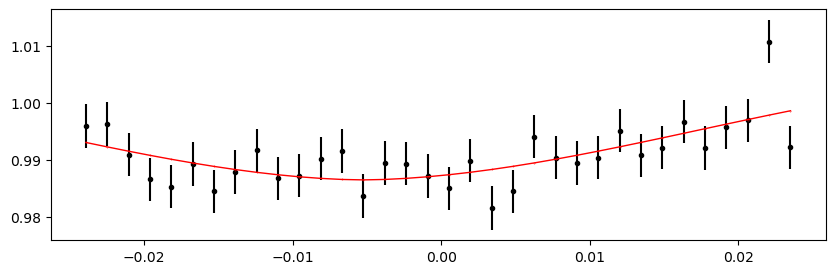

2767.0897904999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.79it/s]


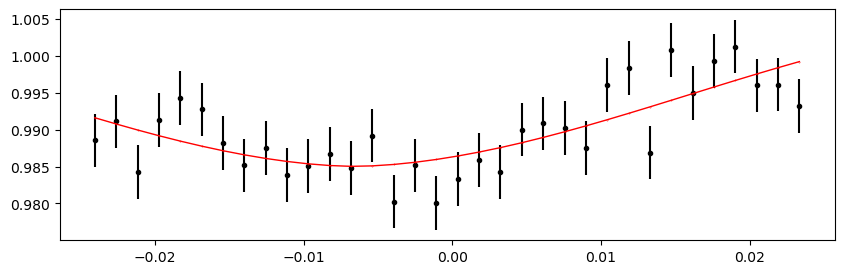

2768.0565895 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.16it/s]


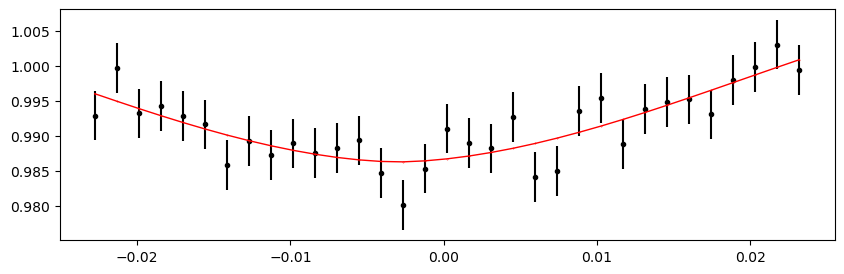

2769.9901874999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.36it/s]


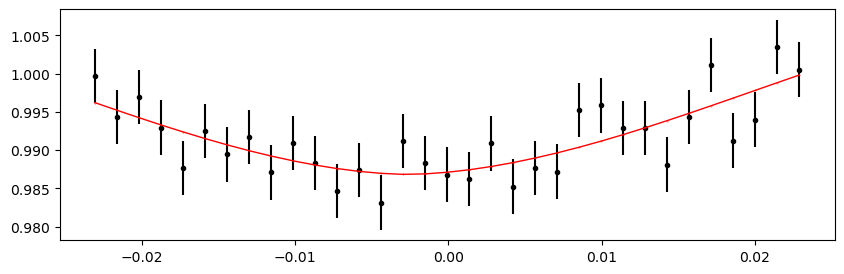

2770.9569865 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.57it/s]


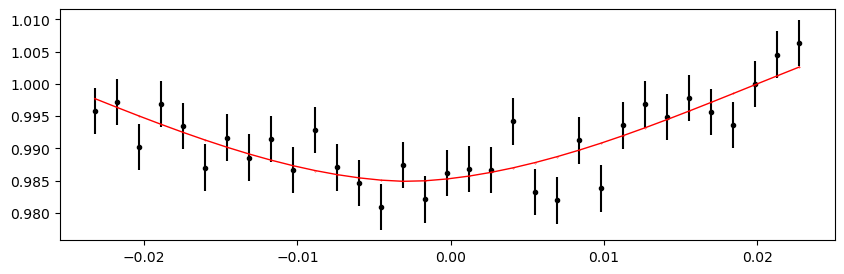

2771.9237854999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.55it/s]


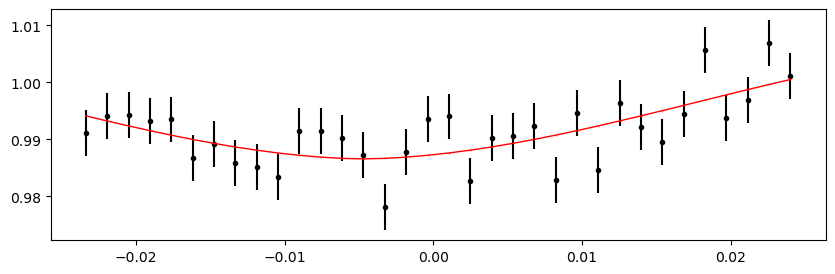

2772.8905845 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.27it/s]


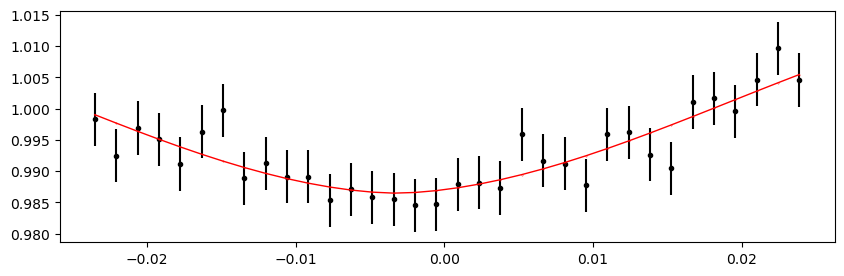

2773.8573834999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.87it/s]


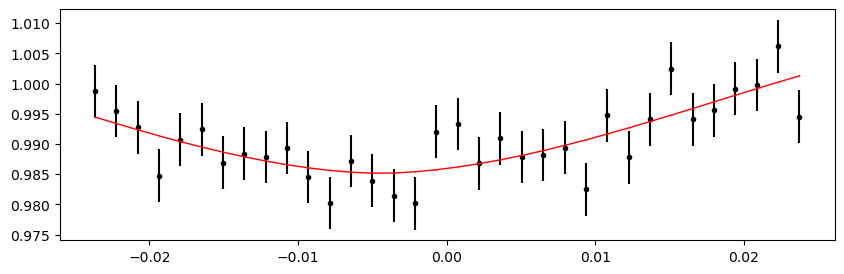

2774.8241824999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.16it/s]


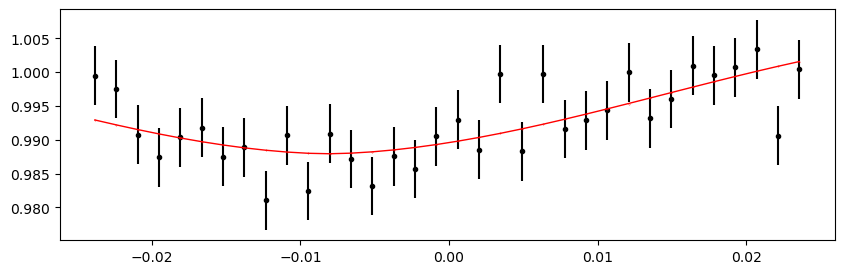

2775.7909815 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.00it/s]


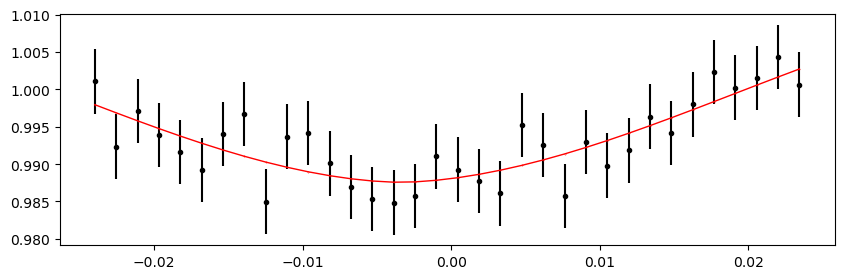

2776.7577804999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.52it/s]


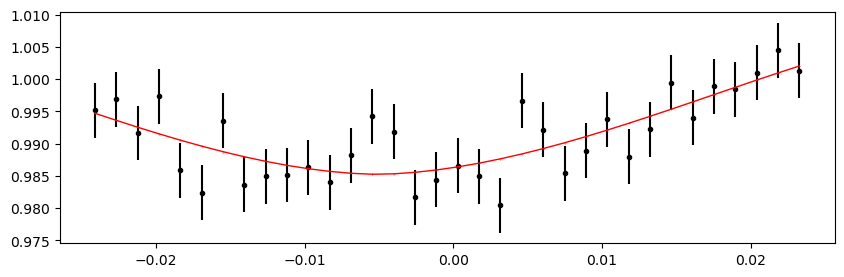

2777.7245795 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 324.59it/s]


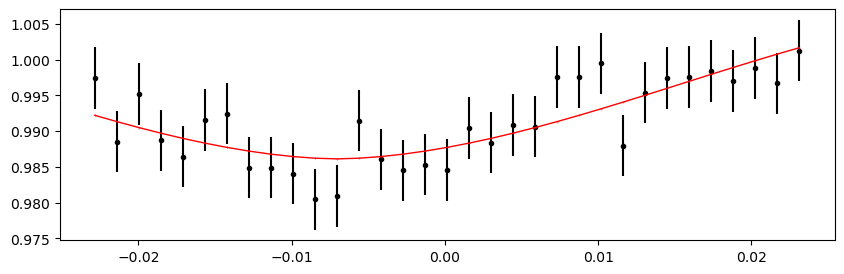

2778.6913784999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 332.13it/s]


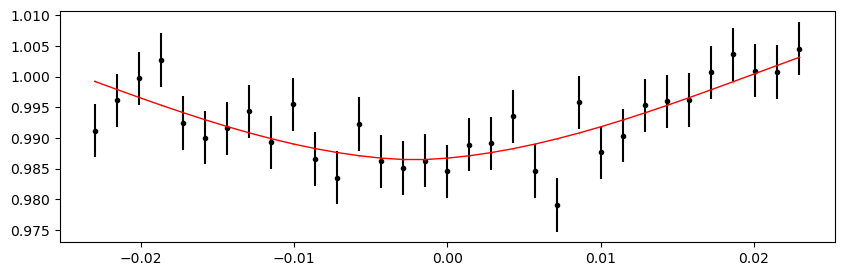

2779.6581774999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 457.51it/s]


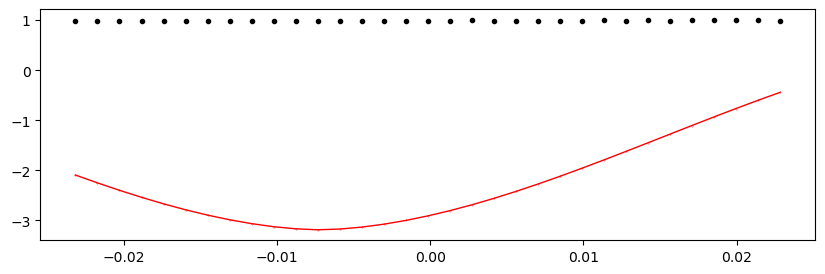

2780.6249765 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.10it/s]


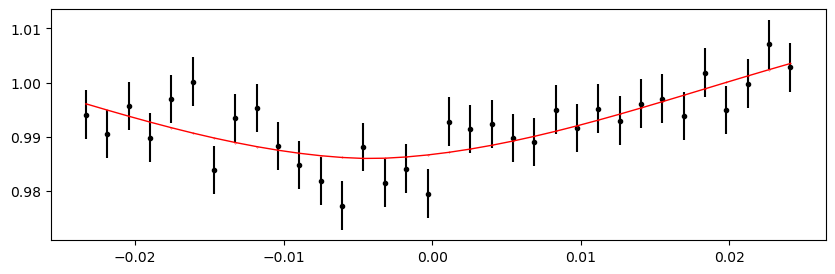

2781.5917754999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.03it/s]


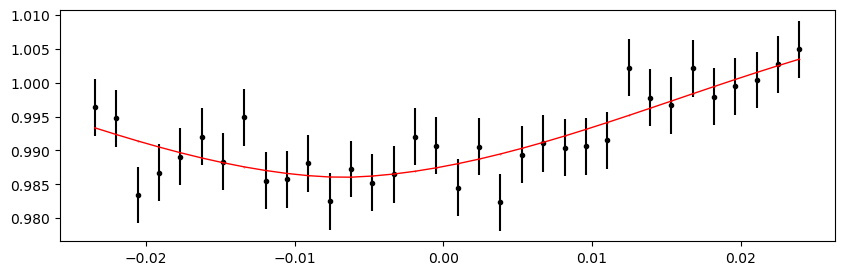

Time 2783.5253734999997 does not have enough data points: 12
2784.4921724999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.84it/s]


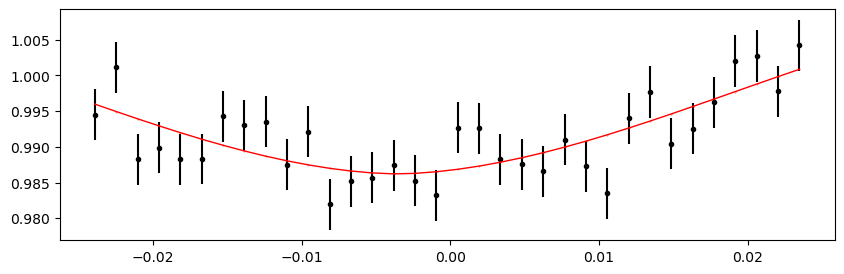

2785.4589714999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.67it/s]


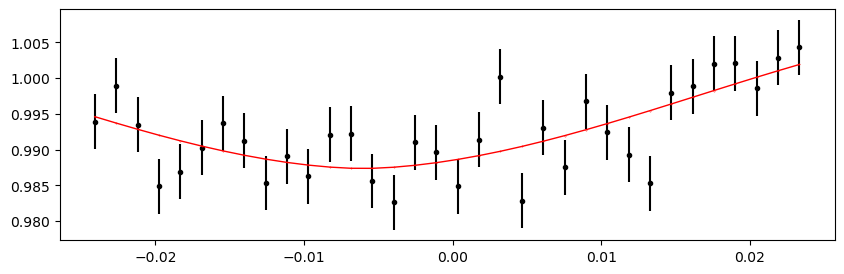

2786.4257705 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.96it/s]


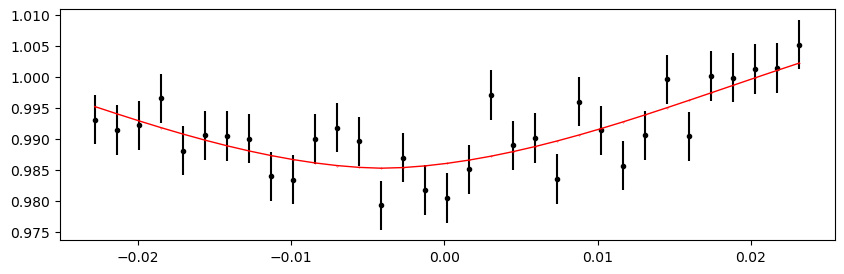

2787.3925695 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.31it/s]


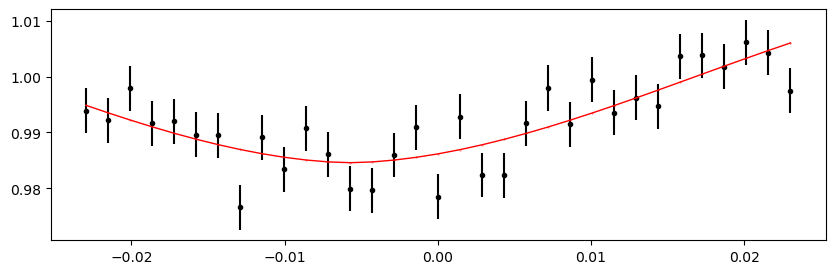

2788.3593684999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.82it/s]


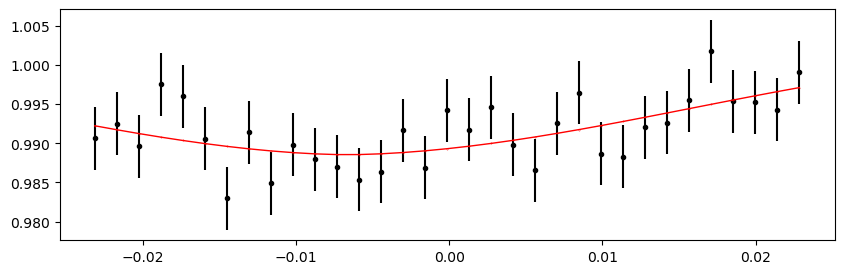

2789.3261675 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.50it/s]


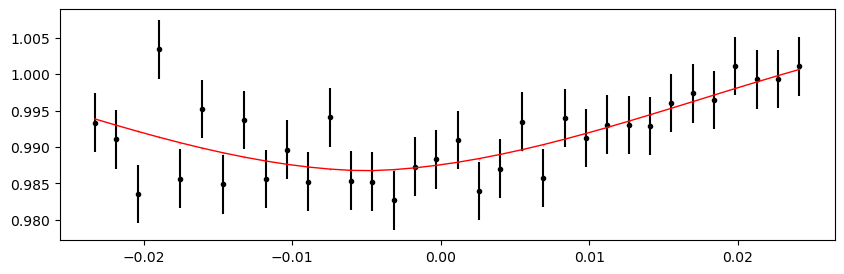

2790.2929664999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.68it/s]


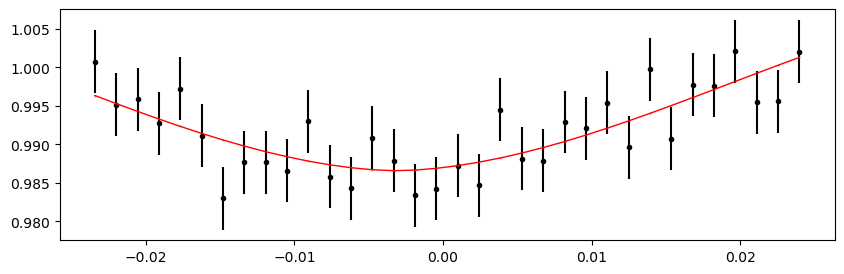

2791.2597655 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 318.49it/s]


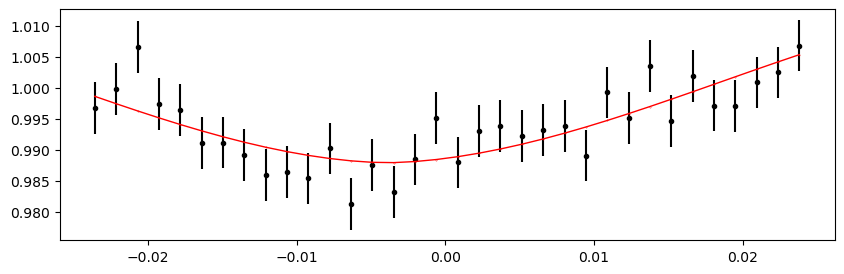

2792.2265644999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 251.49it/s]


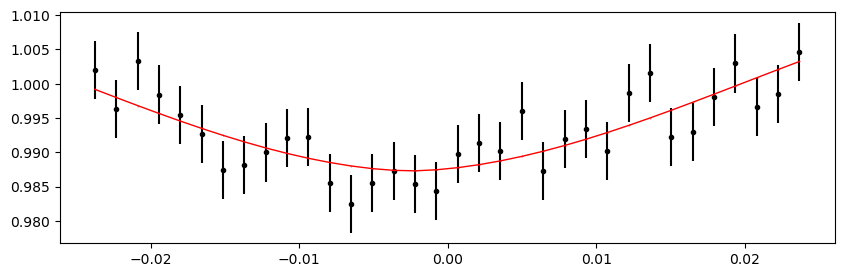

2793.1933634999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.69it/s]


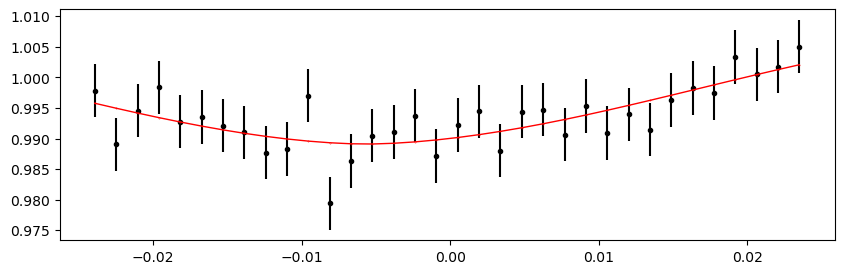

2794.1601625 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.43it/s]


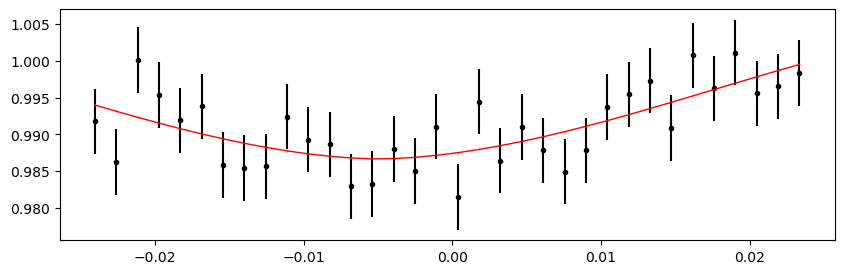

2795.1269614999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.23it/s]


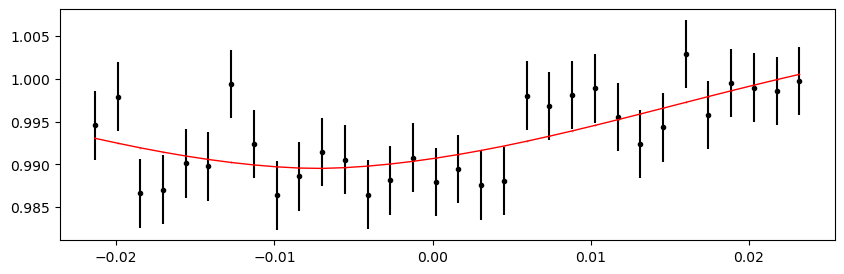

2796.0937605 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.53it/s]


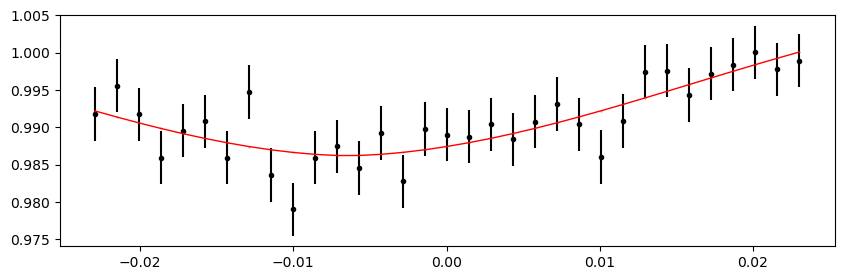

3313.3312254999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.86it/s]


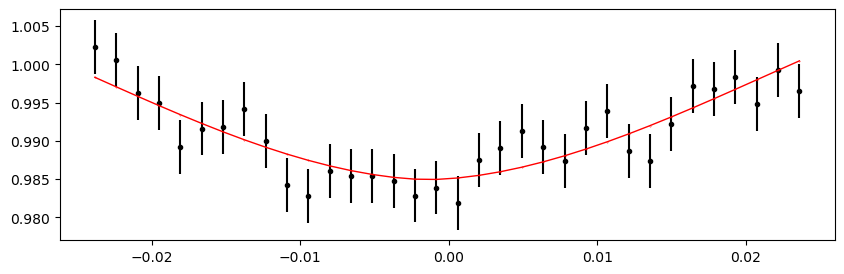

Time 3315.2648234999997 does not have enough data points: 3
3316.2316224999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.92it/s]


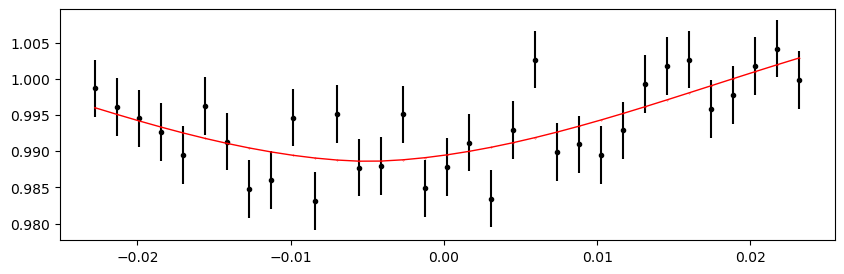

3317.1984214999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.42it/s]


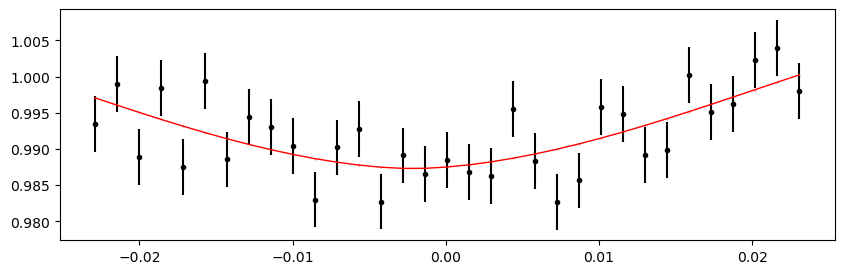

3318.1652205 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.20it/s]


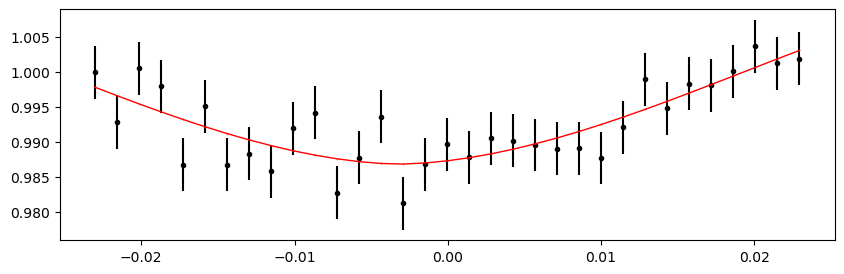

3319.1320195 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.98it/s]


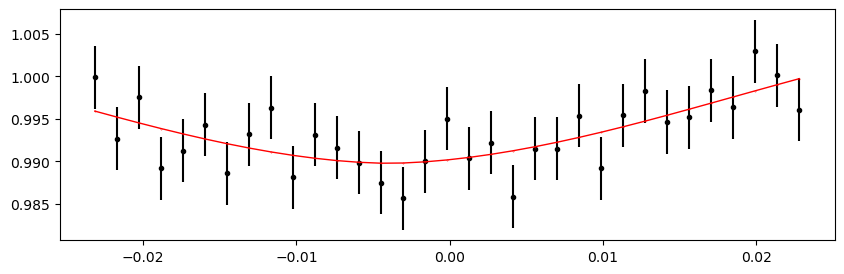

3320.0988184999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.47it/s]


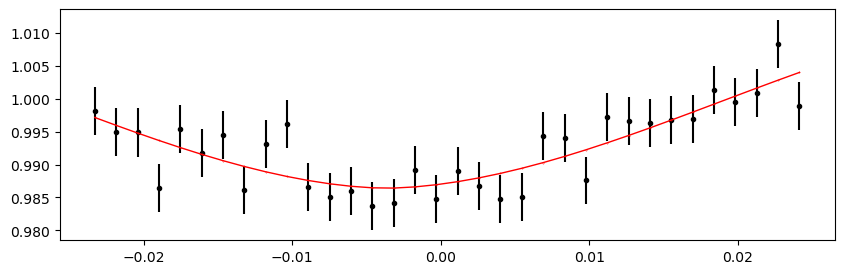

3321.0656174999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.19it/s]


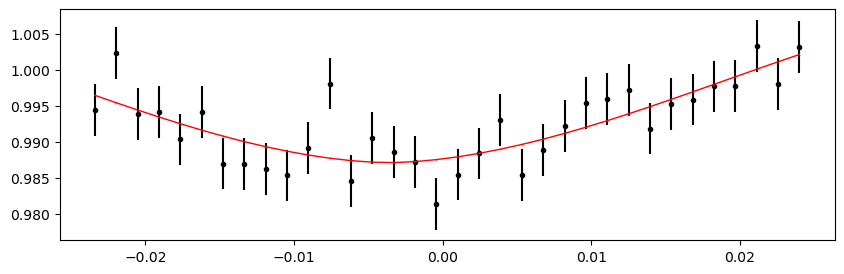

3322.0324164999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.36it/s]


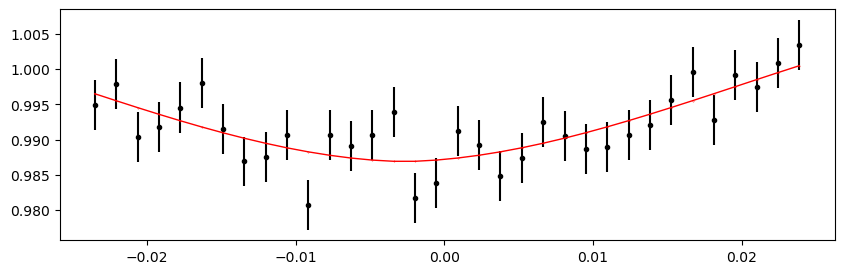

3322.9992155 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.03it/s]


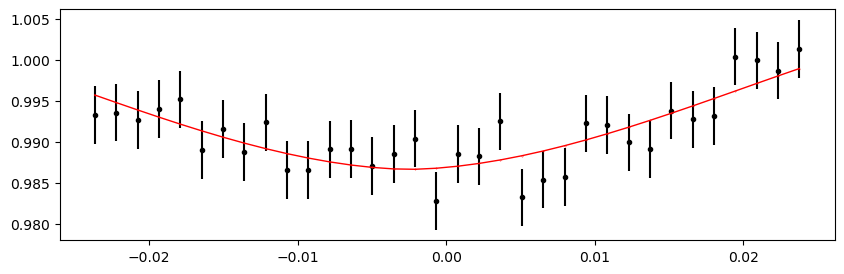

3323.9660145 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.48it/s]


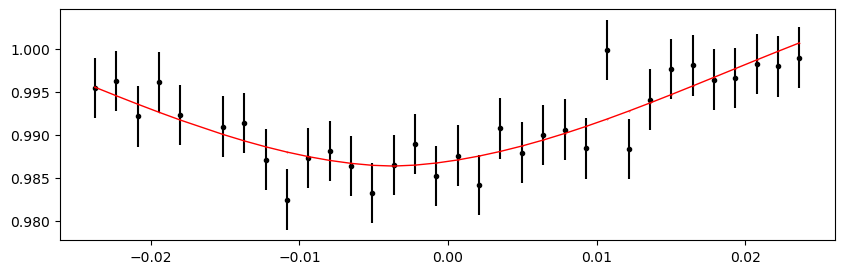

3324.9328134999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.01it/s]


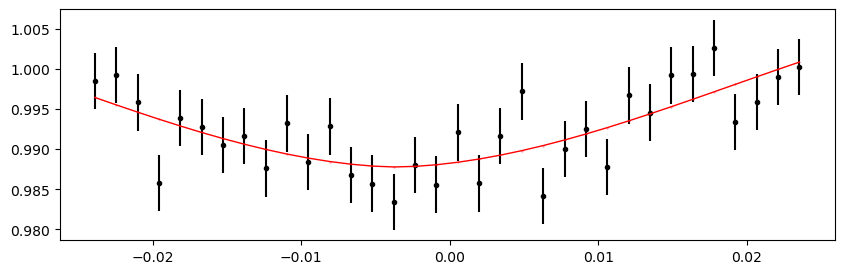

3326.8664114999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.82it/s]


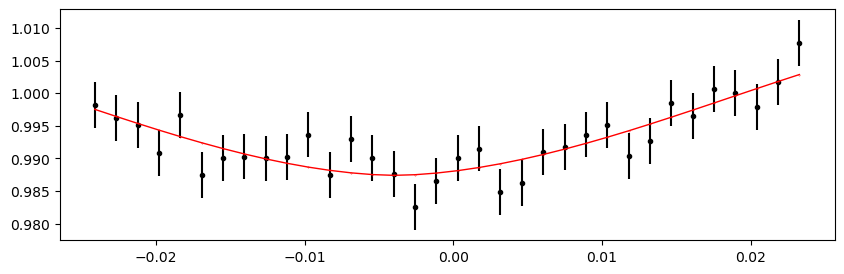

3329.7668084999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.48it/s]


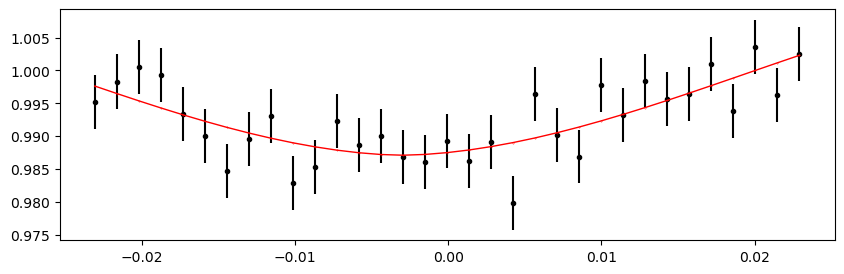

3330.7336074999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.17it/s]


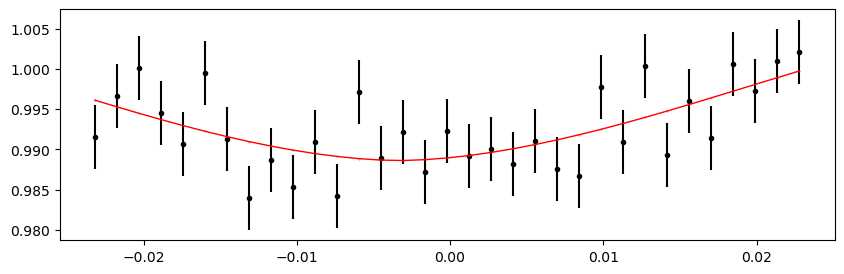

3331.7004064999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.39it/s]


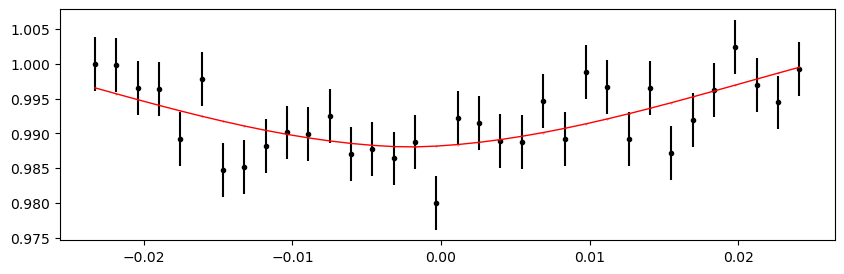

3332.6672055 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.62it/s]


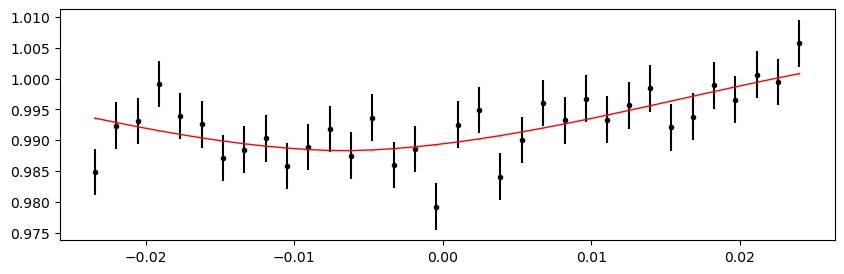

3333.6340044999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.40it/s]


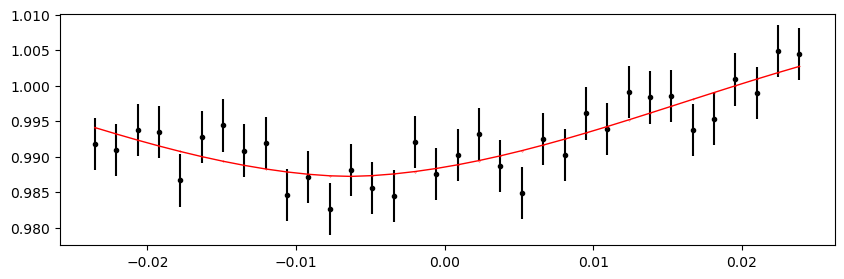

3334.6008034999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.38it/s]


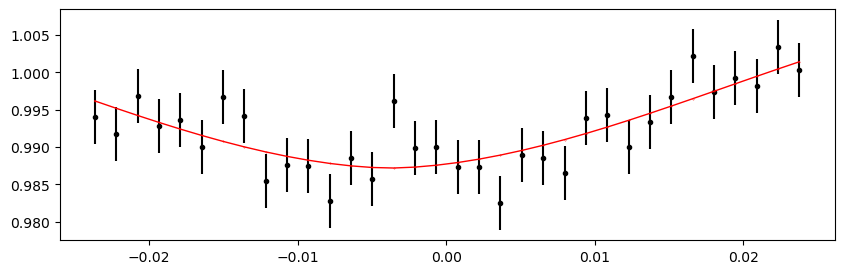

3335.5676025 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.25it/s]


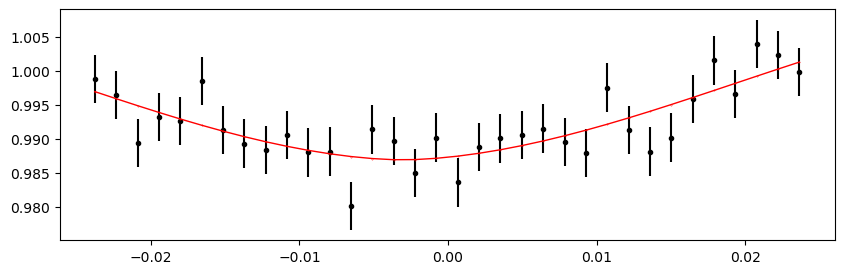

3336.5344014999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 331.80it/s]


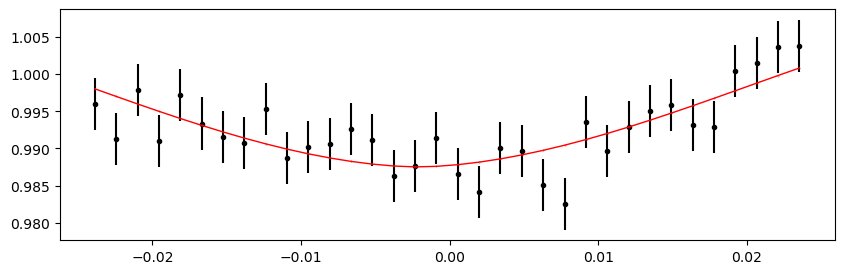

3337.5012005 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.41it/s]


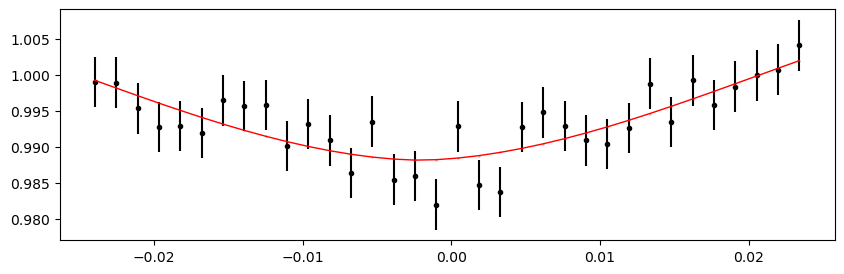

3338.4679994999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.78it/s]


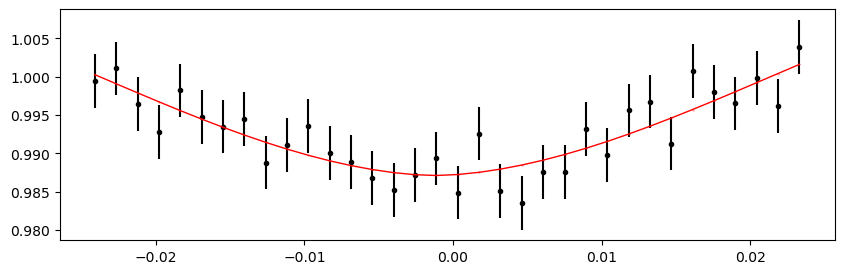

3339.4347984999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.44it/s]


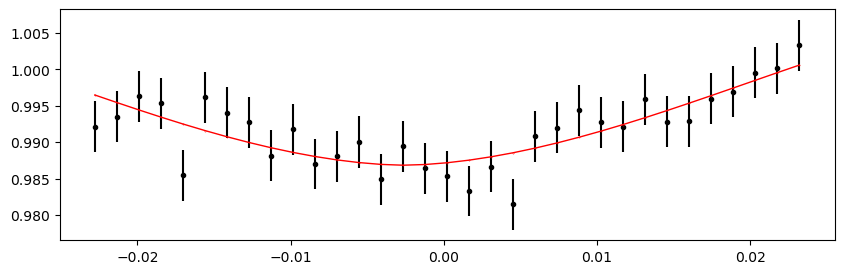

3452.5502815 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.31it/s]


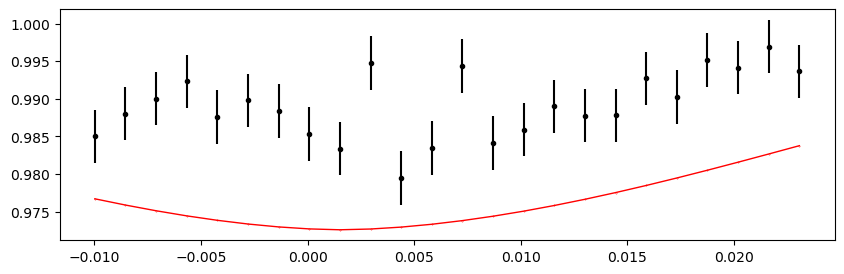

3453.5170805 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.06it/s]


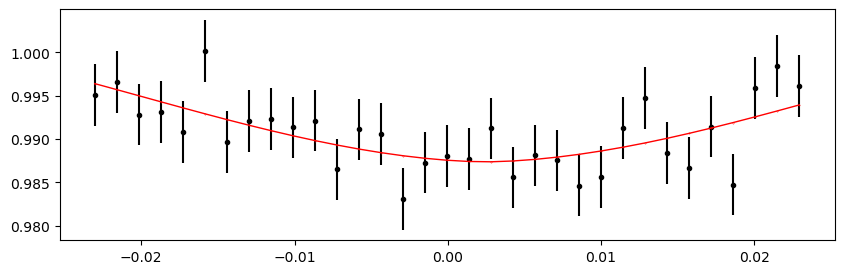

3454.4838794999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.19it/s]


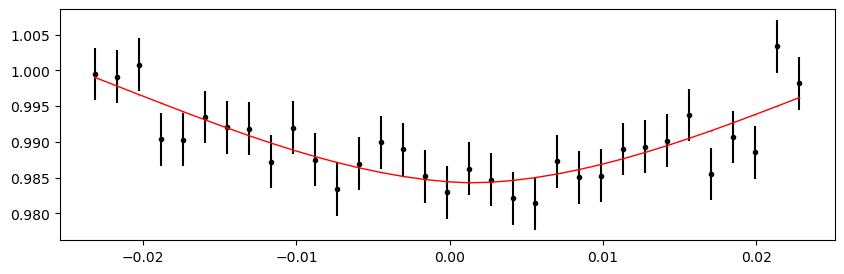

3455.4506784999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.09it/s]


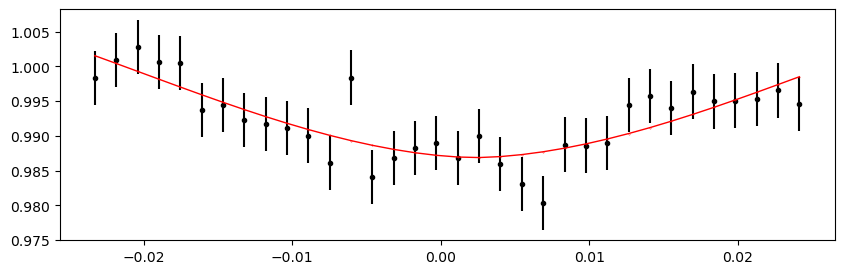

3456.4174774999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.15it/s]


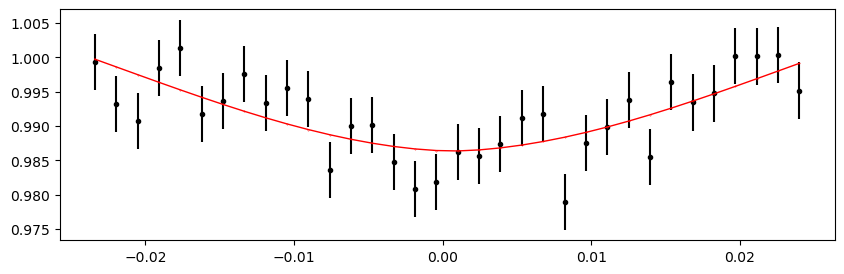

3457.3842765 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.89it/s]


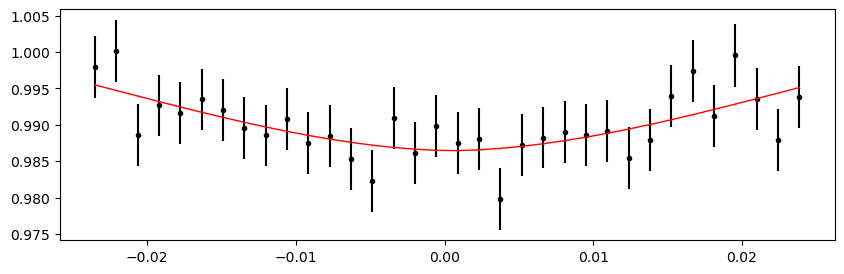

3458.3510754999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.23it/s]


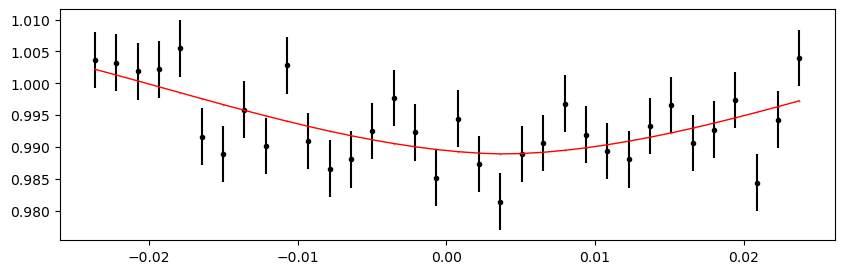

3460.2846734999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.31it/s]


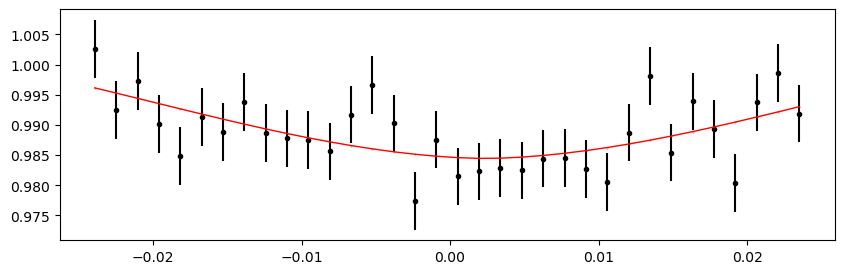

3461.2514724999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.80it/s]


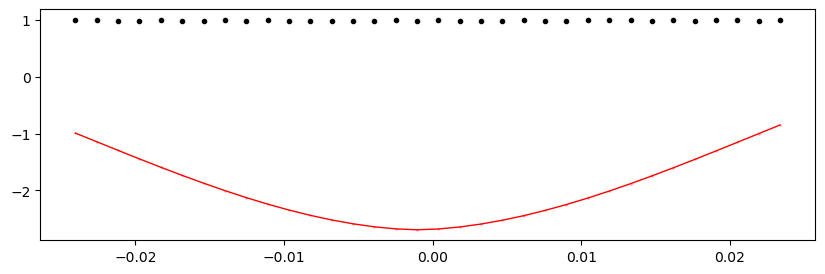

3462.2182715 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.97it/s]


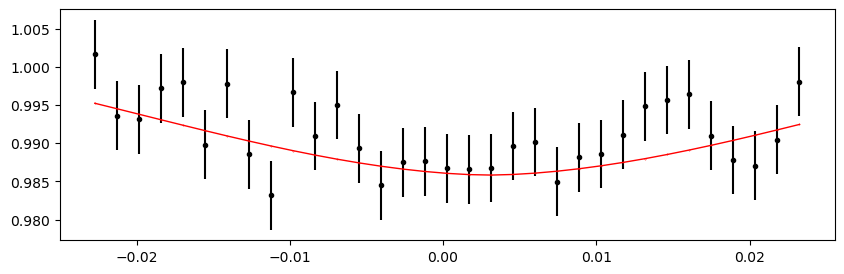

3463.1850704999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 344.85it/s]


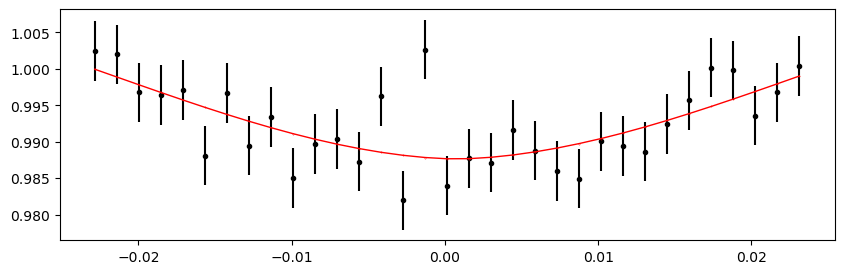

3464.1518694999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.42it/s]


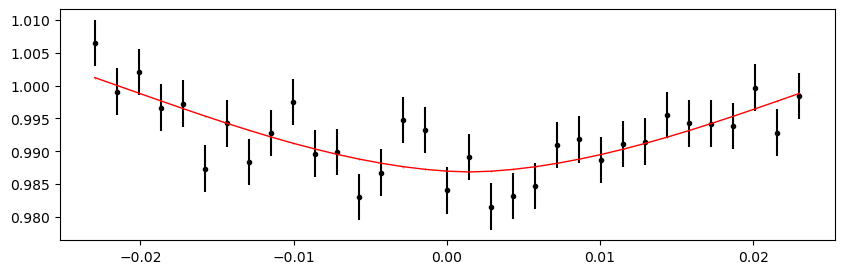

3465.1186685 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.77it/s]


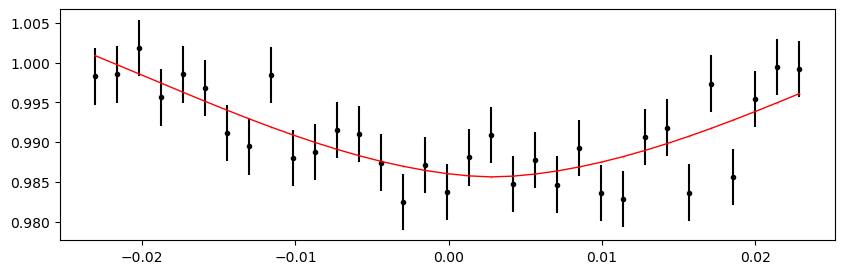

3466.0854674999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.36it/s]


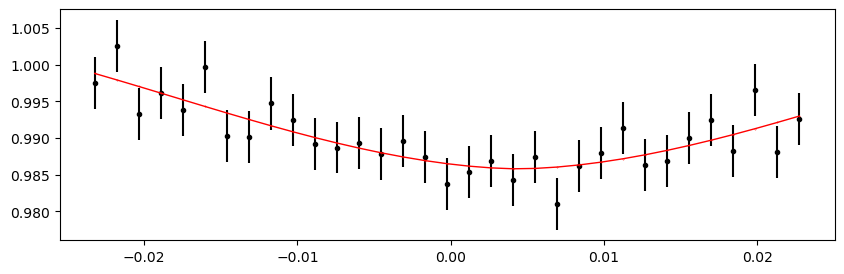

3467.0522665 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 333.42it/s]


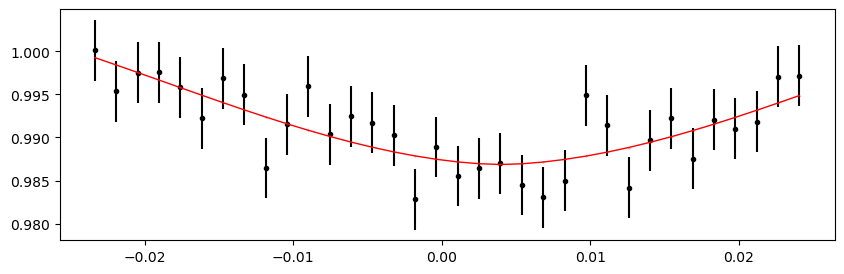

3468.0190654999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.08it/s]


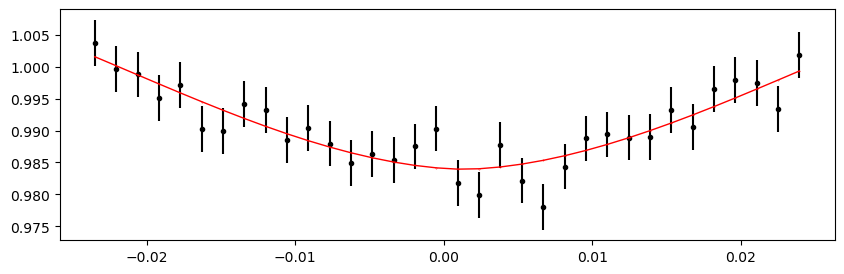

3468.9858644999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 353.08it/s]


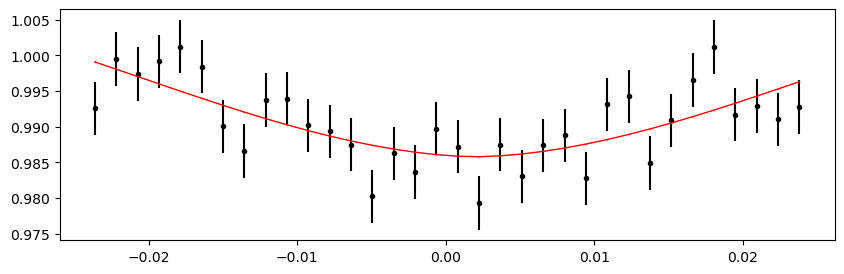

3469.9526634999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.46it/s]


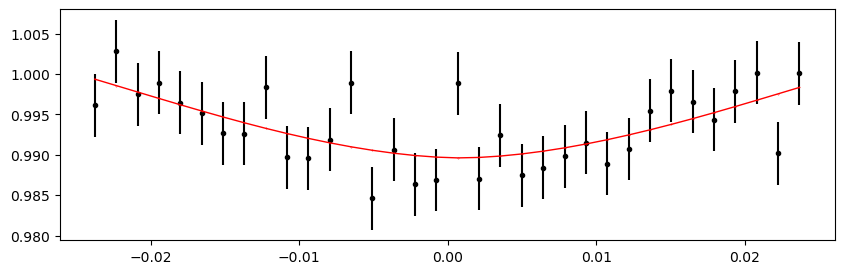

3470.9194625 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.38it/s]


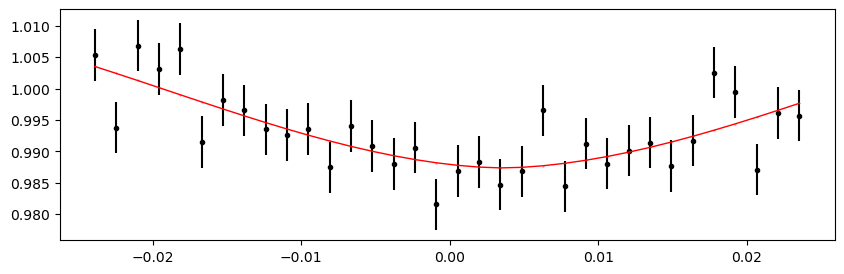

3471.8862615 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.99it/s]


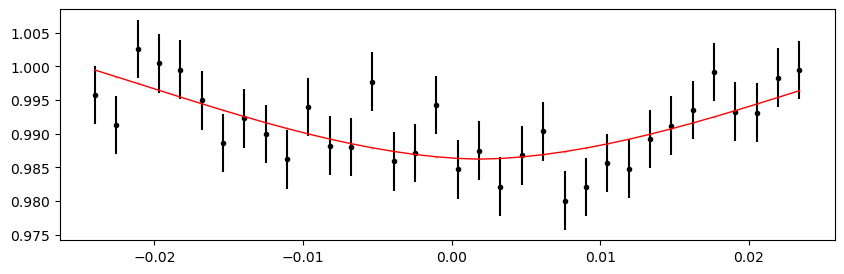

3472.8530604999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 307.12it/s]


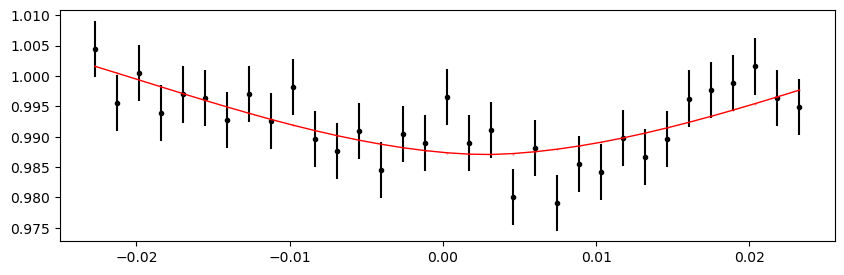

3473.8198594999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 412.94it/s]


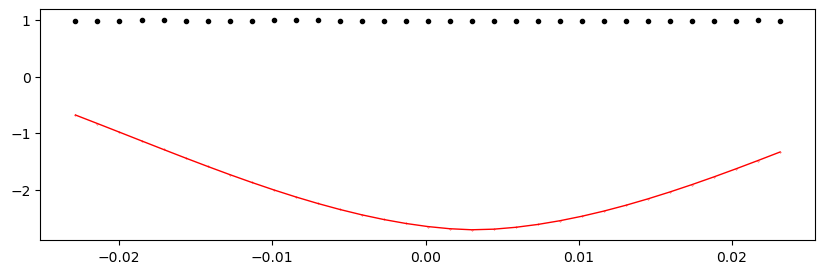

3474.7866584999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.42it/s]


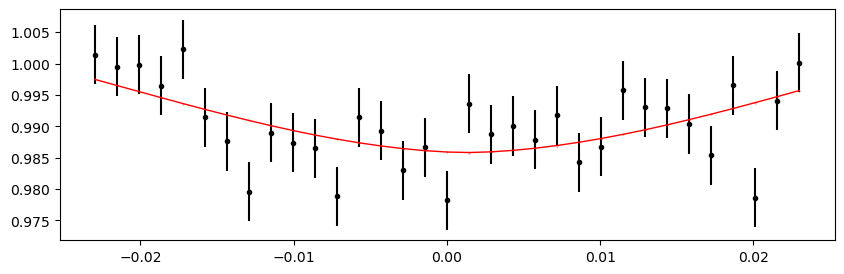

3475.7534575 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 340.80it/s]


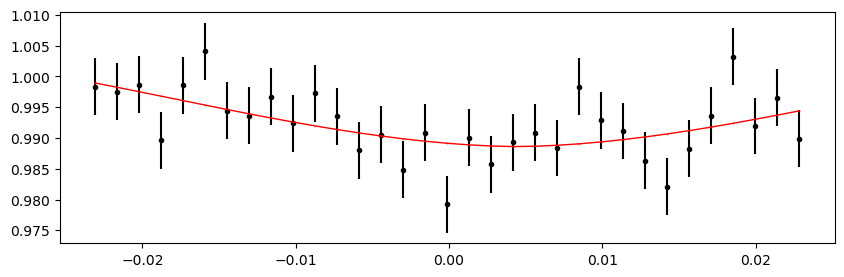

3476.7202565 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.12it/s]


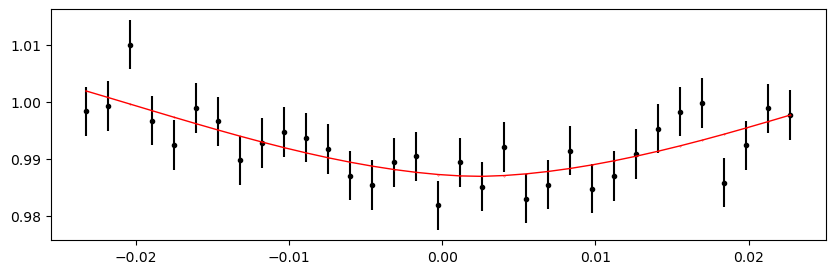

3477.6870554999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.11it/s]


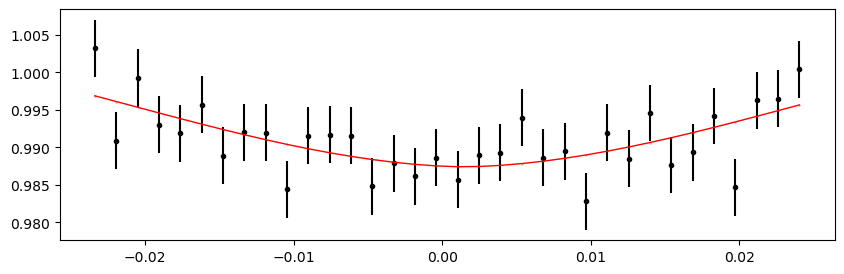

3478.6538544999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.07it/s]


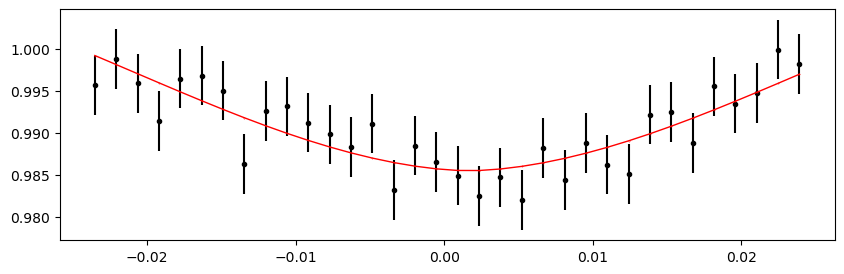

3479.6206534999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.83it/s]


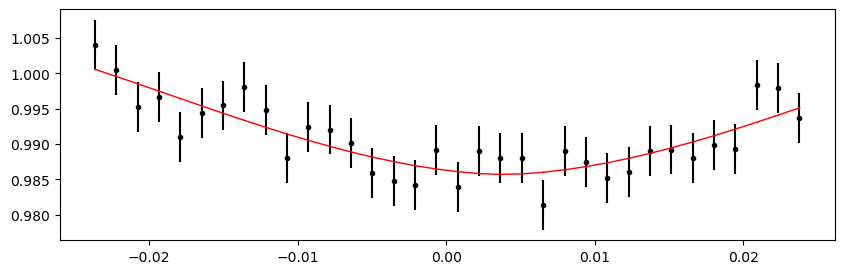

3480.5874525 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.84it/s]


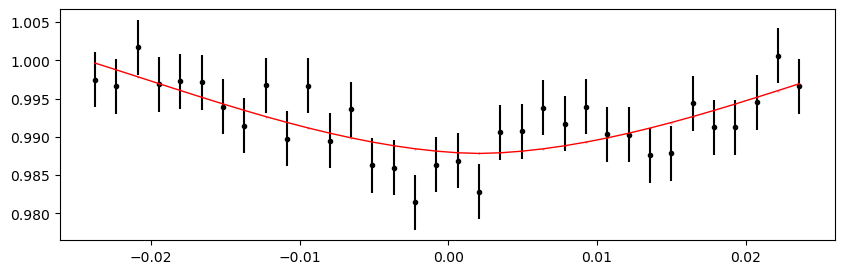

3481.5542514999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.94it/s]


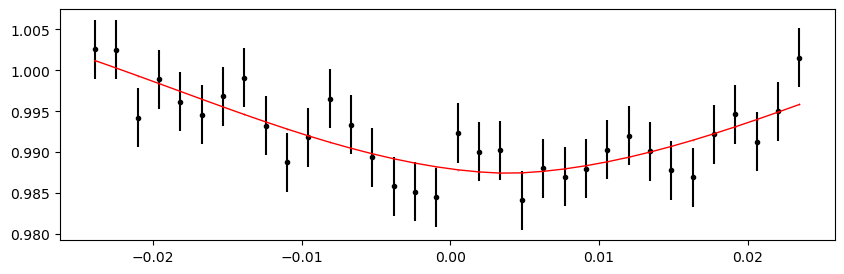

3482.5210504999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 325.99it/s]


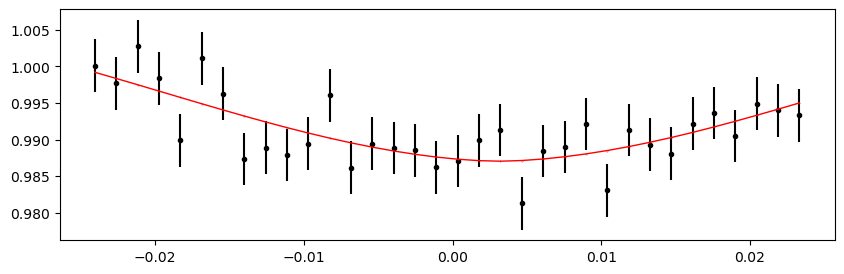

3483.4878495 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.77it/s]


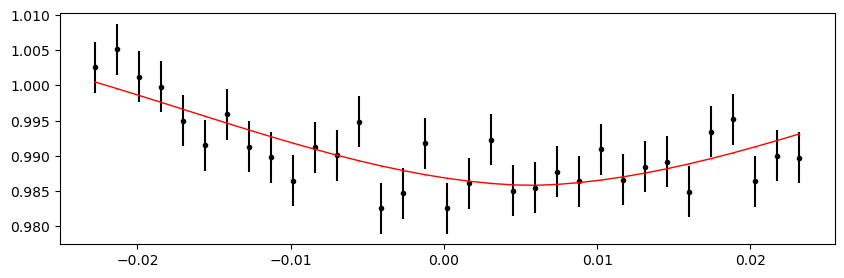

3484.4546484999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.51it/s]


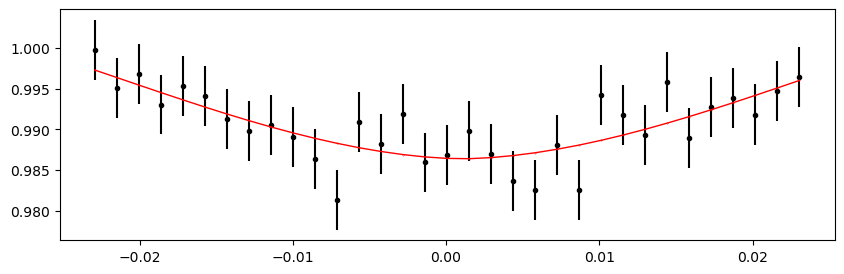

3485.4214475 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.13it/s]


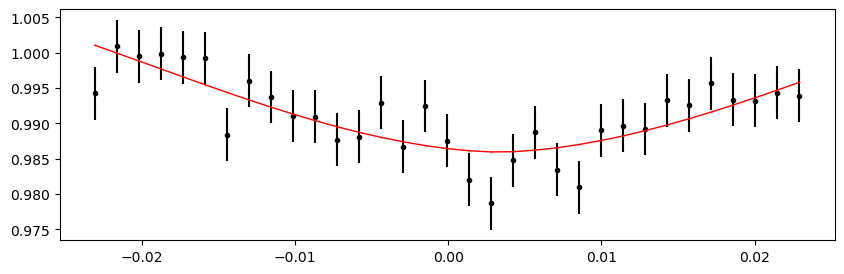

3486.3882464999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.11it/s]


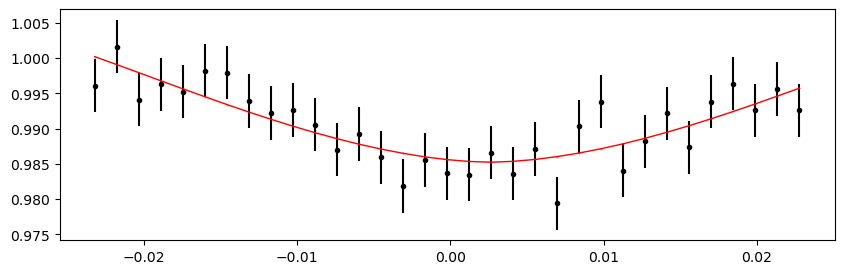

3487.3550454999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.15it/s]


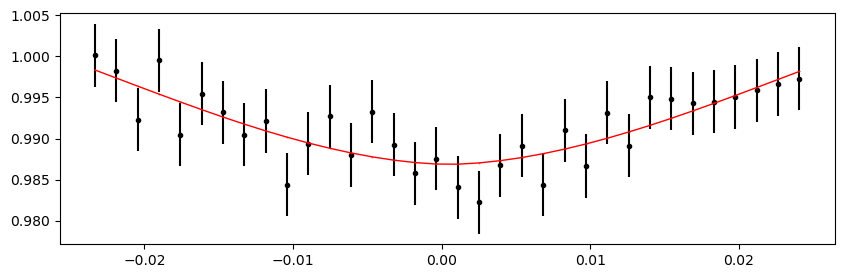

3488.3218444999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 302.88it/s]


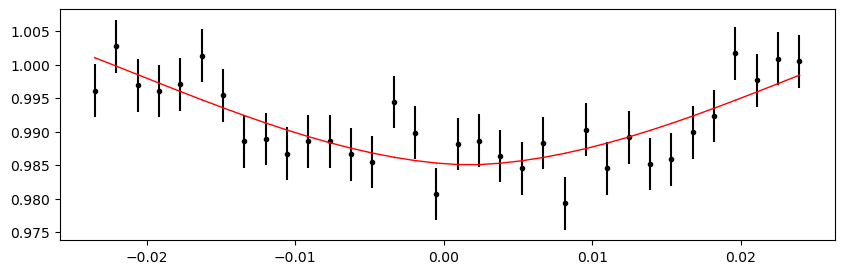

3489.2886435 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:41<00:00, 242.56it/s]


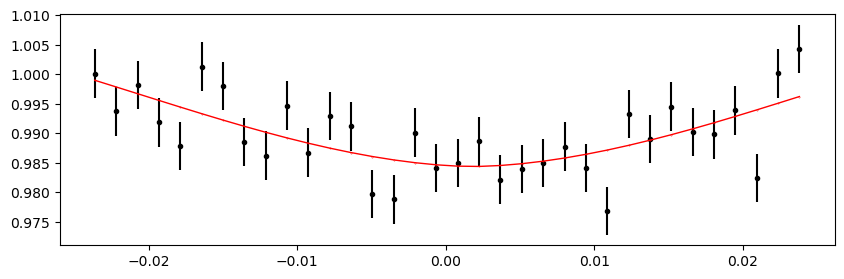

3492.1890404999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.35it/s]


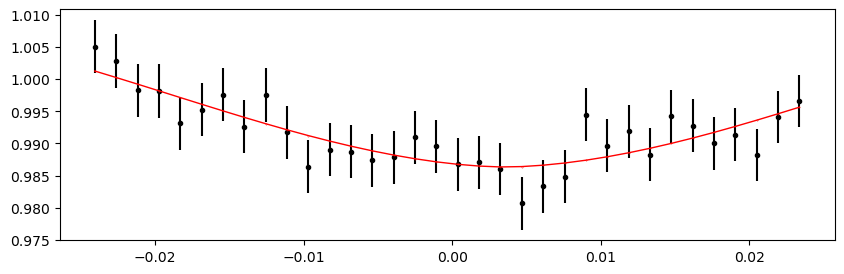

3493.1558394999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.26it/s]


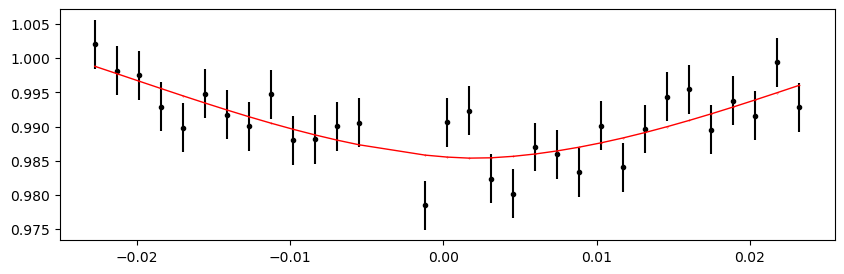

3494.1226385 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.47it/s]


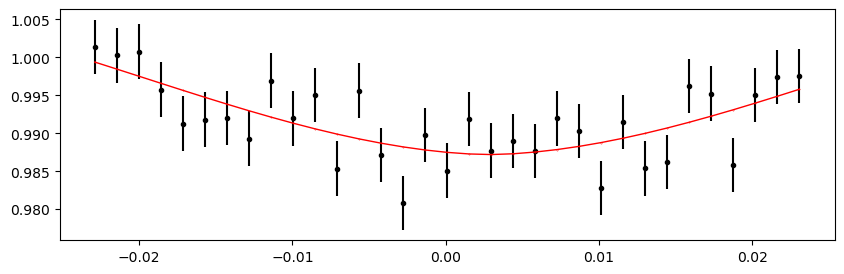

3495.0894375 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 339.06it/s]


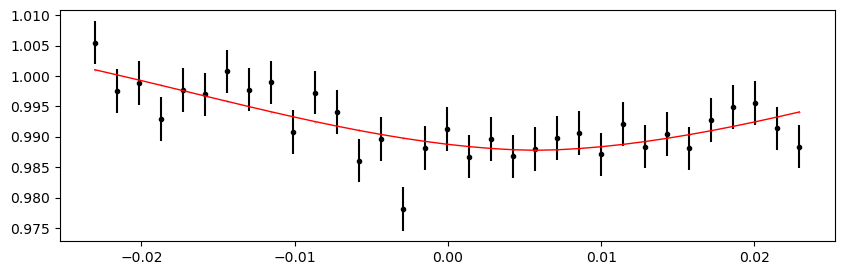

3496.0562364999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 343.93it/s]


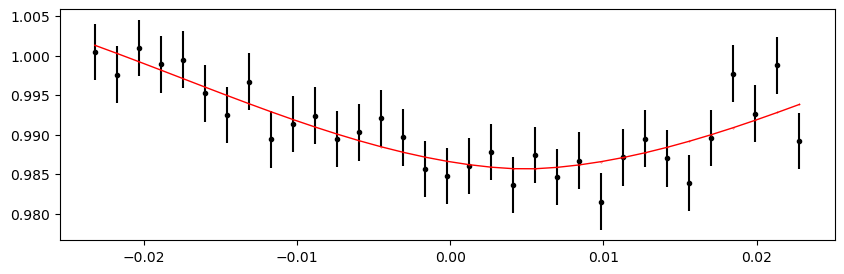

3497.0230354999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.91it/s]


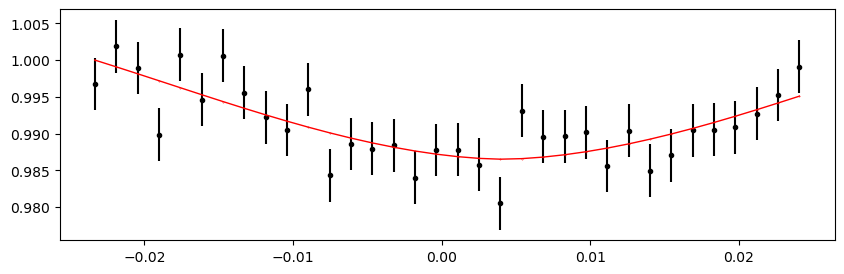

3497.9898344999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.10it/s]


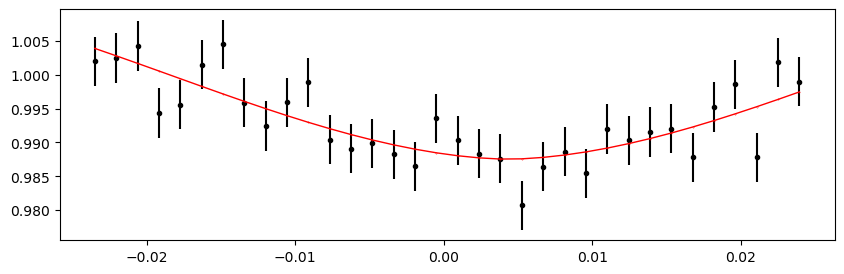

3498.9566335 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.56it/s]


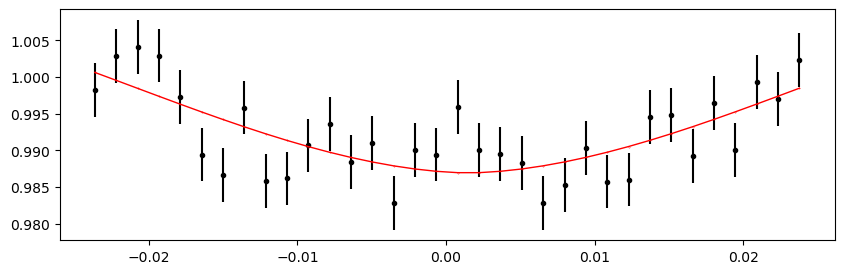

3499.9234324999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.04it/s]


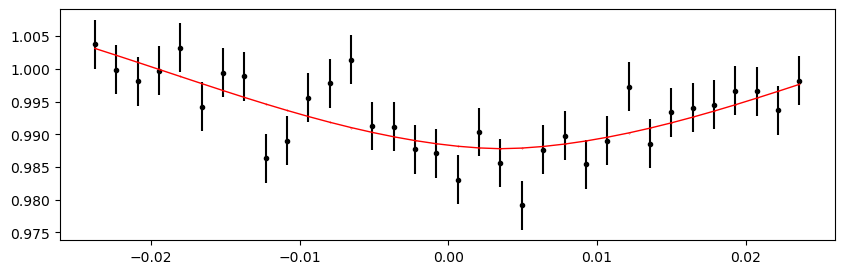

3500.8902314999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.92it/s]


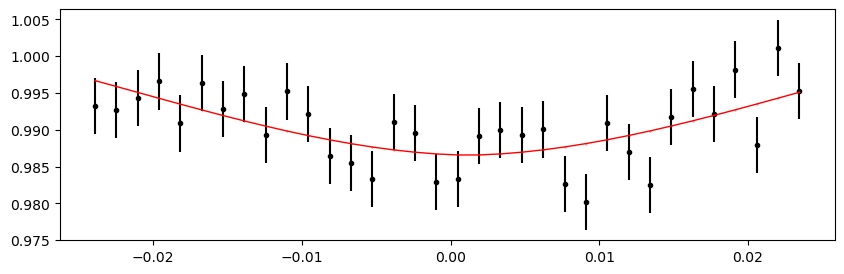

3501.8570304999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.94it/s]


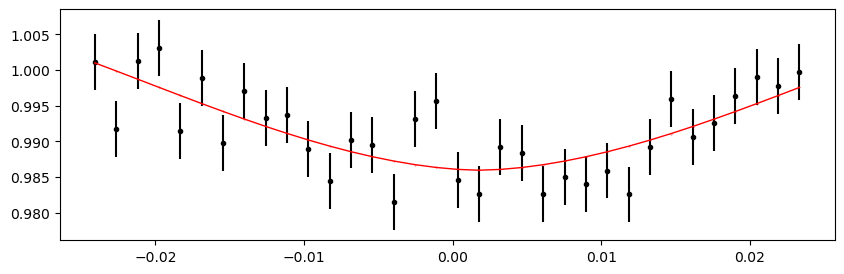

3502.8238294999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 352.21it/s]


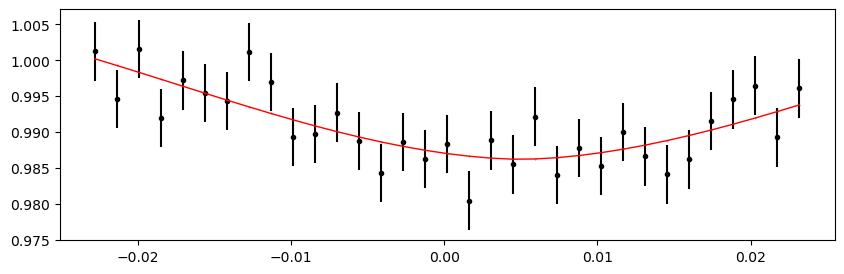

3506.6910255 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.39it/s]


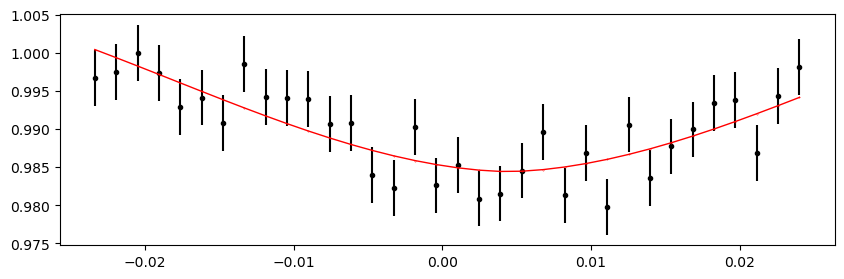

3507.6578244999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.63it/s]


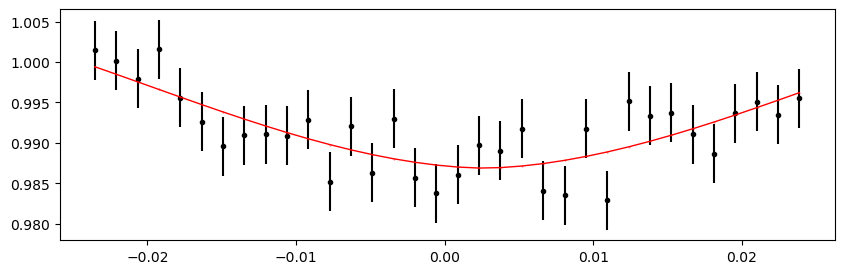

3508.6246235 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.11it/s]


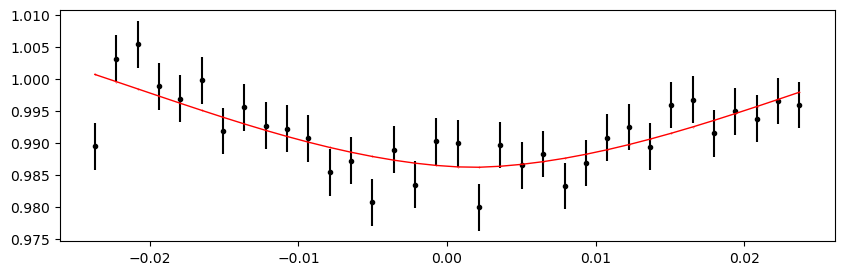

3509.5914224999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.34it/s]


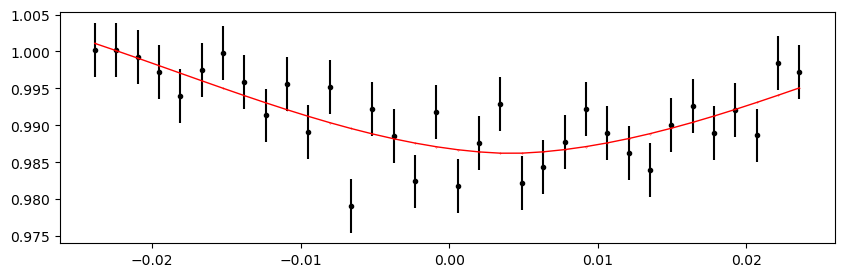

3510.5582214999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.12it/s]


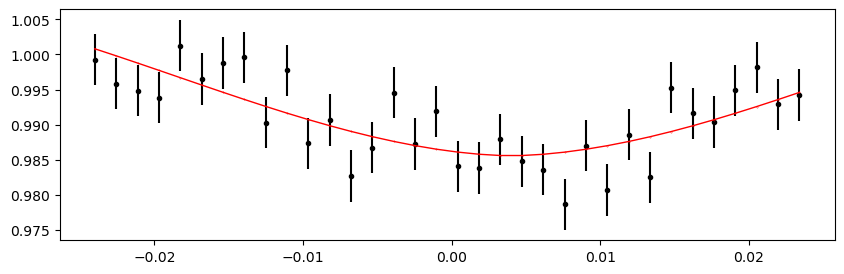

3511.5250204999998 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.63it/s]


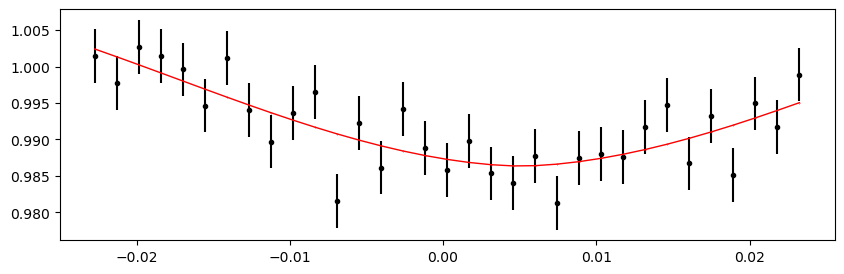

3512.4918195 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.78it/s]


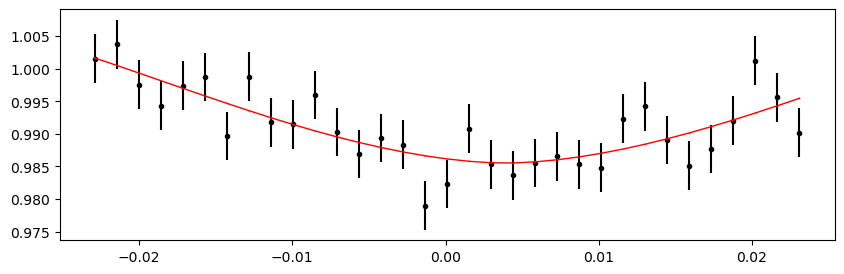

3514.4254174999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.69it/s]


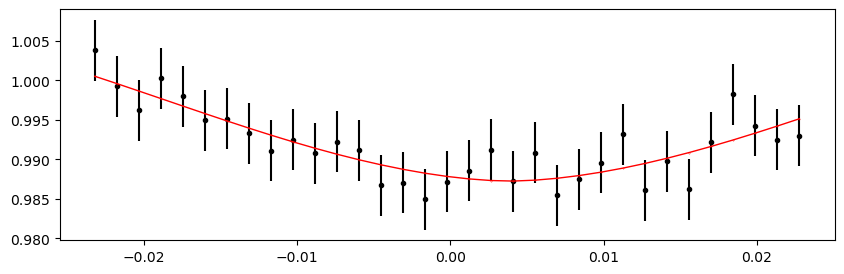

3515.3922164999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.70it/s]


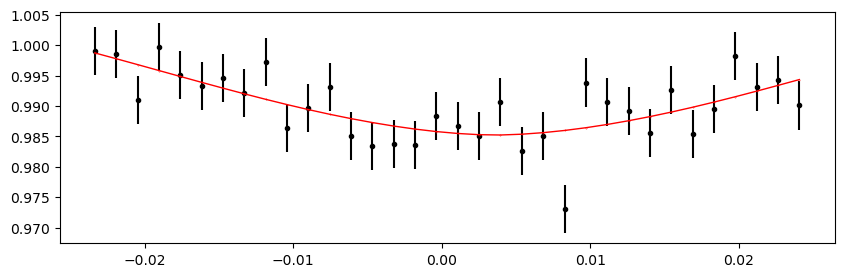

3516.3590154999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.25it/s]


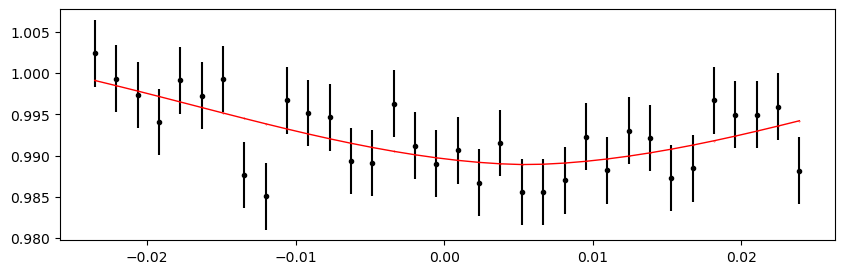

3520.2262114999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 293.23it/s]


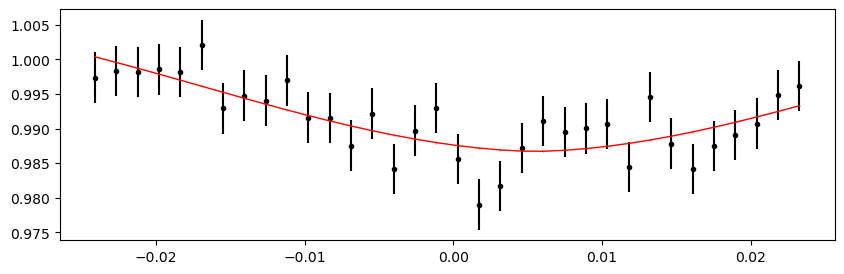

3521.1930104999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 276.42it/s]


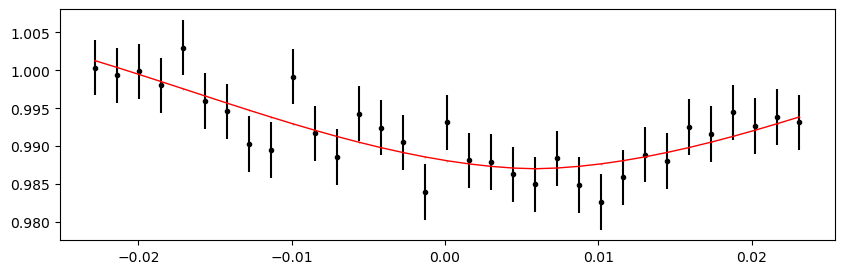

3522.1598095 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.44it/s]


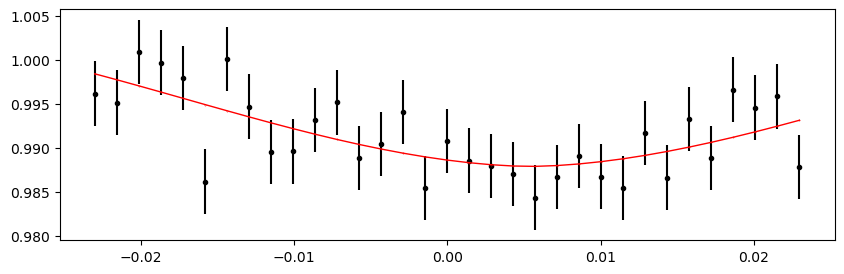

3523.1266084999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 341.48it/s]


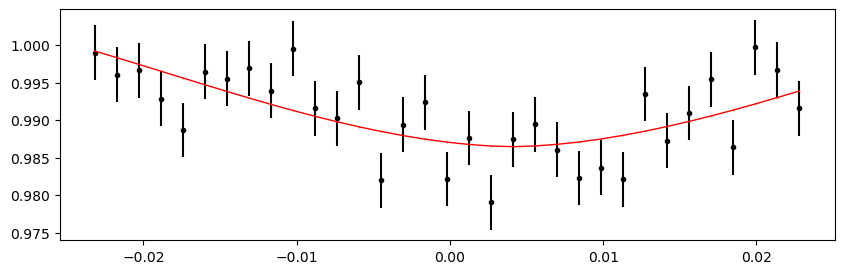

3524.0934074999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.55it/s]


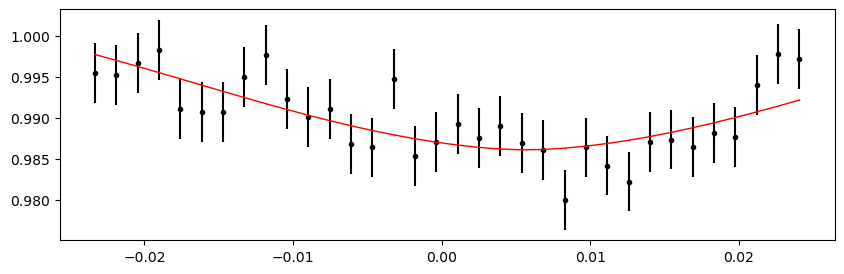

3525.0602064999994 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.95it/s]


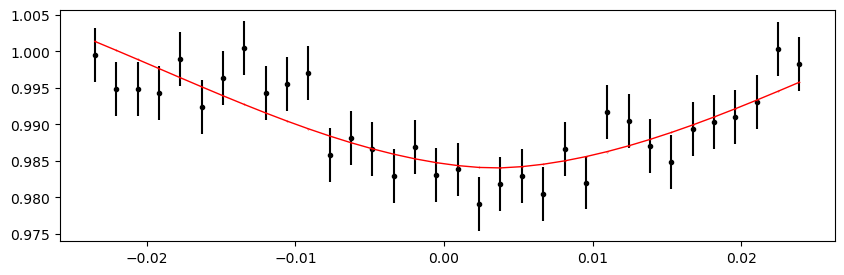

3526.0270054999996 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.51it/s]


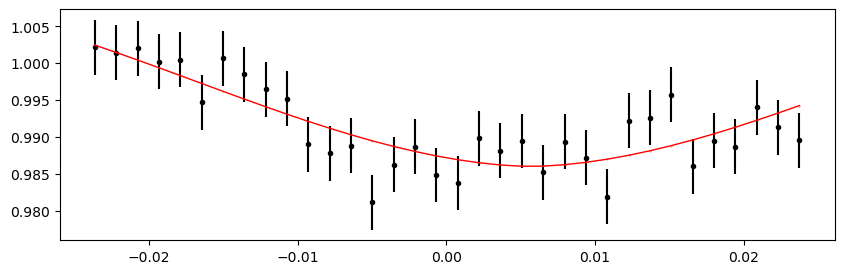

3526.9938045 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 344.47it/s]


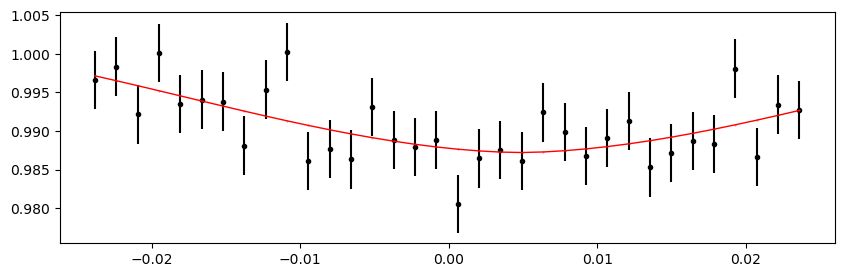

3527.9606034999997 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.10it/s]


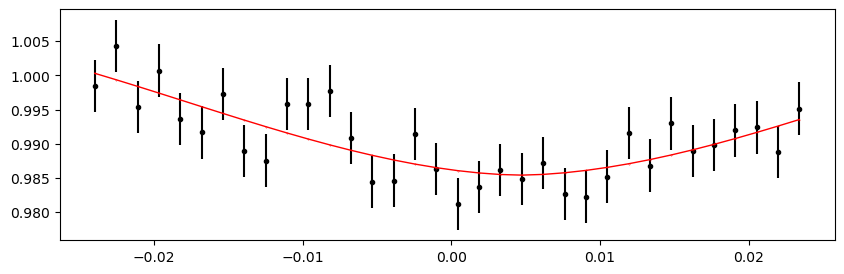

3528.9274024999995 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.49it/s]


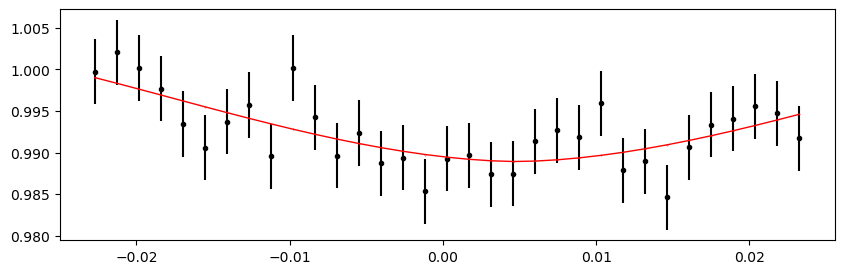

3529.8942015 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 356.07it/s]


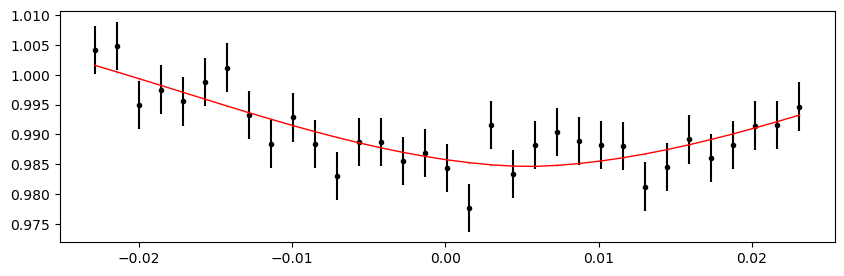

3530.8610005 1.0107342526928313 -0.02429237220533457 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 342.60it/s]


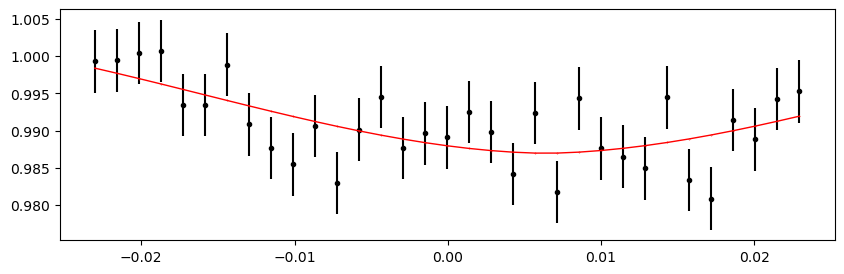

In [29]:
# ---

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=20,
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

Note: 6 data points in df_primary filtered out due to huge O-C error.
Note: 21 data points in in_df_secondary filtered out due to huge O-C error.


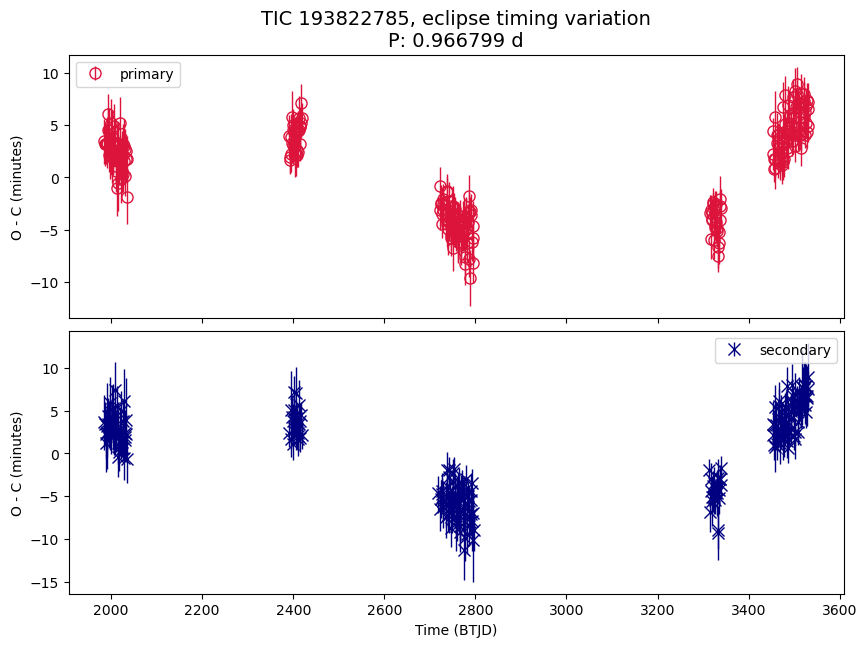

In [31]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

in_df_primary = in_df_primary[in_df_primary.std_mins < 10]  # filter out outliers in error
print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out due to huge O-C error.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    in_df_secondary = in_df_secondary[in_df_secondary.std_mins < 10]  # filter out outliers in error
    print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered out due to huge O-C error.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = Nonel

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"TIC {ticid}, {title_suffix}\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
# plt.ylim(-3, 8)
plt.show()

In [ ]:
# # to help to filter out valeus with huge error
# ax = in_df_primary_all.std_mins.hist(bins=100)
# ax.set_xscale("log")
# ax.set_yscale("log")
# plt.show()

# ax = in_df_secondary_all.std_mins.hist(bins=100)
# ax.set_xscale("log")
# ax.set_yscale("log")
# plt.show()

### O-C Plot, Zoom In

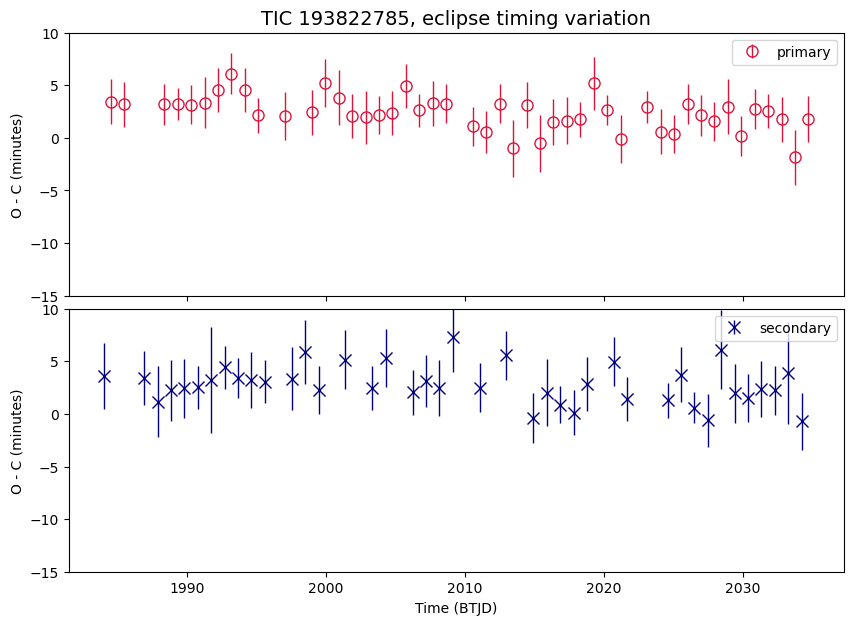

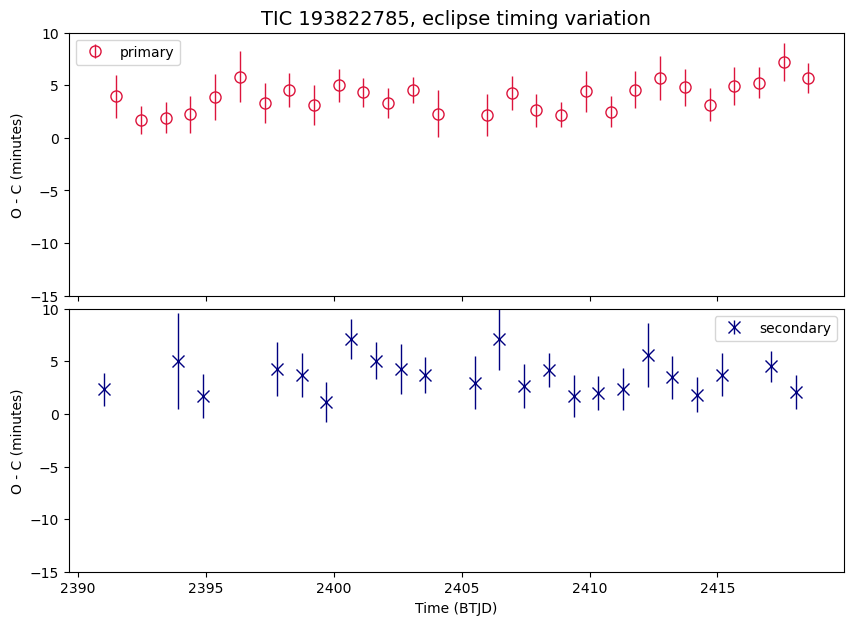

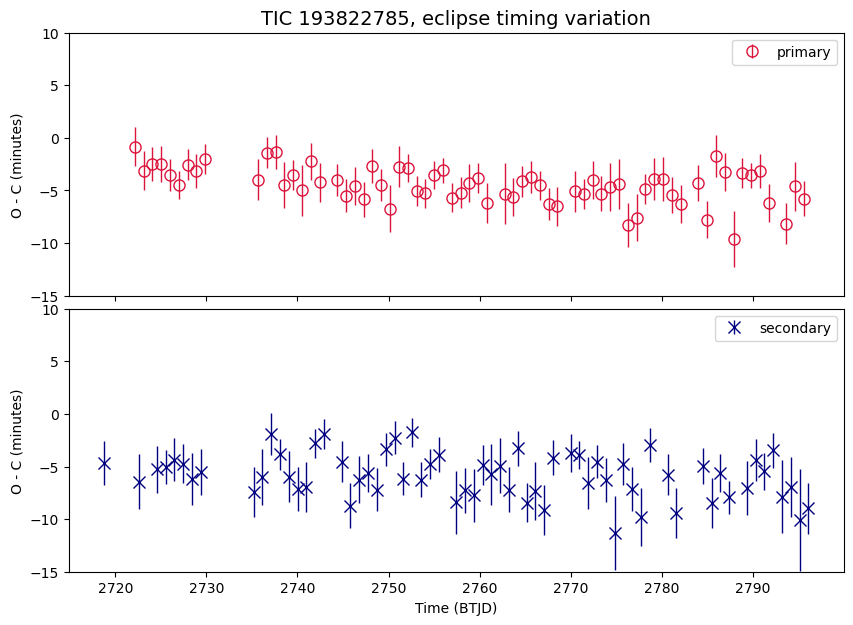

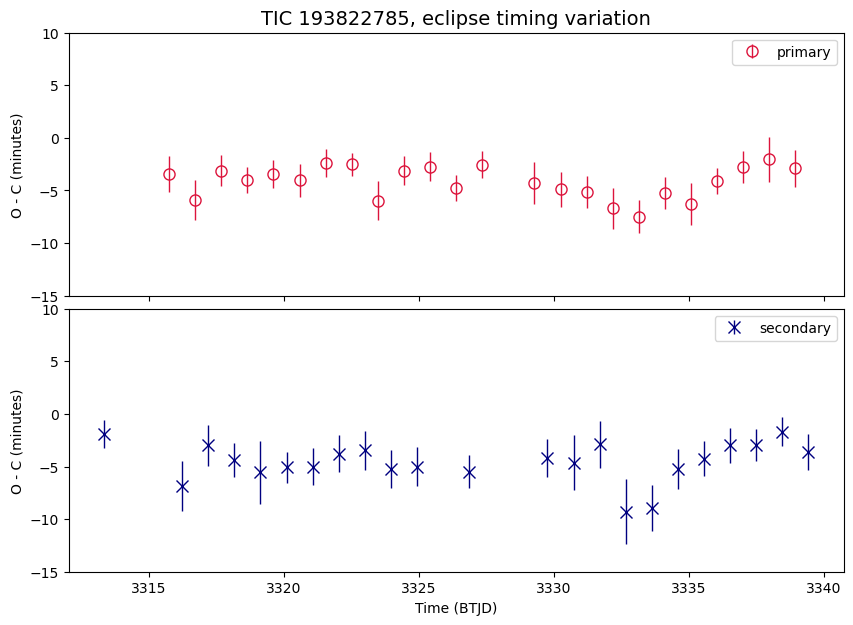

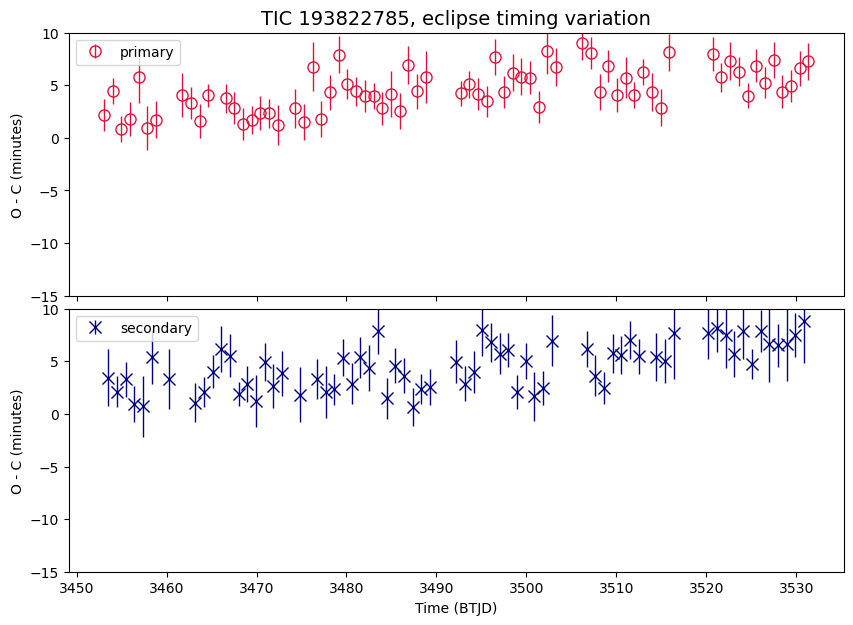

In [34]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    (1900, 2100),
    (2300, 2500),
    (2700, 2800),
    (3300, 3400),
    (3400, 3600),
]

def tweak_axs_list(axs_list):
    for axs in axs_list:
        axs[0].set_ylim(-15, 10)
        axs[1].set_ylim(-15, 10)

    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    # ax = axs_list[0][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")
    # ax = axs_list[1][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")

    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]

        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]

        # axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
        #                marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]

            # axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
            #                marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                            lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();

        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)

        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

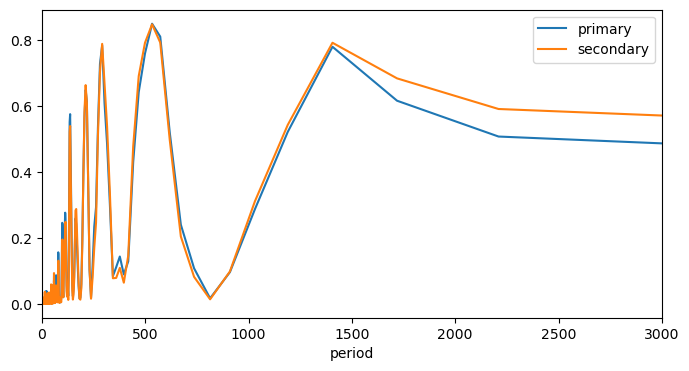

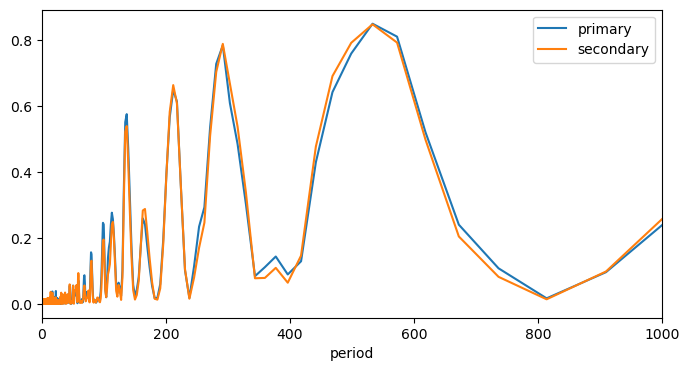

In [35]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')

plt.xlabel("period")

plt.legend()
plt.xlim(0, 3000)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))

    plt.plot(1/frequency, power, label = 'primary')

    if t0_secondary is not None:
        plt.plot(1/frequency_s, power_s, label = 'secondary')

    plt.xlabel("period")

    plt.legend()
    plt.xlim(0, 1000)
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [36]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

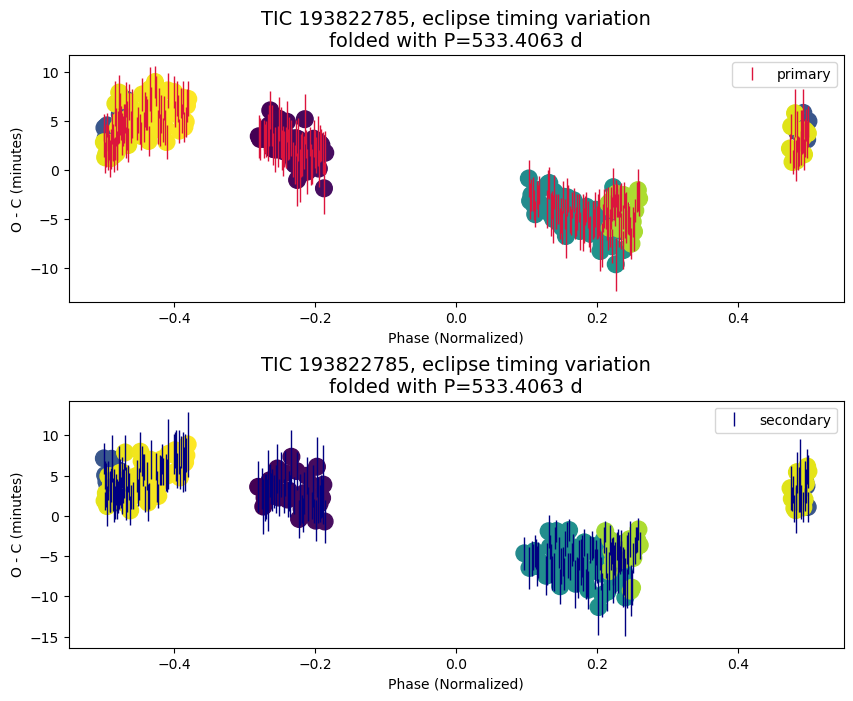

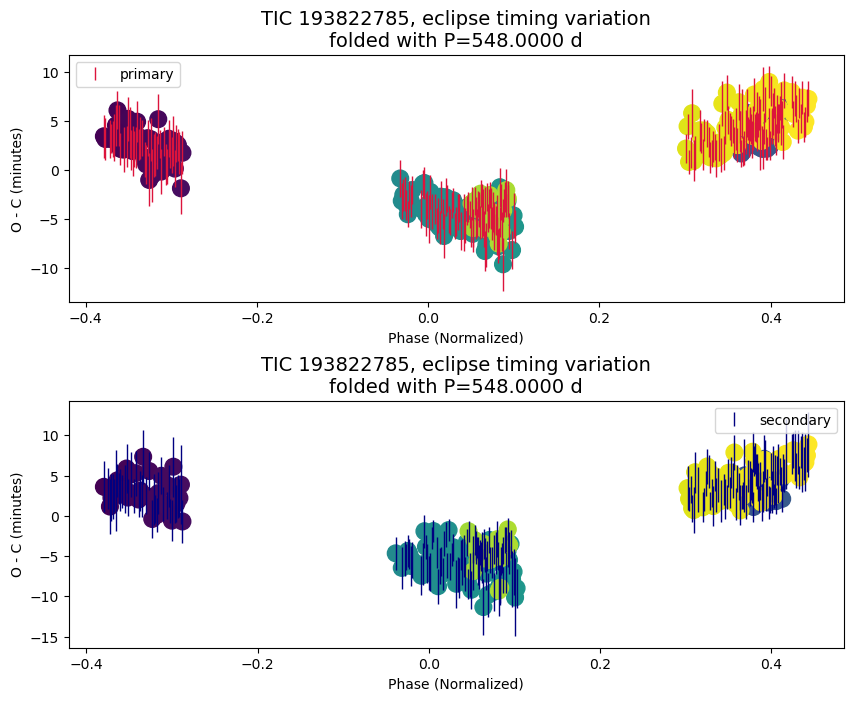

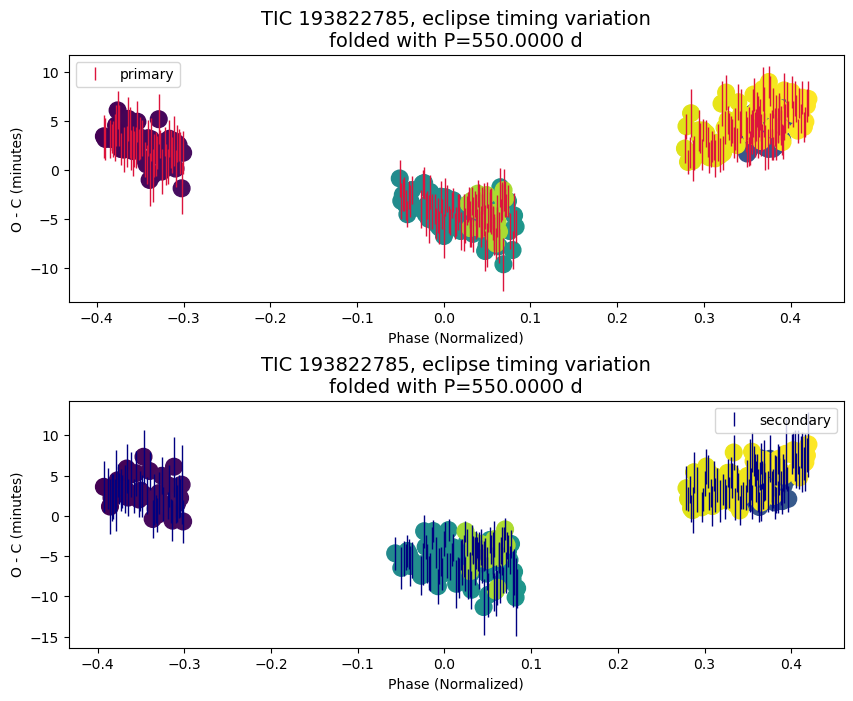

In [40]:
%matplotlib inline
# %matplotlib widget

if True:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=None, period_max=None,
        period_min_s=None, period_max_s=None
    )

    axs = plot_oc_folded( # Gaia DR3 NSS SB1 Period
        period=548.,  
        period_s=548.,
    )

    axs = plot_oc_folded( # Gaia DR3 NSS AB Period
        period=550.,  
        period_s=550.,
    )
    
    # tweak_axs(axs)

## Results Summary

In [41]:
# FILL-IN the ETV results / comments
has_etv = "Y"
comments = "O-C suggests non-linear variation (amplitude < 25min)  with a period of ~533 d, correlated, comparable to the period suggested by Gaia DR3 NSS (SB1 and AB)"

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True,
))

,0
tic,193822785
has_etv,Y
comments,"O-C suggests non-linear variation (amplitude < 25min) with a period of ~533 d, correlated, comparable to the period suggested by Gaia DR3 NSS (SB1 and AB)"
period,0.966799
depth_pct_p,1.64
depth_pct_s,2.43
epoch_p,1984.466
epoch_s,1983.9826
num_sectors,10
time_span,1549.54



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
193822785,Y,"O-C suggests non-linear variation (amplitude < 25min)  with a period of ~533 d, correlated, comparable to the period suggested by Gaia DR3 NSS (SB1 and AB)",0.966799,1.64,2.43,1984.466,1983.9826004999998,10,1549.54,1983.63,3533.18

